- regular bayes between 100-1000
- kappa int forced

In [1]:
# General
import numpy as np
import pandas as pd
import os, sys
import optuna

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

#sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [2]:
# ---------------------------------------------------------------------
# 1) Purged/embargoed window function
# ---------------------------------------------------------------------
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None,
        gap_days=3                                      # gap_days: number of days to exclude at the train/validation boundary (purge/embargo) to avoid look‑ahead; set to 0 to disable
    ):
    # 1) Validation window
    val_end   = current_date
    val_start = val_end - pd.DateOffset(years=val_years)
    
    # 2) Train ends just before validation
    train_end = val_start - pd.DateOffset(days=1)
    
    # 3) Max‐length training start
    train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
    if initial_train_start is not None:
        earliest = pd.to_datetime(initial_train_start)
        train_start_candidate = max(train_start_candidate, earliest)
    
    # 4) Enforce min‐length
    if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
        train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
        if initial_train_start is not None:
            train_start_candidate = max(train_start_candidate, earliest)
    
    idx       = full_data.index
    train_idx = idx[(idx >= train_start_candidate) & (idx <= train_end)]
    val_idx   = idx[(idx >= val_start)           & (idx <= val_end)]
    
    # 5) Purge/embargo
    if gap_days > 0:
        if len(train_idx) > gap_days:
            train_idx = train_idx[:-gap_days]
        if len(val_idx)   > gap_days:
            val_idx   = val_idx[gap_days:]
    
    if train_idx.empty or val_idx.empty:
        raise ValueError(
            f"No data for train [{train_start_candidate.date()}-{train_end.date()}] "
            f"or val [{val_start.date()}-{val_end.date()}] after {gap_days}-day gap"
        )
    
    return train_idx[0], train_idx[-1], val_idx[0], val_idx[-1]


# ---------------------------------------------------------------------
# 2) Optuna objective & wrapper
# ---------------------------------------------------------------------
# 1) New evaluator that fits one model & returns Sharpe:
def evaluate_sjm_sharpe(
    lam, kappa,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    # online predict & PnL exactly as before:
    val_states = model.predict_online(X_vl_s)
    pnl = np.zeros(len(val_states))
    prev_pos = 0.0
    for t in range(len(val_states)):
        st = val_states.iloc[t]
        exp_ann = model.ret_[st] * 252
        # position rule:
        if exp_ann > annual_threshold: pos = 1.0
        elif exp_ann < -annual_threshold: pos = -1.0
        else: pos = exp_ann/annual_threshold
        pnl[t] = prev_pos * ar_vl.iloc[t] - abs(pos-prev_pos)*cost_per_100pct
        prev_pos = pos
    sharpe = pnl.mean()/pnl.std(ddof=1)*np.sqrt(252)
    return sharpe

# 2) Rewrite your Optuna objective to use it:
def optuna_objective(
    trial,
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct, annual_threshold
):
    lam   = trial.suggest_float("lambda", 10**2 / 5, 10**3)
    kappa = trial.suggest_float("kappa", 1, np.sqrt(17))
    return evaluate_sjm_sharpe(
        lam, kappa,
        X_tr_s, X_vl_s,
        ar_tr, ar_vl,
        cost_per_100pct, annual_threshold
    )

# 3) In your Bayesian wrapper, return the study:
def bayesian_hyperparam_search(
    X_tr_s, X_vl_s,
    ar_tr, ar_vl,
    cost_per_100pct=0.0030,
    annual_threshold=0.05,
    n_trials=30
):
    study = optuna.create_study(sampler=optuna.samplers.TPESampler(seed=42), direction="maximize")
    study.optimize(
        lambda t: optuna_objective(
            t, X_tr_s, X_vl_s, ar_tr, ar_vl,
            cost_per_100pct, annual_threshold
        ),
        n_trials=n_trials
    )
    return study


# ---------------------------------------------------------------------
# 3) Rolling CV + final‑model fit using Optuna
# ---------------------------------------------------------------------
def rolling_time_series_cv_sjm_long_short_optimized(
    X_train, X_val,
    factor_returns_train, factor_returns_val,
    market_returns_train, market_returns_val,
    cost_per_100pct=0.0030,
    annual_threshold=0.05,
    n_trials=30
):
    # --- align indices & build active returns ---
    tr_idx = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    vl_idx = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    X_tr = X_train.loc[tr_idx]
    X_vl = X_val.loc[vl_idx]
    ar_tr = factor_returns_train.loc[tr_idx] - market_returns_train.loc[tr_idx]
    ar_vl = factor_returns_val.loc[vl_idx]     - market_returns_val.loc[vl_idx]
    
    # --- preprocess ---
    clipper = DataClipperStd(mul=3.0)
    scaler  = StandardScaler()
    
    X_tr_s = pd.DataFrame(
        scaler.fit_transform(clipper.fit_transform(X_tr)),
        index=X_tr.index, columns=X_tr.columns
    )
    X_vl_s = pd.DataFrame(
        scaler.transform(clipper.transform(X_vl)),
        index=X_vl.index, columns=X_vl.columns
    )
    
    # --- Bayesian search ---
    study = bayesian_hyperparam_search(
        X_tr_s, X_vl_s, ar_tr, ar_vl,
        cost_per_100pct, annual_threshold,
        n_trials
    )
    lam, kappa = study.best_params["lambda"], study.best_params["kappa"]
    best_sharpe = study.best_value
    print(f"Optuna best λ={lam:.4f}, κ={kappa}, Sharpe={best_sharpe:.4f}")
    
    # --- fit final SJM on the full train window ---
    model = SparseJumpModel(
        n_components=2,
        max_feats=int(kappa**2),
        jump_penalty=lam,
        cont=False,
        max_iter=30
    )
    model.fit(X_tr_s, ret_ser=ar_tr, sort_by="cumret")
    
    return {
        "best_lambda": lam,
        "best_kappa":  kappa,
        "best_sharpe": best_sharpe,
        "best_model":  model,
        "results_array": None,
        "study": study
    }

In [4]:
# ---------------------------------------------------------------------
# 4) Updated cross‑validation module (run_cv)
# ---------------------------------------------------------------------
def run_cv(
    factors,
    factor_data_dict,
    cv_dates,
    *,
    min_train_years=8,
    max_train_years=12,
    val_years=3,
    initial_train_start=None,
    save_path="0505_30bps_20-1000.parquet",
    make_plots=True,
    cost_per_100pct=0.0030,
    annual_threshold=0.05,
    n_trials=30
):
    records = []
    evolution_plotbuf = []

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            # get purged train/val windows
            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start,
                gap_days=3
            )

            # slice data
            X_train  = filter_date_range(X, train_start, train_end)
            X_val    = filter_date_range(X, val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            # run Optuna‐powered CV
            res = rolling_time_series_cv_sjm_long_short_optimized(
                X_train=X_train,
                X_val=X_val,
                factor_returns_train=fr_train,
                factor_returns_val=fr_val,
                market_returns_train=mr_train,
                market_returns_val=mr_val,
                cost_per_100pct=cost_per_100pct,
                annual_threshold=annual_threshold,
                n_trials=n_trials
            )

            # store results
            records.append({
                "date": cv_end,
                "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end,
                "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })

            # per‐fold Optuna scatter plot
            if make_plots:
                trials = res["study"].trials
                df_t = pd.DataFrame([
                    {"lambda": t.params["lambda"],
                     "kappa":  t.params["kappa"],
                     "value":  t.value}
                    for t in trials
                ])
                plt.figure(figsize=(8,5))
                sc = plt.scatter(
                    df_t["lambda"],
                    df_t["value"],
                    c=df_t["kappa"].astype(float),
                    cmap="viridis",
                    alpha=0.8
                )
                plt.xscale("log")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=0.6)
                plt.colorbar(sc, label='$\\kappa$')
                plt.xlabel("'$\\lambda$' (log scale)")
                plt.ylabel("Validation Sharpe")
                plt.title(f"{fac} | CV cutoff {cv_end.date()} - Optuna trials")
                plt.grid(True, ls=":")
                plt.tight_layout()
                plt.show()

    # assemble and save
    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # overall λ/κ evolution
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9,5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$')
            ax1.set_ylabel('$\\lambda$', color="tab:blue")
            ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$')
            ax2.set_ylabel('$\\kappa$', color="tab:red")
            ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_xlabel("CV end-date")
            ax1.set_title(f"{fac} — hyperparameter evolution")
            ax1.grid(True, ls=":")
            ax1.legend(loc="upper left")
            ax2.legend(loc="upper right")
            plt.tight_layout()
            plt.show()

    return cv_df


[I 2025-05-05 23:27:55,852] A new study created in memory with name: no-name-6d1353df-4ba1-4e3c-adf0-700976382960
[I 2025-05-05 23:27:59,706] Trial 0 finished with value: 0.027023896374112018 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.027023896374112018.
[I 2025-05-05 23:28:02,343] Trial 1 finished with value: 0.027023896374112212 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.027023896374112212.
[I 2025-05-05 23:28:07,202] Trial 2 finished with value: -0.31451218377363194 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.027023896374112212.
[I 2025-05-05 23:28:12,370] Trial 3 finished with value: -0.6389652621118322 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.027023896374112212.
[I 2025-05-05 23:28:16,170] Trial 4 finished with value: 0.02702389637411

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.0270


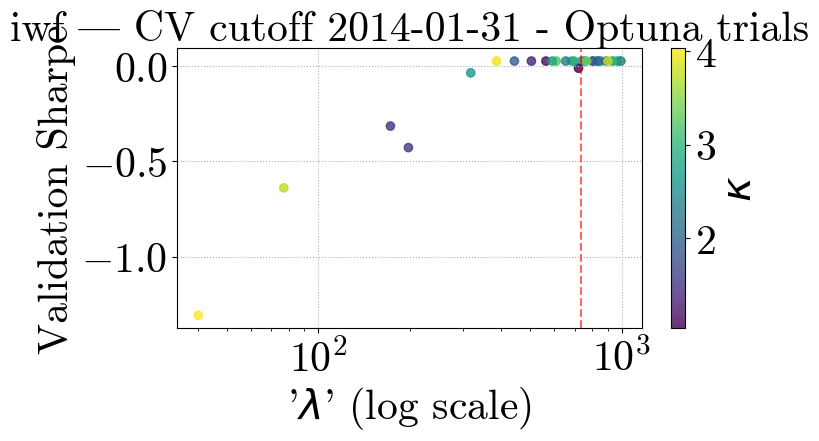

[I 2025-05-05 23:29:12,269] A new study created in memory with name: no-name-ec5be1ec-6ccd-4783-a83b-f484861baec1
[I 2025-05-05 23:29:14,840] Trial 0 finished with value: 0.7653500945481031 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7653500945481031.
[I 2025-05-05 23:29:17,868] Trial 1 finished with value: 0.7653500945481031 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7653500945481031.
[I 2025-05-05 23:29:22,490] Trial 2 finished with value: 0.3656166131818071 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.7653500945481031.
[I 2025-05-05 23:29:27,622] Trial 3 finished with value: 0.7828523775468961 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.7828523775468961.
[I 2025-05-05 23:29:30,838] Trial 4 finished with value: 0.7653500945481031 and paramete

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.7829


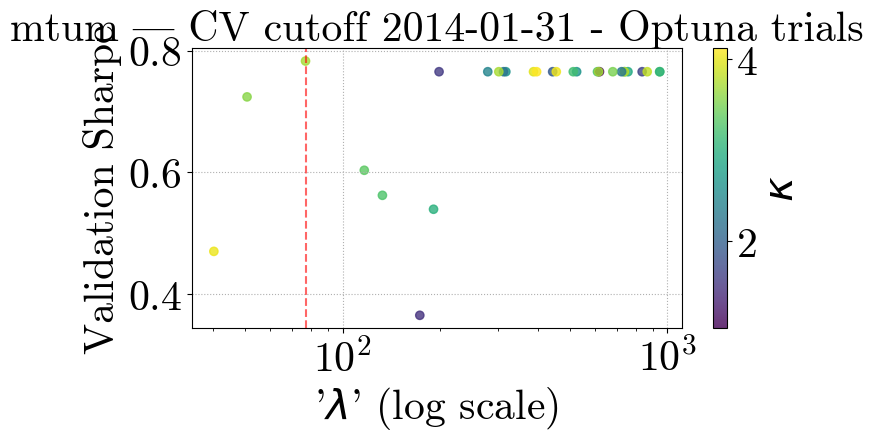

[I 2025-05-05 23:30:52,367] A new study created in memory with name: no-name-3a780dc3-ff71-4f24-abfa-a52157e0e21e
[I 2025-05-05 23:30:54,720] Trial 0 finished with value: -0.5019127021406803 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5019127021406803.
[I 2025-05-05 23:30:56,836] Trial 1 finished with value: -0.7326722789684819 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5019127021406803.
[I 2025-05-05 23:30:59,671] Trial 2 finished with value: -0.585925817753053 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5019127021406803.
[I 2025-05-05 23:31:04,724] Trial 3 finished with value: -1.2103719456709592 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.5019127021406803.
[I 2025-05-05 23:31:06,868] Trial 4 finished with value: -0.7326722789684819 and 

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6638


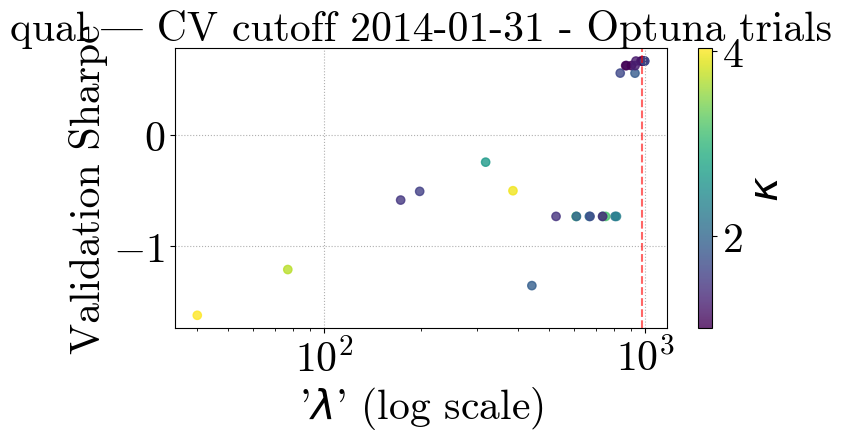

[I 2025-05-05 23:32:10,701] A new study created in memory with name: no-name-360f5197-c355-4bf7-b96a-f437257cf6d7
[I 2025-05-05 23:32:13,801] Trial 0 finished with value: -0.256623463465352 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.256623463465352.
[I 2025-05-05 23:32:16,053] Trial 1 finished with value: -0.5107547537489151 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.256623463465352.
[I 2025-05-05 23:32:22,519] Trial 2 finished with value: -0.15524475066603674 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.15524475066603674.
[I 2025-05-05 23:32:28,036] Trial 3 finished with value: -0.0898027390292721 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.0898027390292721.
[I 2025-05-05 23:32:31,038] Trial 4 finished with value: 0.02038855505663707 and 

Optuna best λ=416.9228, κ=3.8260542456916884, Sharpe=0.1393


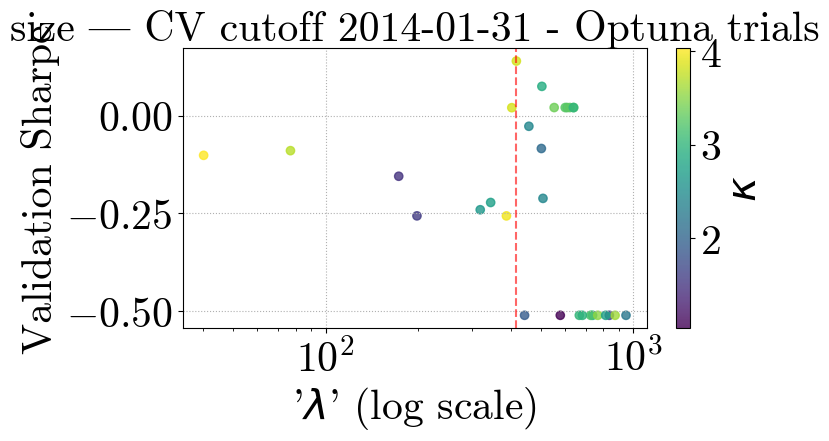

[I 2025-05-05 23:33:45,608] A new study created in memory with name: no-name-d13bacdb-ad15-4086-8a25-c9eafc0c6d84
[I 2025-05-05 23:33:49,520] Trial 0 finished with value: -0.9109602201726829 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.9109602201726829.
[I 2025-05-05 23:33:53,585] Trial 1 finished with value: -0.35193793049390665 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.35193793049390665.
[I 2025-05-05 23:34:00,503] Trial 2 finished with value: -0.32548550588610425 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.32548550588610425.
[I 2025-05-05 23:34:08,020] Trial 3 finished with value: -0.6076224580401476 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.32548550588610425.
[I 2025-05-05 23:34:12,349] Trial 4 finished with value: -0.351937930493906

Optuna best λ=186.8792, κ=1.0395373178924283, Sharpe=-0.2057


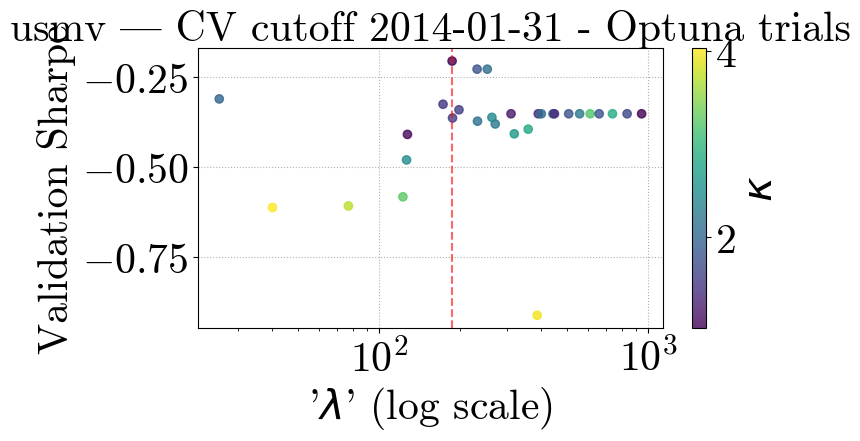

[I 2025-05-05 23:35:52,416] A new study created in memory with name: no-name-4d182328-97ba-4d7d-92bd-a1b3d6b3afac
[I 2025-05-05 23:35:55,883] Trial 0 finished with value: -0.17498191399749566 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.17498191399749566.
[I 2025-05-05 23:35:58,064] Trial 1 finished with value: 0.20078535090157082 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.20078535090157082.
[I 2025-05-05 23:36:01,781] Trial 2 finished with value: 0.038805016663474405 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.20078535090157082.
[I 2025-05-05 23:36:07,448] Trial 3 finished with value: 0.04850504198946965 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.20078535090157082.
[I 2025-05-05 23:36:09,567] Trial 4 finished with value: 0.3703126251643643 a

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.5498


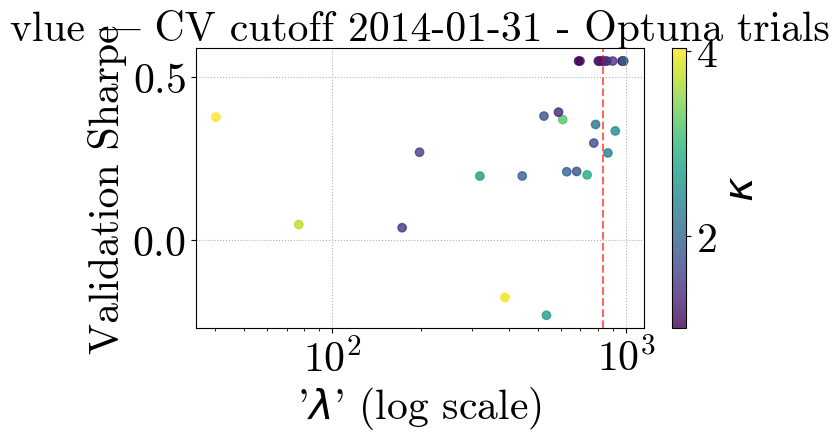

[I 2025-05-05 23:37:11,552] A new study created in memory with name: no-name-7ded811b-e4a9-4f4b-a575-b687fcf29f86
[I 2025-05-05 23:37:16,300] Trial 0 finished with value: -0.20762306167026892 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.20762306167026892.
[I 2025-05-05 23:37:20,497] Trial 1 finished with value: -0.20762306167026892 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.20762306167026892.
[I 2025-05-05 23:37:26,568] Trial 2 finished with value: 0.006326755010185621 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.006326755010185621.
[I 2025-05-05 23:37:33,666] Trial 3 finished with value: -0.7011990052982806 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.006326755010185621.
[I 2025-05-05 23:37:38,035] Trial 4 finished with value: -0.2076230616702

Optuna best λ=203.3695, κ=3.094032317267148, Sharpe=0.0225


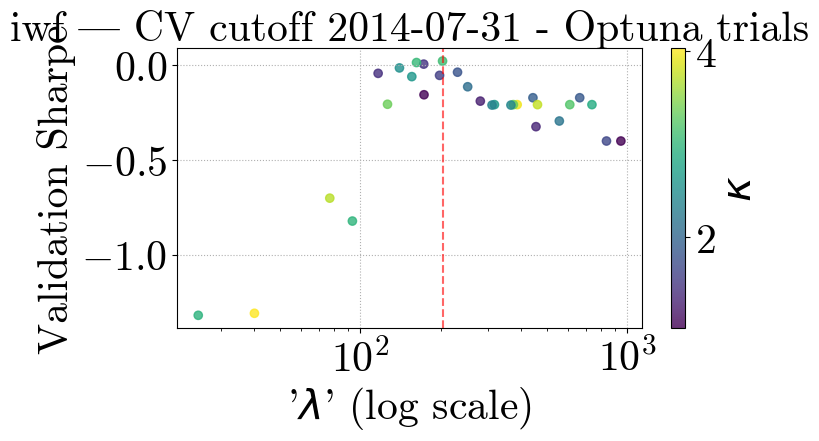

[I 2025-05-05 23:39:44,501] A new study created in memory with name: no-name-9facf2a9-1335-4214-b2ec-2bed5bae2b18
[I 2025-05-05 23:39:47,717] Trial 0 finished with value: 0.3788166803849276 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3788166803849276.
[I 2025-05-05 23:39:50,894] Trial 1 finished with value: 0.3788166803849276 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3788166803849276.
[I 2025-05-05 23:39:55,696] Trial 2 finished with value: 0.3990178776914337 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.3990178776914337.
[I 2025-05-05 23:40:02,448] Trial 3 finished with value: 0.3875850322975458 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.3990178776914337.
[I 2025-05-05 23:40:06,149] Trial 4 finished with value: 0.3788166803849276 and paramete

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4480


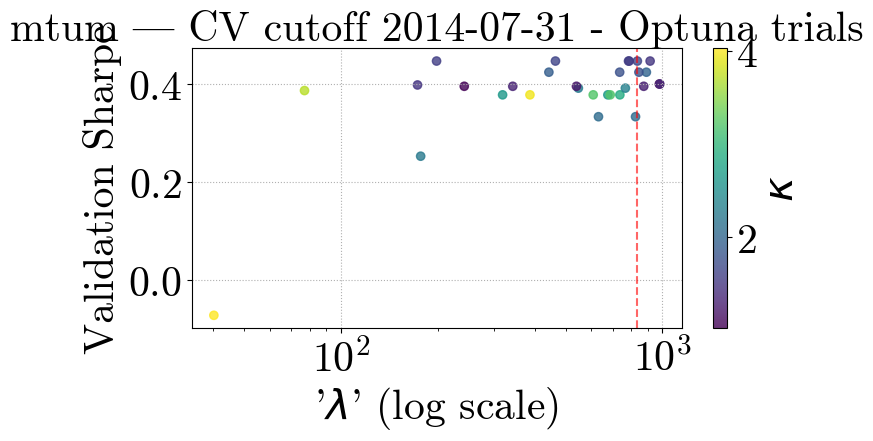

[I 2025-05-05 23:41:33,863] A new study created in memory with name: no-name-b111b11f-dfa6-4dbf-a54d-95e887424e8d
[I 2025-05-05 23:41:36,764] Trial 0 finished with value: 0.05253478012279756 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.05253478012279756.
[I 2025-05-05 23:41:39,097] Trial 1 finished with value: 0.01063091798180235 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.05253478012279756.
[I 2025-05-05 23:41:43,398] Trial 2 finished with value: 0.16212435095025932 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.16212435095025932.
[I 2025-05-05 23:41:48,966] Trial 3 finished with value: -0.49066150662876773 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.16212435095025932.
[I 2025-05-05 23:41:51,496] Trial 4 finished with value: 0.01063091798180235 an

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.1621


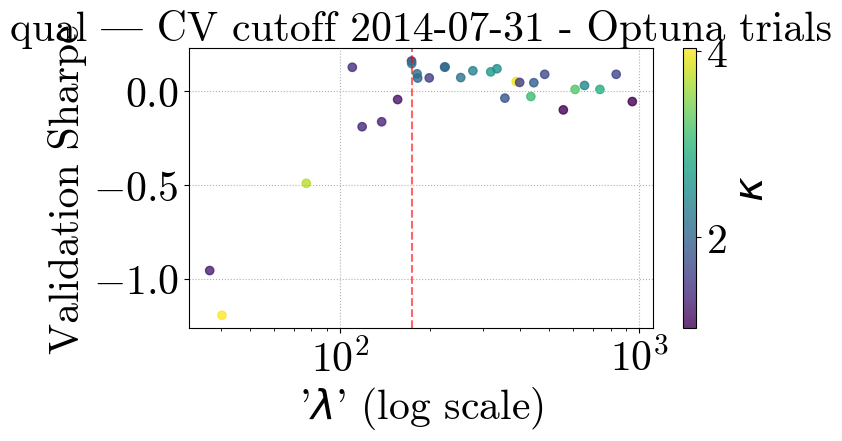

[I 2025-05-05 23:43:31,262] A new study created in memory with name: no-name-f7d12957-b813-40ae-b4e9-b2360e6a64b9
[I 2025-05-05 23:43:34,881] Trial 0 finished with value: -0.03601388362215 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.03601388362215.
[I 2025-05-05 23:43:38,345] Trial 1 finished with value: 0.010884258774098429 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.010884258774098429.
[I 2025-05-05 23:43:46,111] Trial 2 finished with value: 0.02602575889468316 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.02602575889468316.
[I 2025-05-05 23:43:56,277] Trial 3 finished with value: -0.012486894801472142 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.02602575889468316.
[I 2025-05-05 23:43:59,529] Trial 4 finished with value: 0.2620812097673702 and 

Optuna best λ=491.6627, κ=2.291554963104842, Sharpe=0.3024


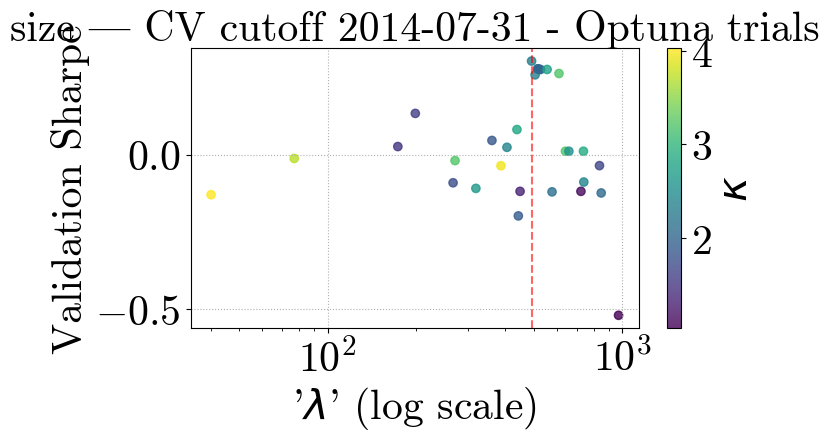

[I 2025-05-05 23:45:28,906] A new study created in memory with name: no-name-eeed80a8-c008-46b0-a24c-0f228cd0e4bc
[I 2025-05-05 23:45:33,897] Trial 0 finished with value: 0.4245288911681506 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4245288911681506.
[I 2025-05-05 23:45:36,345] Trial 1 finished with value: 0.2581848006976477 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4245288911681506.
[I 2025-05-05 23:45:42,694] Trial 2 finished with value: 0.4516349463694474 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4516349463694474.
[I 2025-05-05 23:45:48,743] Trial 3 finished with value: -0.19836939342541932 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4516349463694474.
[I 2025-05-05 23:45:51,880] Trial 4 finished with value: 0.2581848006976477 and parame

Optuna best λ=320.4090, κ=1.4875454939234798, Sharpe=0.5524


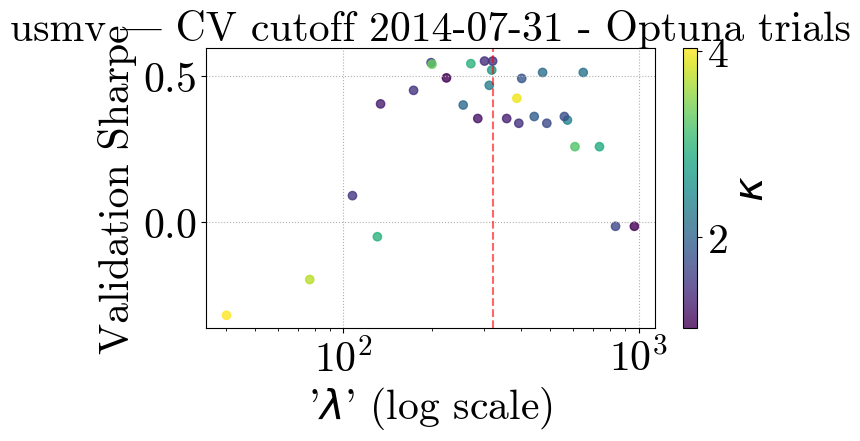

[I 2025-05-05 23:47:36,296] A new study created in memory with name: no-name-4d822afd-905c-45d2-8646-239c2be05f27
[I 2025-05-05 23:47:40,614] Trial 0 finished with value: 0.9011095496348132 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9011095496348132.
[I 2025-05-05 23:47:44,044] Trial 1 finished with value: 1.3419251184841259 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.3419251184841259.
[I 2025-05-05 23:47:47,565] Trial 2 finished with value: 0.9629123815286924 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.3419251184841259.
[I 2025-05-05 23:47:52,692] Trial 3 finished with value: 0.09896266389138454 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.3419251184841259.
[I 2025-05-05 23:47:56,181] Trial 4 finished with value: 1.2841317051914334 and paramet

Optuna best λ=823.3549, κ=1.032158511026232, Sharpe=1.4357


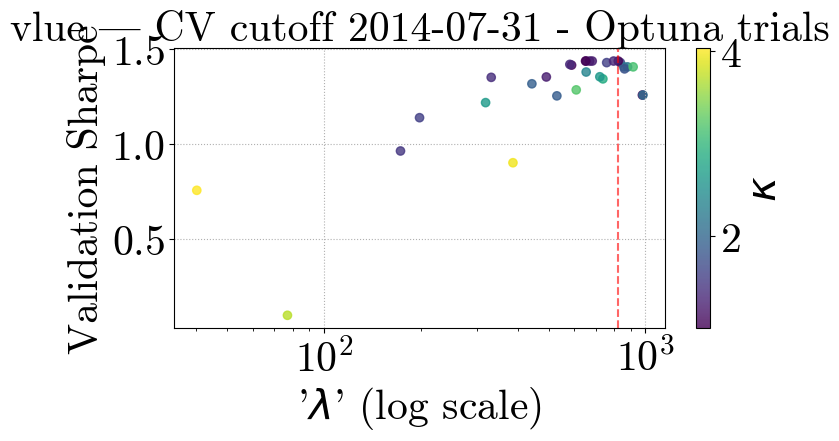

[I 2025-05-05 23:49:00,662] A new study created in memory with name: no-name-446e0834-23fc-4a70-b562-1bf977cef13b
[I 2025-05-05 23:49:05,094] Trial 0 finished with value: 0.15968279665153512 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.15968279665153512.
[I 2025-05-05 23:49:06,795] Trial 1 finished with value: 0.46287668572476537 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.46287668572476537.
[I 2025-05-05 23:49:14,244] Trial 2 finished with value: 0.15968279665153529 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.46287668572476537.
[I 2025-05-05 23:49:23,159] Trial 3 finished with value: -1.1953346644197242 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.46287668572476537.
[I 2025-05-05 23:49:26,989] Trial 4 finished with value: 0.15968279665153512 and

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.4629


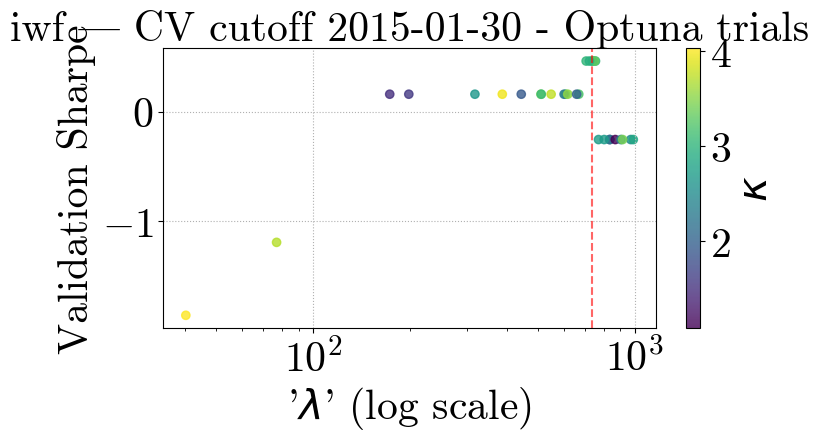

[I 2025-05-05 23:50:41,693] A new study created in memory with name: no-name-6ecf5bd1-d857-4e2f-8054-a14470465b3c
[I 2025-05-05 23:50:44,993] Trial 0 finished with value: 0.9964680327204499 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9964680327204499.
[I 2025-05-05 23:50:48,227] Trial 1 finished with value: 0.9964680327204499 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.9964680327204499.
[I 2025-05-05 23:50:53,560] Trial 2 finished with value: 0.9964680327204497 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.9964680327204499.
[I 2025-05-05 23:51:01,326] Trial 3 finished with value: 0.6774103148195274 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.9964680327204499.
[I 2025-05-05 23:51:04,646] Trial 4 finished with value: 0.9964680327204499 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.9965


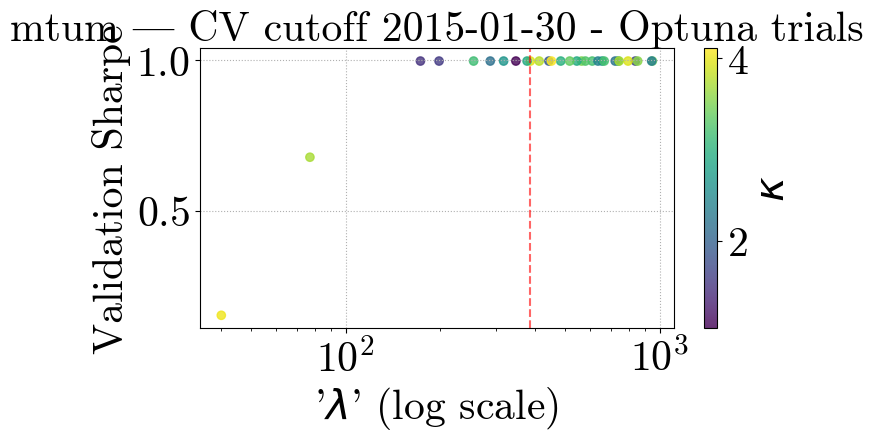

[I 2025-05-05 23:52:38,957] A new study created in memory with name: no-name-8f76a0d8-a2aa-49dd-8b9a-076f699e9596
[I 2025-05-05 23:52:42,426] Trial 0 finished with value: -0.31144902870764424 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.31144902870764424.
[I 2025-05-05 23:52:45,107] Trial 1 finished with value: -0.31144902870764424 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.31144902870764424.
[I 2025-05-05 23:52:51,226] Trial 2 finished with value: -0.3114490287076443 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.31144902870764424.
[I 2025-05-05 23:52:56,791] Trial 3 finished with value: -1.2933375733780412 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.31144902870764424.
[I 2025-05-05 23:52:59,823] Trial 4 finished with value: -0.31144902870764

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.2251


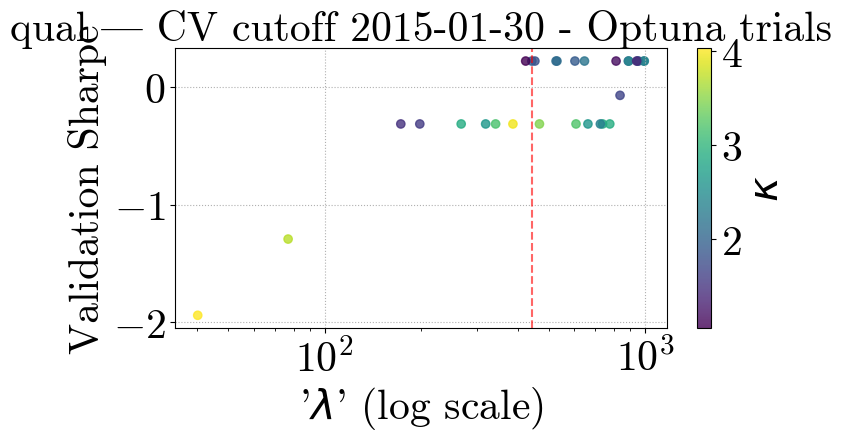

[I 2025-05-05 23:54:44,606] A new study created in memory with name: no-name-fb28b396-842b-4f12-8763-8fe8330f1714
[I 2025-05-05 23:54:48,141] Trial 0 finished with value: -0.802620413785341 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.802620413785341.
[I 2025-05-05 23:54:51,990] Trial 1 finished with value: -0.6114095214868447 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6114095214868447.
[I 2025-05-05 23:54:58,789] Trial 2 finished with value: -0.6884918023487735 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6114095214868447.
[I 2025-05-05 23:55:05,125] Trial 3 finished with value: -0.3243584926634864 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.3243584926634864.
[I 2025-05-05 23:55:08,792] Trial 4 finished with value: -0.6114095214868447 and p

Optuna best λ=27.3964, κ=3.9798232276603978, Sharpe=-0.0037


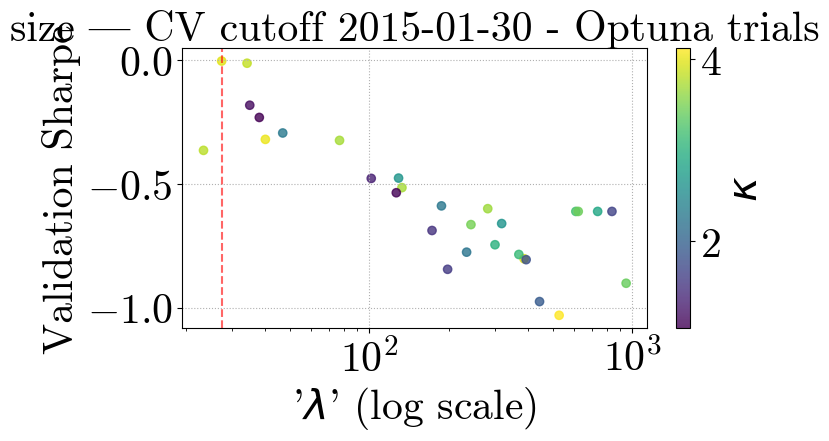

[I 2025-05-05 23:57:18,887] A new study created in memory with name: no-name-3f3e5036-08ba-4081-a912-2f62e932ec95
[I 2025-05-05 23:57:23,205] Trial 0 finished with value: -0.20325252053507437 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.20325252053507437.
[I 2025-05-05 23:57:26,839] Trial 1 finished with value: -0.2032525205350745 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.20325252053507437.
[I 2025-05-05 23:57:31,769] Trial 2 finished with value: -0.20325252053507456 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.20325252053507437.
[I 2025-05-05 23:57:41,705] Trial 3 finished with value: -0.8323688237119191 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.20325252053507437.
[I 2025-05-05 23:57:44,456] Trial 4 finished with value: -0.20325252053507

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1629


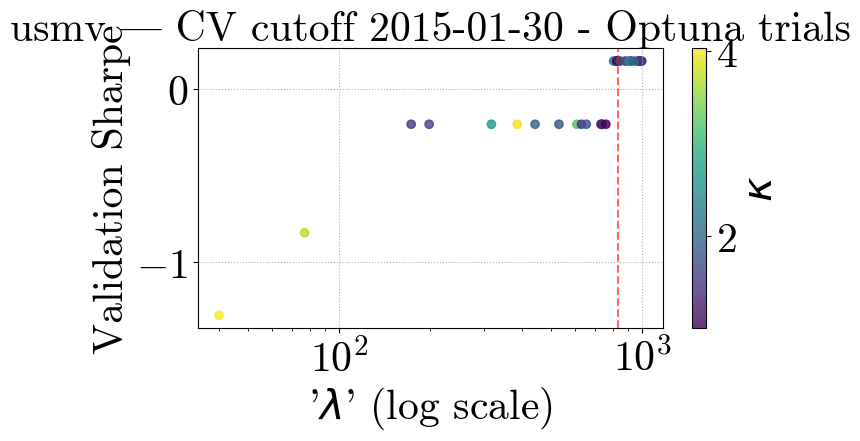

[I 2025-05-05 23:58:40,005] A new study created in memory with name: no-name-627878f3-b9e5-494d-9bf4-05d19c9ead48
[I 2025-05-05 23:58:43,239] Trial 0 finished with value: 1.0478716620585757 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0478716620585757.
[I 2025-05-05 23:58:46,345] Trial 1 finished with value: 1.25430267404545 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.25430267404545.
[I 2025-05-05 23:58:53,808] Trial 2 finished with value: 1.0621634582627302 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.25430267404545.
[I 2025-05-05 23:58:59,338] Trial 3 finished with value: 0.047461187967787026 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.25430267404545.
[I 2025-05-05 23:59:03,158] Trial 4 finished with value: 1.25430267404545 and parameters: {'la

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.2543


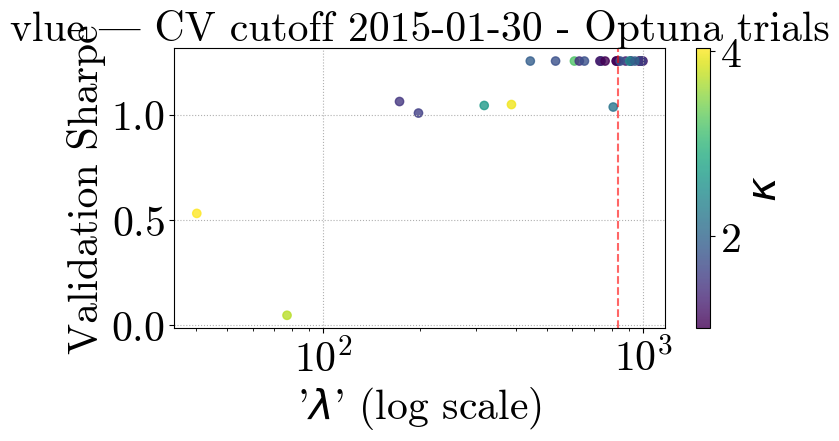

[I 2025-05-06 00:00:06,088] A new study created in memory with name: no-name-065645ef-1bc8-4575-8a98-6765a8ee7c24
[I 2025-05-06 00:00:10,503] Trial 0 finished with value: 0.2435755245923342 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2435755245923342.
[I 2025-05-06 00:00:11,302] Trial 1 finished with value: 0.24357552459233414 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2435755245923342.
[I 2025-05-06 00:00:28,536] Trial 2 finished with value: 0.243575524592334 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2435755245923342.
[I 2025-05-06 00:00:37,055] Trial 3 finished with value: -1.2785823859035799 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.2435755245923342.
[I 2025-05-06 00:00:40,757] Trial 4 finished with value: 0.2435755245923342 and paramet

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.2436


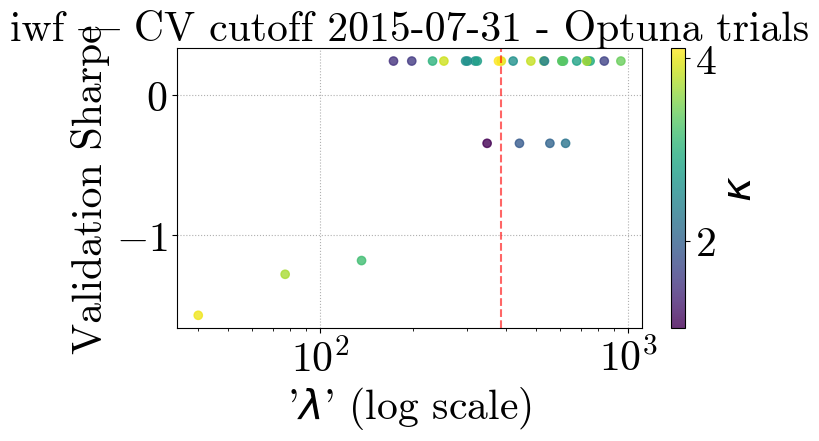

[I 2025-05-06 00:02:41,570] A new study created in memory with name: no-name-c74fe0b1-9556-4176-979b-c15dbe70d9ca
[I 2025-05-06 00:02:45,056] Trial 0 finished with value: 0.9839094963391288 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.9839094963391288.
[I 2025-05-06 00:02:49,052] Trial 1 finished with value: 0.9839094963391288 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.9839094963391288.
[I 2025-05-06 00:02:54,535] Trial 2 finished with value: 0.9839094963391292 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.9839094963391292.
[I 2025-05-06 00:03:04,638] Trial 3 finished with value: 0.6533585956016538 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.9839094963391292.
[I 2025-05-06 00:03:08,540] Trial 4 finished with value: 0.9839094963391288 and paramete

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.9839


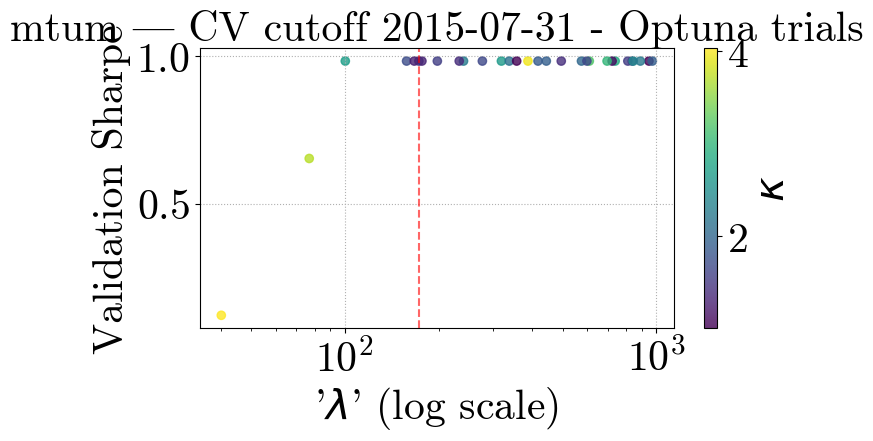

[I 2025-05-06 00:04:48,238] A new study created in memory with name: no-name-ca41cf68-c3e0-4b9a-908c-4885c6dc5c3b
[I 2025-05-06 00:04:53,153] Trial 0 finished with value: -0.5112711984955962 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5112711984955962.
[I 2025-05-06 00:04:56,736] Trial 1 finished with value: -0.5112711984955962 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5112711984955962.
[I 2025-05-06 00:05:05,719] Trial 2 finished with value: -0.511271198495596 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.511271198495596.
[I 2025-05-06 00:05:13,601] Trial 3 finished with value: -1.3929107879259053 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.511271198495596.
[I 2025-05-06 00:05:17,737] Trial 4 finished with value: -0.5112711984955962 and pa

Optuna best λ=557.1924, κ=1.0277778676386582, Sharpe=0.4232


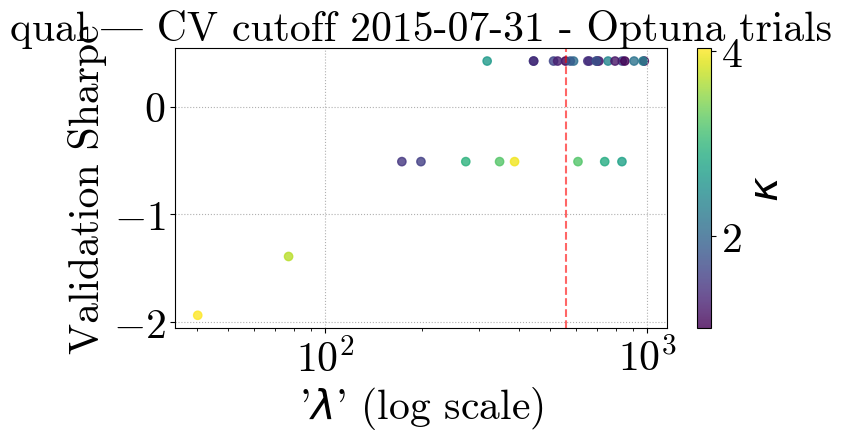

[I 2025-05-06 00:07:30,970] A new study created in memory with name: no-name-11253db5-04a9-490e-a4de-0804a7110754
[I 2025-05-06 00:07:35,785] Trial 0 finished with value: -0.4820967983795439 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4820967983795439.
[I 2025-05-06 00:07:38,866] Trial 1 finished with value: -0.4276388625853269 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4276388625853269.
[I 2025-05-06 00:07:43,301] Trial 2 finished with value: -0.3487480802402632 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.3487480802402632.
[I 2025-05-06 00:07:49,433] Trial 3 finished with value: -0.05727177690670611 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.05727177690670611.
[I 2025-05-06 00:07:52,466] Trial 4 finished with value: -0.5953661970549275 a

Optuna best λ=34.2366, κ=3.5723657905253328, Sharpe=0.2359


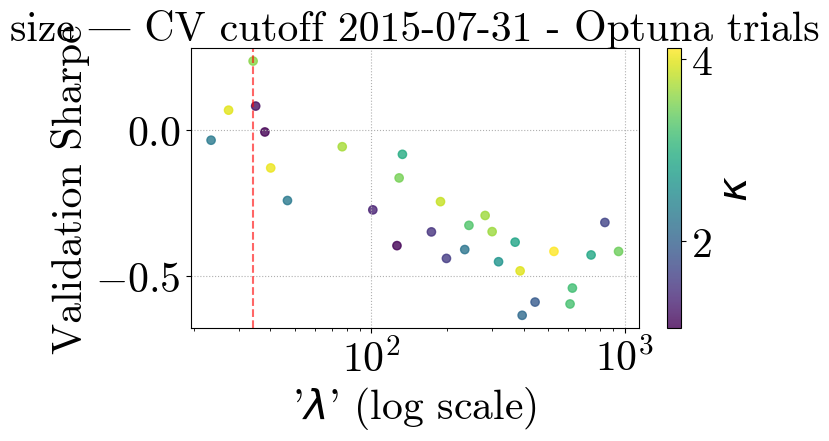

[I 2025-05-06 00:10:15,832] A new study created in memory with name: no-name-493a0611-9e1e-4a78-b064-6b0c2c4f1555
[I 2025-05-06 00:10:20,849] Trial 0 finished with value: 0.17161219905882844 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.17161219905882844.
[I 2025-05-06 00:10:24,934] Trial 1 finished with value: -0.7598006743298761 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.17161219905882844.
[I 2025-05-06 00:10:30,114] Trial 2 finished with value: -0.21577556756599808 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.17161219905882844.
[I 2025-05-06 00:10:39,765] Trial 3 finished with value: -0.2510480451724522 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.17161219905882844.
[I 2025-05-06 00:10:43,051] Trial 4 finished with value: 0.17161219905882838 an

Optuna best λ=625.8773, κ=2.2256718351156524, Sharpe=0.1716


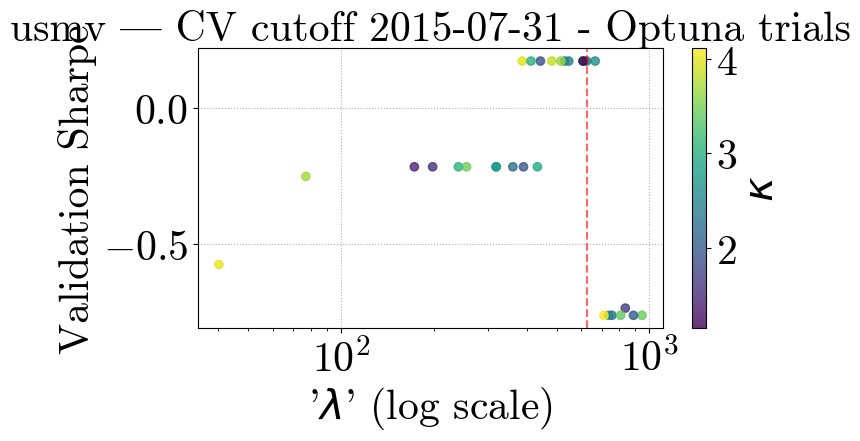

[I 2025-05-06 00:12:37,377] A new study created in memory with name: no-name-e128a891-1a75-4082-8678-b8a15f2c3150
[I 2025-05-06 00:12:41,084] Trial 0 finished with value: 1.4198208222168514 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.4198208222168514.
[I 2025-05-06 00:12:43,962] Trial 1 finished with value: 1.4198208222168511 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.4198208222168514.
[I 2025-05-06 00:12:50,947] Trial 2 finished with value: 1.2674936523350742 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.4198208222168514.
[I 2025-05-06 00:12:57,096] Trial 3 finished with value: 0.6229417972031454 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 1.4198208222168514.
[I 2025-05-06 00:13:00,078] Trial 4 finished with value: 1.4198208222168511 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=1.4198


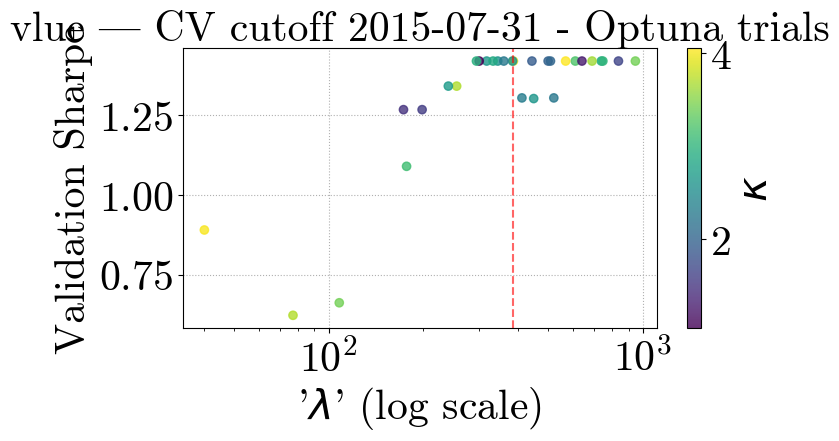

[I 2025-05-06 00:14:42,631] A new study created in memory with name: no-name-8b12b487-82d6-4dea-aadf-da3305759c6c
[I 2025-05-06 00:14:47,233] Trial 0 finished with value: -0.9154556141029656 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.9154556141029656.
[I 2025-05-06 00:14:51,283] Trial 1 finished with value: -0.9154556141029656 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.9154556141029656.
[I 2025-05-06 00:15:07,427] Trial 2 finished with value: -0.9154556141029656 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.9154556141029656.
[I 2025-05-06 00:15:15,843] Trial 3 finished with value: -1.1813398496677219 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.9154556141029656.
[I 2025-05-06 00:15:20,814] Trial 4 finished with value: -0.9154556141029656 and

Optuna best λ=273.9095, κ=2.2894180870739205, Sharpe=-0.9155


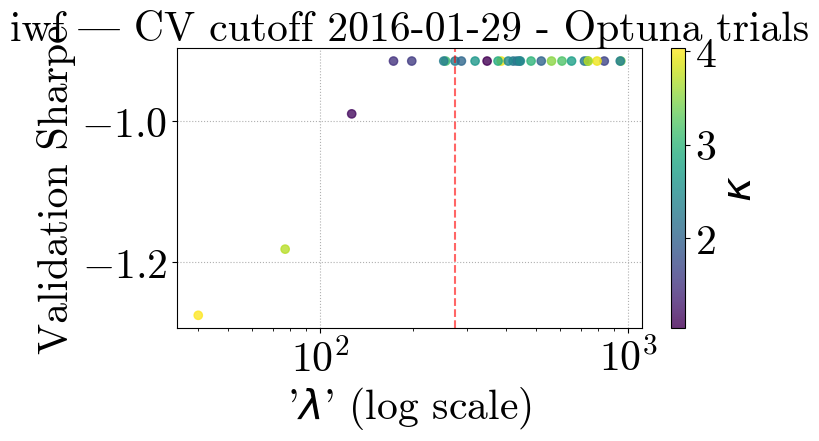

[I 2025-05-06 00:17:41,777] A new study created in memory with name: no-name-3ed8e3d5-b1a1-4116-9ff2-6f2314907aa6
[I 2025-05-06 00:17:46,928] Trial 0 finished with value: 1.5076182882232665 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.5076182882232665.
[I 2025-05-06 00:17:50,379] Trial 1 finished with value: 1.5076182882232665 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.5076182882232665.
[I 2025-05-06 00:17:56,598] Trial 2 finished with value: 1.507618288223267 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.507618288223267.
[I 2025-05-06 00:18:06,428] Trial 3 finished with value: 0.7547276357933986 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.507618288223267.
[I 2025-05-06 00:18:10,794] Trial 4 finished with value: 1.5076182882232665 and parameters:

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=1.5076


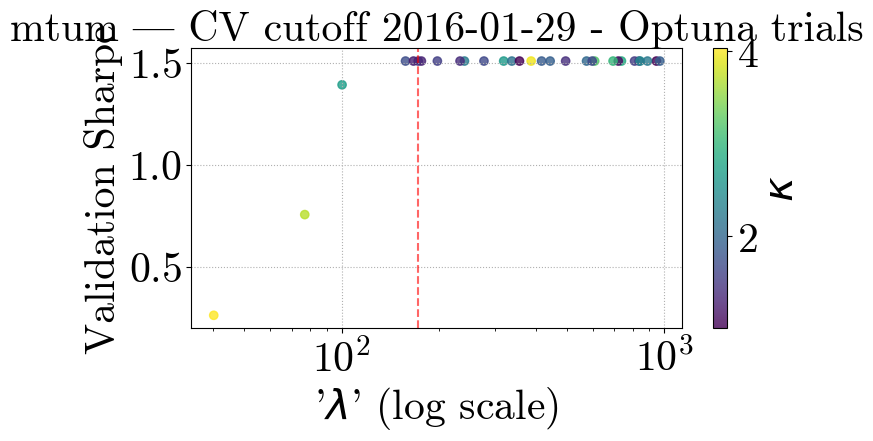

[I 2025-05-06 00:20:03,093] A new study created in memory with name: no-name-2190b427-8daa-45e4-b0ca-39bb231cc338
[I 2025-05-06 00:20:06,778] Trial 0 finished with value: -1.3311901649632858 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3311901649632858.
[I 2025-05-06 00:20:09,578] Trial 1 finished with value: -1.3311901649632858 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.3311901649632858.
[I 2025-05-06 00:20:17,246] Trial 2 finished with value: -0.7230817697691337 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.7230817697691337.
[I 2025-05-06 00:20:32,196] Trial 3 finished with value: -0.5971945872179002 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.5971945872179002.
[I 2025-05-06 00:20:35,346] Trial 4 finished with value: -1.3311901649632858 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.2500


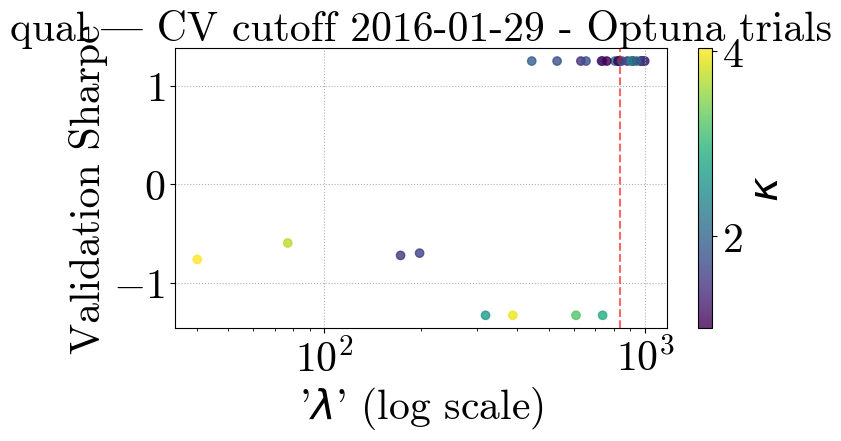

[I 2025-05-06 00:22:39,010] A new study created in memory with name: no-name-f4b0a4a6-9a7f-45eb-bed9-106c916dba34
[I 2025-05-06 00:22:43,527] Trial 0 finished with value: -0.5194591202701195 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5194591202701195.
[I 2025-05-06 00:22:48,427] Trial 1 finished with value: -0.5288095409582194 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5194591202701195.
[I 2025-05-06 00:22:58,827] Trial 2 finished with value: -0.31303527417725396 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.31303527417725396.
[I 2025-05-06 00:23:04,242] Trial 3 finished with value: -0.18173484559811534 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.18173484559811534.
[I 2025-05-06 00:23:09,358] Trial 4 finished with value: -0.5288095409582194

Optuna best λ=23.3699, κ=1.9321629133842002, Sharpe=-0.0520


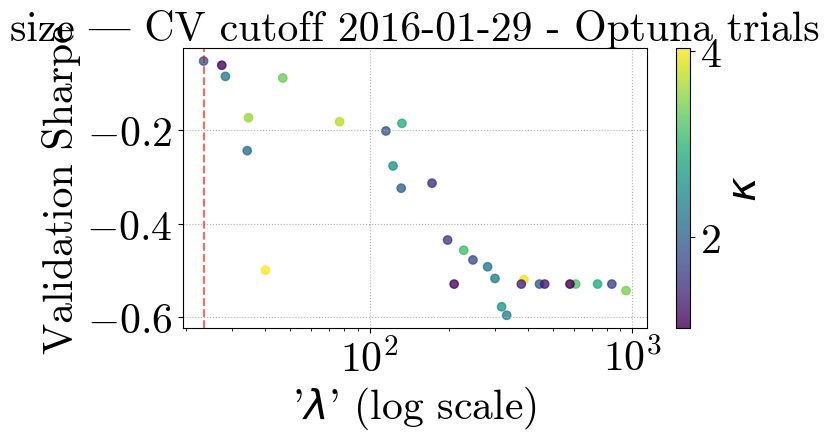

[I 2025-05-06 00:25:28,341] A new study created in memory with name: no-name-74fd4f30-12d8-463b-8625-b2501e6d4d7a
[I 2025-05-06 00:25:31,944] Trial 0 finished with value: -0.6133231785026266 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6133231785026266.
[I 2025-05-06 00:25:35,960] Trial 1 finished with value: -0.7884579887079837 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6133231785026266.
[I 2025-05-06 00:25:43,242] Trial 2 finished with value: -0.771648526162884 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.6133231785026266.
[I 2025-05-06 00:25:53,247] Trial 3 finished with value: 0.12031609321128893 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.12031609321128893.
[I 2025-05-06 00:25:57,137] Trial 4 finished with value: -0.6133231785026269 and 

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.1203


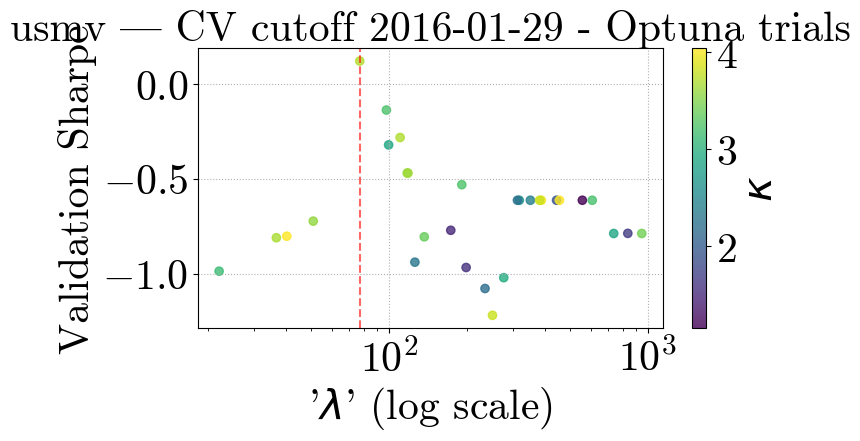

[I 2025-05-06 00:29:07,521] A new study created in memory with name: no-name-bfdc55cf-47ae-43a7-aa53-a9e1bfa9adb4
[I 2025-05-06 00:29:13,240] Trial 0 finished with value: 1.0166666688088002 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0166666688088002.
[I 2025-05-06 00:29:16,592] Trial 1 finished with value: 0.24488636067658232 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0166666688088002.
[I 2025-05-06 00:29:26,806] Trial 2 finished with value: 1.1546816873722108 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.1546816873722108.
[I 2025-05-06 00:29:32,037] Trial 3 finished with value: 0.8440345702112727 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.1546816873722108.
[I 2025-05-06 00:29:35,425] Trial 4 finished with value: 0.5692806472259944 and paramet

Optuna best λ=240.1798, κ=3.7629494035516347, Sharpe=1.2469


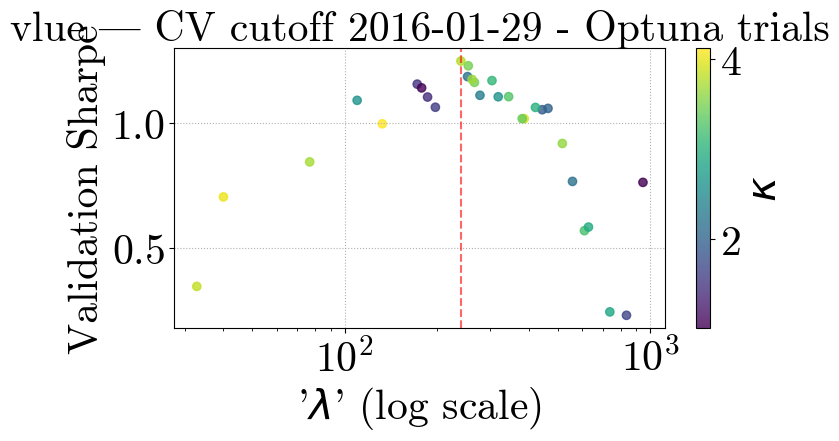

[I 2025-05-06 00:31:52,704] A new study created in memory with name: no-name-aa2496f7-6c63-4395-ba0d-911bbe635f56
[I 2025-05-06 00:32:00,320] Trial 0 finished with value: -0.7609031244499252 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7609031244499252.
[I 2025-05-06 00:32:04,074] Trial 1 finished with value: -0.7609031244499254 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7609031244499252.
[I 2025-05-06 00:32:22,105] Trial 2 finished with value: -0.7609031244499252 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.7609031244499252.
[I 2025-05-06 00:32:31,003] Trial 3 finished with value: -1.2783090698550363 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.7609031244499252.
[I 2025-05-06 00:32:38,369] Trial 4 finished with value: -0.7609031244499252 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=-0.7609


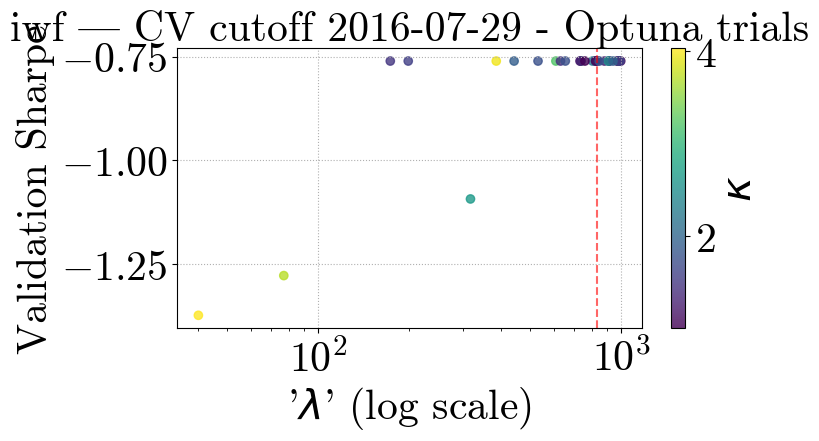

[I 2025-05-06 00:33:59,219] A new study created in memory with name: no-name-7362f20a-e308-4f77-80ed-1adb6028870e
[I 2025-05-06 00:34:05,205] Trial 0 finished with value: 1.161792377900417 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.161792377900417.
[I 2025-05-06 00:34:09,673] Trial 1 finished with value: 1.161792377900417 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.161792377900417.
[I 2025-05-06 00:34:15,455] Trial 2 finished with value: 1.1620685983565433 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.1620685983565433.
[I 2025-05-06 00:34:26,772] Trial 3 finished with value: 0.7086148350894835 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.1620685983565433.
[I 2025-05-06 00:34:31,323] Trial 4 finished with value: 1.161792377900417 and parameters: {

Optuna best λ=112.1492, κ=1.501841895750529, Sharpe=1.5523


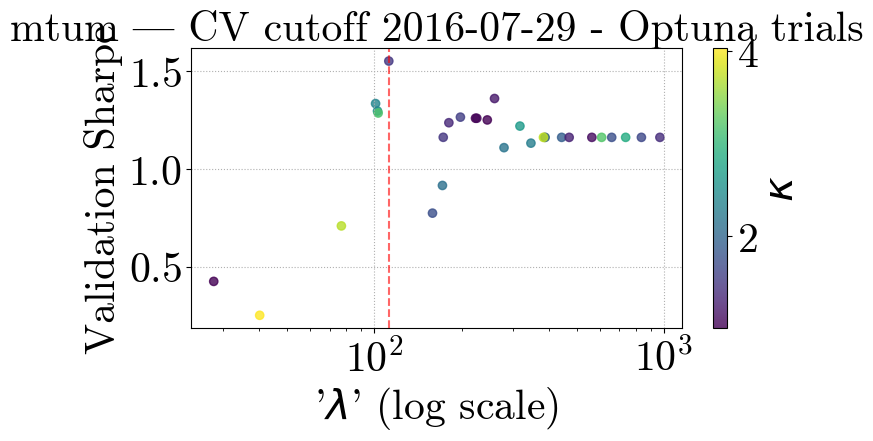

[I 2025-05-06 00:36:35,080] A new study created in memory with name: no-name-64fa8c70-e722-4f6b-ab01-13f0a09bc838
[I 2025-05-06 00:36:39,053] Trial 0 finished with value: -1.0305905084320017 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.0305905084320017.
[I 2025-05-06 00:36:42,217] Trial 1 finished with value: -1.0305905084320017 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -1.0305905084320017.
[I 2025-05-06 00:36:51,933] Trial 2 finished with value: -0.17126007040690674 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.17126007040690674.
[I 2025-05-06 00:37:03,419] Trial 3 finished with value: -0.6057322053752467 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.17126007040690674.
[I 2025-05-06 00:37:06,818] Trial 4 finished with value: -1.0305905084320017 

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.9539


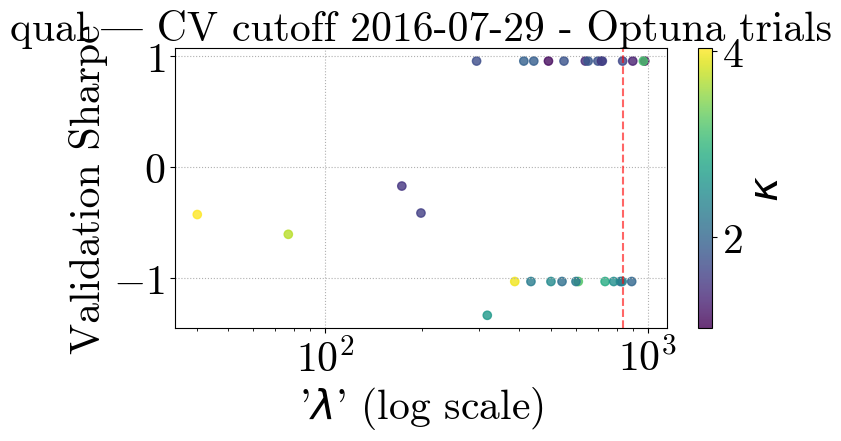

[I 2025-05-06 00:40:06,300] A new study created in memory with name: no-name-f84e203d-ef7b-4c21-ac87-795898b0c73f
[I 2025-05-06 00:40:11,265] Trial 0 finished with value: -0.27900877012017417 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.27900877012017417.
[I 2025-05-06 00:40:17,685] Trial 1 finished with value: -0.4599343551926128 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.27900877012017417.
[I 2025-05-06 00:40:27,148] Trial 2 finished with value: -0.2279819869258826 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.2279819869258826.
[I 2025-05-06 00:40:36,800] Trial 3 finished with value: -0.0038454821868344454 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.0038454821868344454.
[I 2025-05-06 00:40:42,199] Trial 4 finished with value: -0.45993435519

Optuna best λ=151.7421, κ=3.3518251112732322, Sharpe=0.0379


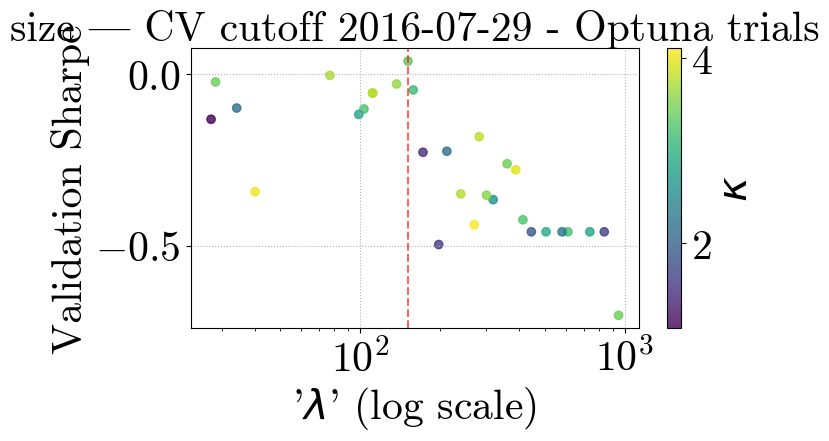

[I 2025-05-06 00:43:41,202] A new study created in memory with name: no-name-8be688c6-51af-4029-95e8-b074b7525515
[I 2025-05-06 00:43:45,813] Trial 0 finished with value: -0.6534664713847467 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6534664713847467.
[I 2025-05-06 00:43:50,751] Trial 1 finished with value: -0.2859593482123698 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.2859593482123698.
[I 2025-05-06 00:43:55,899] Trial 2 finished with value: -0.6866898469997386 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.2859593482123698.
[I 2025-05-06 00:44:07,213] Trial 3 finished with value: 0.27146878916088385 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.27146878916088385.
[I 2025-05-06 00:44:10,280] Trial 4 finished with value: -0.6534664713847468 and

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.2715


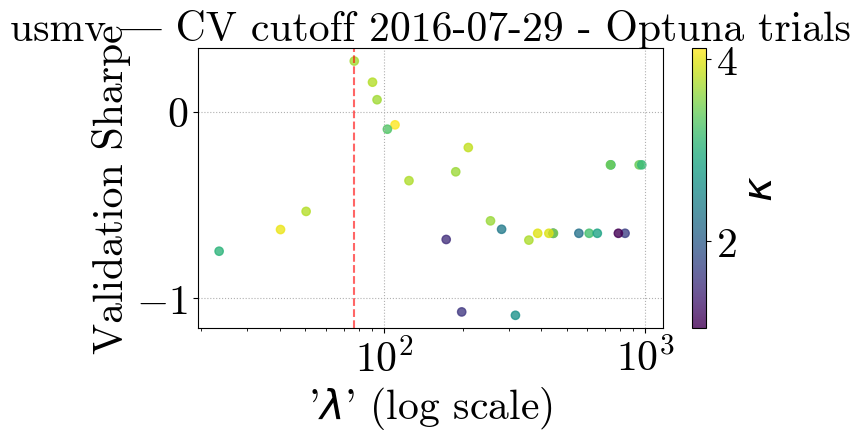

[I 2025-05-06 00:47:10,914] A new study created in memory with name: no-name-5a54ba86-863b-4afe-893f-02b533645606
[I 2025-05-06 00:47:17,013] Trial 0 finished with value: 0.12127857679768607 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.12127857679768607.
[I 2025-05-06 00:47:22,916] Trial 1 finished with value: -0.049260025630732486 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.12127857679768607.
[I 2025-05-06 00:47:29,946] Trial 2 finished with value: 0.12463083062804495 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.12463083062804495.
[I 2025-05-06 00:47:36,682] Trial 3 finished with value: -0.34598345689542304 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.12463083062804495.
[I 2025-05-06 00:47:43,245] Trial 4 finished with value: -0.09001638068326086

Optuna best λ=385.2302, κ=2.1213623158525854, Sharpe=0.5239


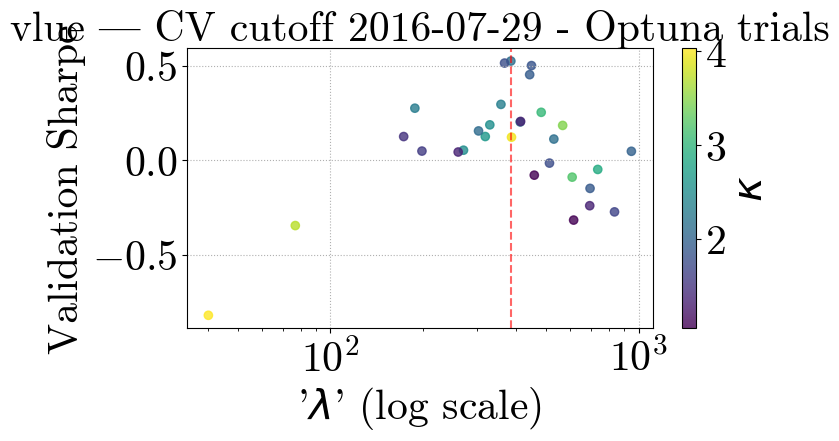

[I 2025-05-06 00:50:04,965] A new study created in memory with name: no-name-2ee22f8e-cbc7-4a68-9ac1-12ddeb64972d
[I 2025-05-06 00:50:13,952] Trial 0 finished with value: -0.19853675294516818 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.19853675294516818.
[I 2025-05-06 00:50:19,875] Trial 1 finished with value: -0.19853675294516818 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.19853675294516818.
[I 2025-05-06 00:50:29,695] Trial 2 finished with value: -0.6556951294365259 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.19853675294516818.
[I 2025-05-06 00:50:39,146] Trial 3 finished with value: -1.4838015949828591 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.19853675294516818.
[I 2025-05-06 00:50:45,011] Trial 4 finished with value: -0.19853675294516

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=-0.1985


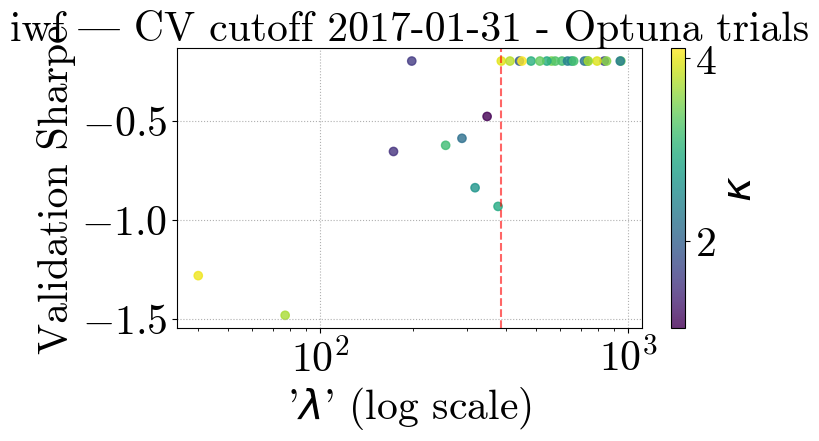

[I 2025-05-06 00:53:21,329] A new study created in memory with name: no-name-335d380c-e925-4c32-aece-6952cd8b51b7
[I 2025-05-06 00:53:26,792] Trial 0 finished with value: 0.7151186686439069 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7151186686439069.
[I 2025-05-06 00:53:31,365] Trial 1 finished with value: 0.7151186686439069 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.7151186686439069.
[I 2025-05-06 00:53:36,666] Trial 2 finished with value: 0.7444563480136428 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7444563480136428.
[I 2025-05-06 00:53:46,027] Trial 3 finished with value: 0.6287406175110727 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.7444563480136428.
[I 2025-05-06 00:53:51,064] Trial 4 finished with value: 0.7151186686439069 and paramete

Optuna best λ=104.6458, κ=3.681208076742638, Sharpe=1.1050


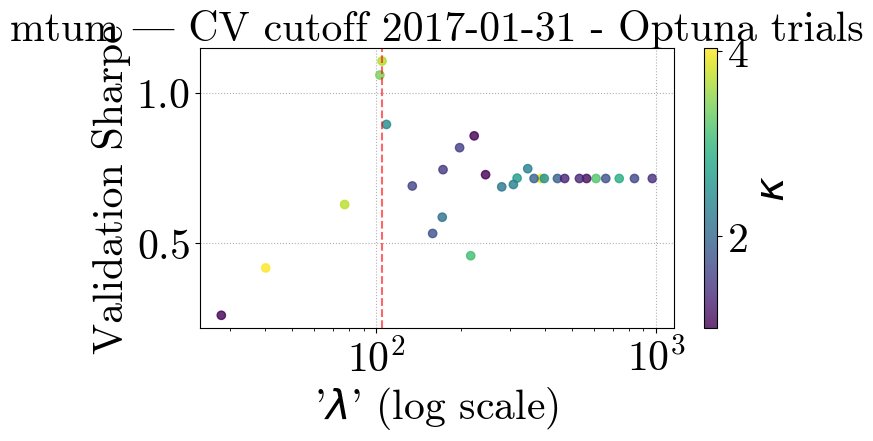

[I 2025-05-06 00:56:25,040] A new study created in memory with name: no-name-d2fb4ce7-9ec8-4c30-8ba0-d5950f4e1d7c
[I 2025-05-06 00:56:29,794] Trial 0 finished with value: -0.6822006156002339 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6822006156002339.
[I 2025-05-06 00:56:33,712] Trial 1 finished with value: -0.6822006156002339 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.6822006156002339.
[I 2025-05-06 00:56:39,720] Trial 2 finished with value: 0.20666872183446058 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.20666872183446058.
[I 2025-05-06 00:56:48,826] Trial 3 finished with value: -0.5239698551669175 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.20666872183446058.
[I 2025-05-06 00:56:53,394] Trial 4 finished with value: -0.6822006156002339 and

Optuna best λ=736.2931, κ=1.3359849390607732, Sharpe=0.6084


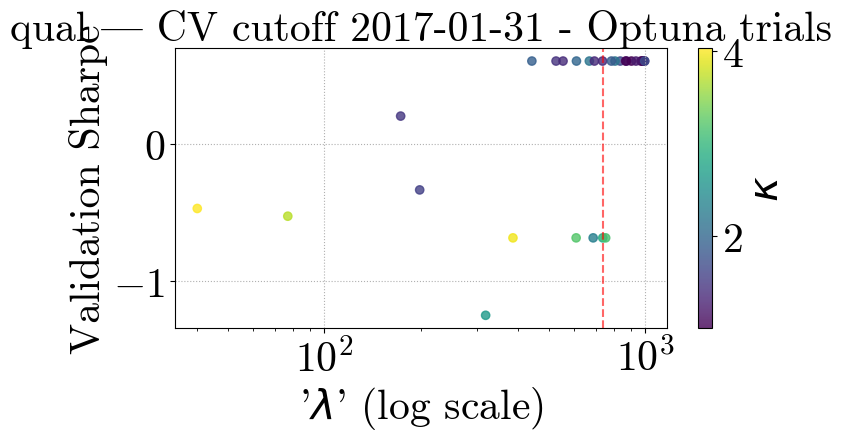

[I 2025-05-06 00:59:08,974] A new study created in memory with name: no-name-cf720bfa-13d7-431c-ab57-b3a548335988
[I 2025-05-06 00:59:14,356] Trial 0 finished with value: -0.32529133909987995 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.32529133909987995.
[I 2025-05-06 00:59:21,456] Trial 1 finished with value: -0.5002014218221834 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.32529133909987995.
[I 2025-05-06 00:59:29,641] Trial 2 finished with value: -0.17899633314796282 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.17899633314796282.
[I 2025-05-06 00:59:38,427] Trial 3 finished with value: -0.005154136010312338 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.005154136010312338.
[I 2025-05-06 00:59:45,360] Trial 4 finished with value: -0.50020142182

Optuna best λ=38.1030, κ=1.0411523272835175, Sharpe=0.3084


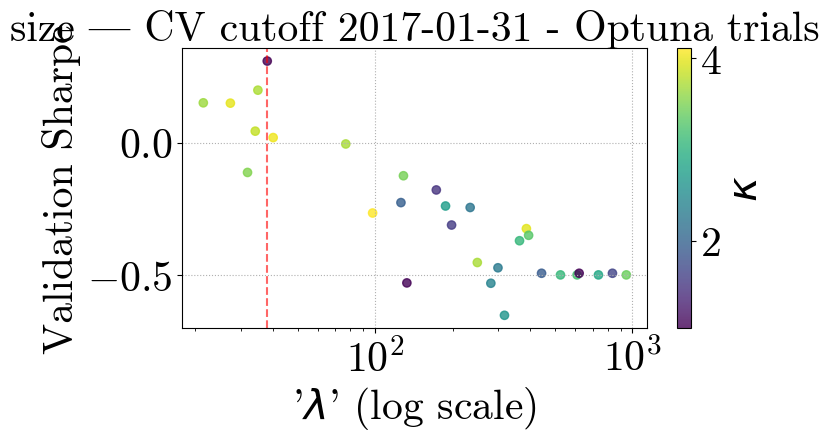

[I 2025-05-06 01:02:51,525] A new study created in memory with name: no-name-b57241e6-ee71-432c-bb57-2ed52659c19d
[I 2025-05-06 01:02:56,273] Trial 0 finished with value: -1.2175341050549078 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.2175341050549078.
[I 2025-05-06 01:03:03,771] Trial 1 finished with value: -0.24938935558304962 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.24938935558304962.
[I 2025-05-06 01:03:09,323] Trial 2 finished with value: -1.1537365090413567 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.24938935558304962.
[I 2025-05-06 01:03:21,339] Trial 3 finished with value: -0.36744784229717925 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.24938935558304962.
[I 2025-05-06 01:03:24,608] Trial 4 finished with value: -0.610481804579093

Optuna best λ=787.9570, κ=1.0411523272835175, Sharpe=0.0175


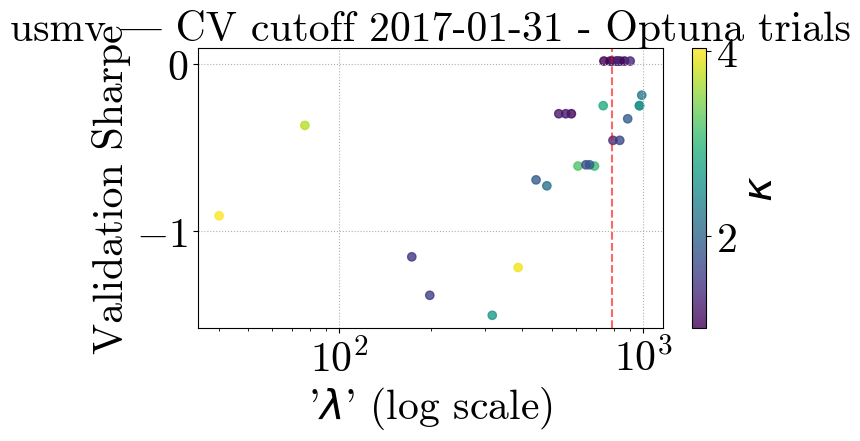

[I 2025-05-06 01:05:05,288] A new study created in memory with name: no-name-5e24d76f-d809-462d-bfbe-7164409716de
[I 2025-05-06 01:05:12,491] Trial 0 finished with value: 0.6446979225063298 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6446979225063298.
[I 2025-05-06 01:05:17,190] Trial 1 finished with value: 0.12990424297355893 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6446979225063298.
[I 2025-05-06 01:05:24,769] Trial 2 finished with value: 0.6108658506118272 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6446979225063298.
[I 2025-05-06 01:05:30,787] Trial 3 finished with value: 0.2349839942275711 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6446979225063298.
[I 2025-05-06 01:05:36,153] Trial 4 finished with value: 0.7354531755849425 and paramet

Optuna best λ=375.7770, κ=4.1131647857769, Sharpe=0.8445


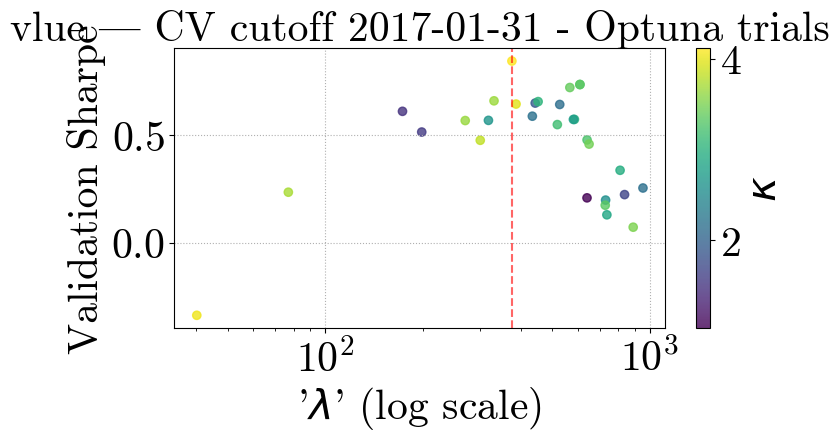

[I 2025-05-06 01:07:55,168] A new study created in memory with name: no-name-fb3427d7-c095-4cc0-bbbd-5a74f494272e
[I 2025-05-06 01:08:05,123] Trial 0 finished with value: -1.2035551140181193 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.2035551140181193.
[I 2025-05-06 01:08:12,673] Trial 1 finished with value: -0.6628720652496607 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.6628720652496607.
[I 2025-05-06 01:08:20,122] Trial 2 finished with value: -0.7597826436819721 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.6628720652496607.
[I 2025-05-06 01:08:29,810] Trial 3 finished with value: -1.8456535445276285 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.6628720652496607.
[I 2025-05-06 01:08:37,424] Trial 4 finished with value: -0.6628720652496607 and

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=-0.6629


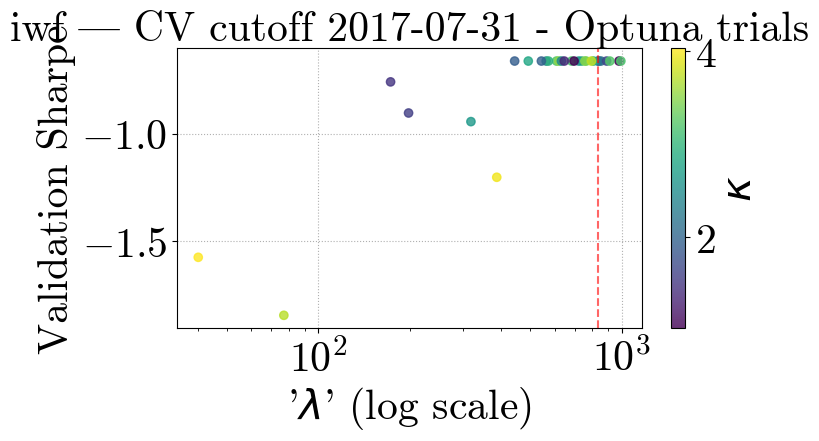

[I 2025-05-06 01:10:59,453] A new study created in memory with name: no-name-744081e0-e139-4adb-836f-f11b337a2956
[I 2025-05-06 01:11:04,470] Trial 0 finished with value: 1.2100877781468948 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.2100877781468948.
[I 2025-05-06 01:11:08,338] Trial 1 finished with value: 1.2100877781468948 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.2100877781468948.
[I 2025-05-06 01:11:15,586] Trial 2 finished with value: 1.199412520635549 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 1.2100877781468948.
[I 2025-05-06 01:11:29,121] Trial 3 finished with value: 1.6160746611334136 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.6160746611334136.
[I 2025-05-06 01:11:33,601] Trial 4 finished with value: 1.2100877781468948 and parameter

Optuna best λ=78.1920, κ=1.9476948493779247, Sharpe=1.6354


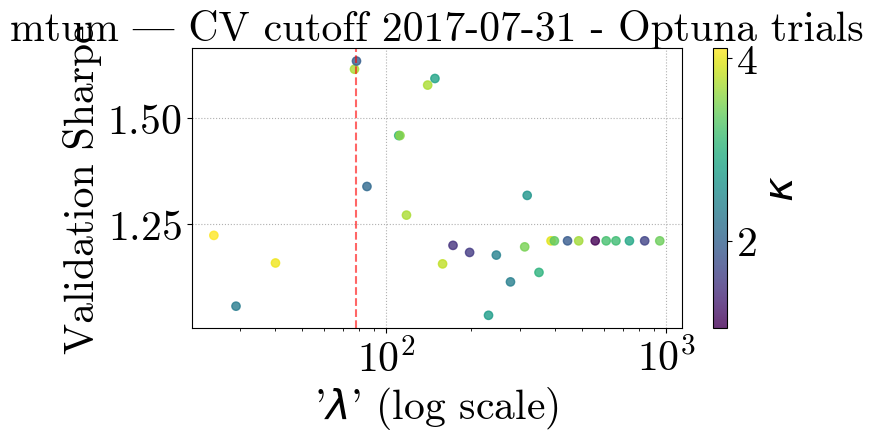

[I 2025-05-06 01:15:11,550] A new study created in memory with name: no-name-7fb11749-29d7-45e1-9bbf-864031728fea
[I 2025-05-06 01:15:17,565] Trial 0 finished with value: -0.7643985769120791 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7643985769120791.
[I 2025-05-06 01:15:22,652] Trial 1 finished with value: -0.7643985769120791 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7643985769120791.
[I 2025-05-06 01:15:29,669] Trial 2 finished with value: 0.3523458474597932 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.3523458474597932.
[I 2025-05-06 01:15:39,399] Trial 3 finished with value: -0.48300450581638593 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.3523458474597932.
[I 2025-05-06 01:15:44,202] Trial 4 finished with value: -0.7643985769120791 and p

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.6915


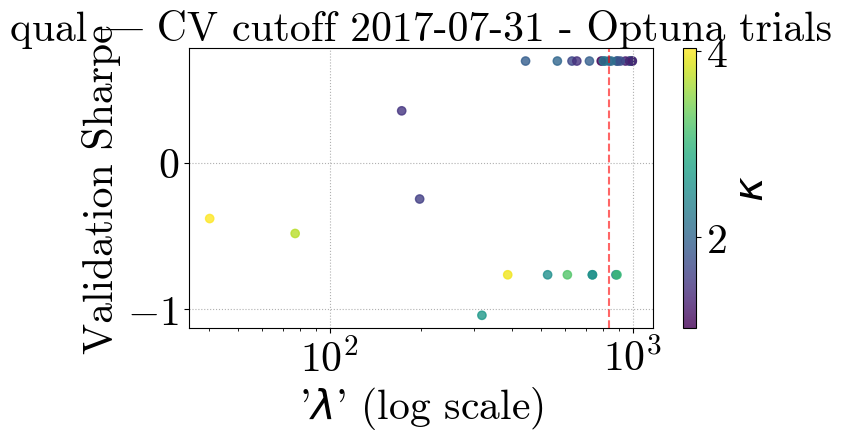

[I 2025-05-06 01:18:22,513] A new study created in memory with name: no-name-c2d9c4c4-f2c3-45ff-b682-9e2e56d62cb1
[I 2025-05-06 01:18:29,647] Trial 0 finished with value: 0.2769182279965631 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2769182279965631.
[I 2025-05-06 01:18:34,783] Trial 1 finished with value: -0.31627473189328115 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2769182279965631.
[I 2025-05-06 01:18:43,631] Trial 2 finished with value: 0.23893115591852176 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.2769182279965631.
[I 2025-05-06 01:18:54,400] Trial 3 finished with value: 0.4820675265266306 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.4820675265266306.
[I 2025-05-06 01:18:59,931] Trial 4 finished with value: -0.31627473189328115 and par

Optuna best λ=28.2918, κ=3.7164421443642444, Sharpe=0.5348


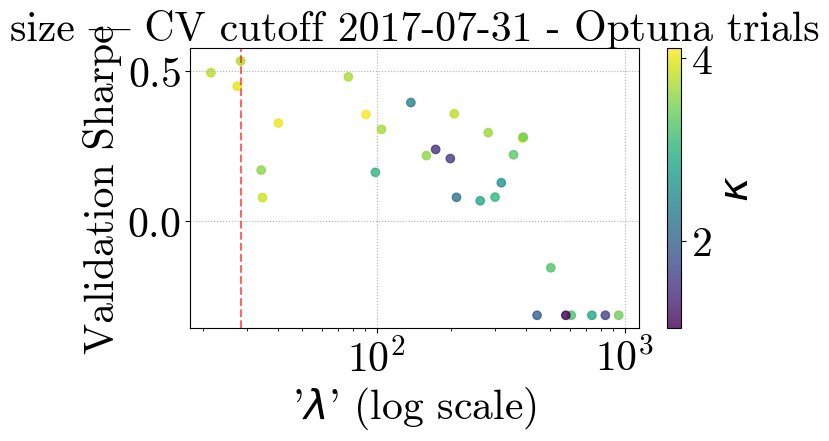

[I 2025-05-06 01:22:22,413] A new study created in memory with name: no-name-36bc7197-b38a-4bba-b9bb-122f7d3ed34d
[I 2025-05-06 01:22:25,948] Trial 0 finished with value: -1.156771159302962 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.156771159302962.
[I 2025-05-06 01:22:32,098] Trial 1 finished with value: 1.0780607136174432 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0780607136174432.
[I 2025-05-06 01:22:40,396] Trial 2 finished with value: -1.2542879923163022 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0780607136174432.
[I 2025-05-06 01:22:50,163] Trial 3 finished with value: -0.3013037744717255 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0780607136174432.
[I 2025-05-06 01:22:54,261] Trial 4 finished with value: -0.4282776576857449 and param

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=1.0781


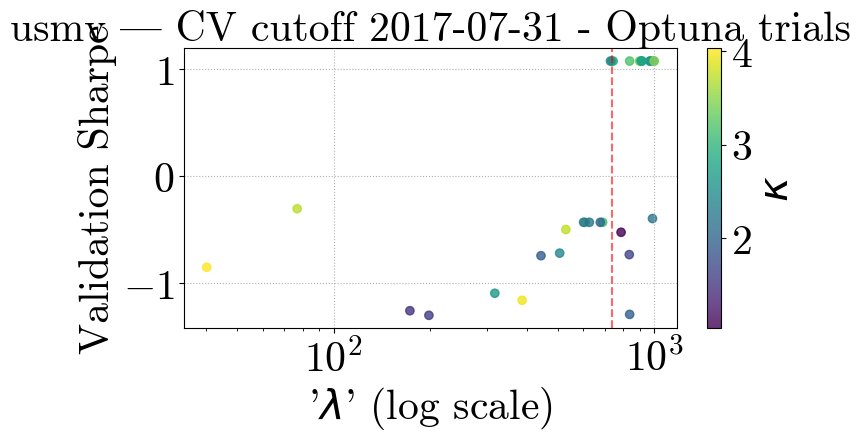

[I 2025-05-06 01:25:00,145] A new study created in memory with name: no-name-2705f46f-822d-49bb-8065-9afbe160e5bb
[I 2025-05-06 01:25:04,968] Trial 0 finished with value: 0.21876857131521918 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.21876857131521918.
[I 2025-05-06 01:25:09,471] Trial 1 finished with value: -0.30364699584584826 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.21876857131521918.
[I 2025-05-06 01:25:16,181] Trial 2 finished with value: 0.05260408830814514 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.21876857131521918.
[I 2025-05-06 01:25:22,443] Trial 3 finished with value: -0.2875000702379184 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.21876857131521918.
[I 2025-05-06 01:25:26,181] Trial 4 finished with value: 0.03699294926454945 an

Optuna best λ=377.4716, κ=3.1755354562016453, Sharpe=0.2802


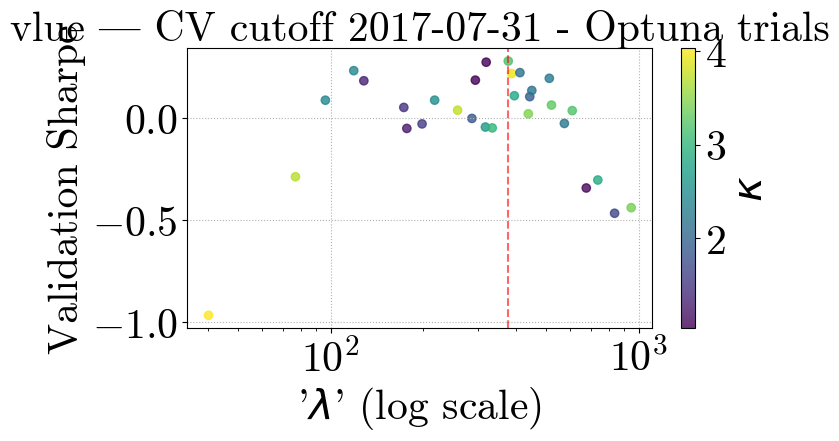

[I 2025-05-06 01:27:47,412] A new study created in memory with name: no-name-7637c1d3-da78-48a2-9482-c0526d4ee35a
[I 2025-05-06 01:27:53,095] Trial 0 finished with value: -0.5961767127344504 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.5961767127344504.
[I 2025-05-06 01:27:57,962] Trial 1 finished with value: -0.856522027430692 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.5961767127344504.
[I 2025-05-06 01:28:02,975] Trial 2 finished with value: -0.7273514019331165 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.5961767127344504.
[I 2025-05-06 01:28:13,258] Trial 3 finished with value: -1.9344507569953329 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.5961767127344504.
[I 2025-05-06 01:28:18,287] Trial 4 finished with value: -0.856522027430692 and p

Optuna best λ=269.8500, κ=2.4258331254949925, Sharpe=-0.1188


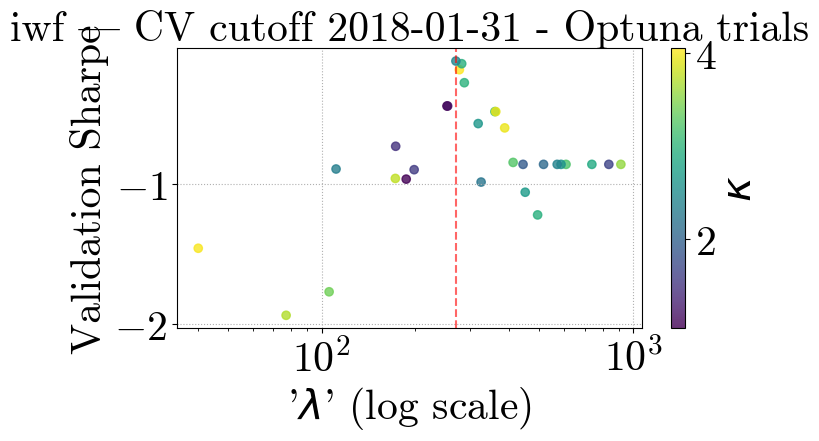

[I 2025-05-06 01:30:51,274] A new study created in memory with name: no-name-4c20a904-e570-4b35-8fb4-0aeab7cf3e22
[I 2025-05-06 01:30:56,751] Trial 0 finished with value: 1.3500064714589328 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.3500064714589328.
[I 2025-05-06 01:31:00,360] Trial 1 finished with value: 1.3500064714589328 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.3500064714589328.
[I 2025-05-06 01:31:07,828] Trial 2 finished with value: 1.3848968283151775 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.3848968283151775.
[I 2025-05-06 01:31:25,427] Trial 3 finished with value: 1.796761244628552 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.796761244628552.
[I 2025-05-06 01:31:29,191] Trial 4 finished with value: 1.3500064714589328 and parameters

Optuna best λ=93.8557, κ=3.0627018391420346, Sharpe=2.0416


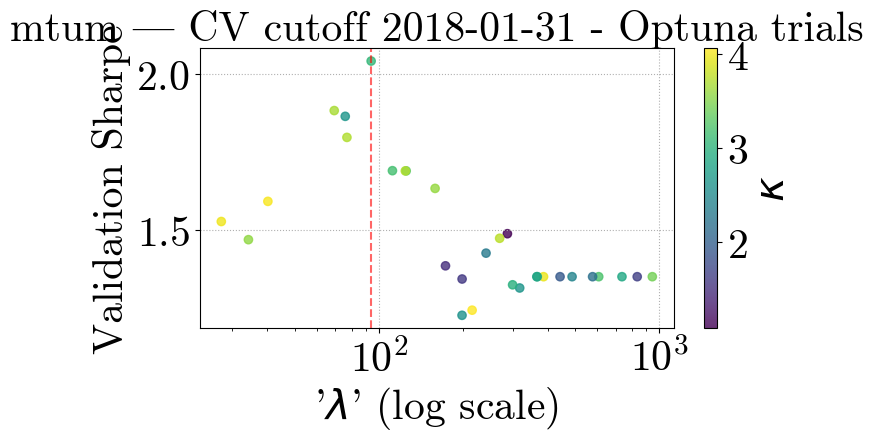

[I 2025-05-06 01:35:05,093] A new study created in memory with name: no-name-98b8659d-543a-4eb5-929e-1bafbfd2579f
[I 2025-05-06 01:35:11,523] Trial 0 finished with value: 0.6212966121213295 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6212966121213295.
[I 2025-05-06 01:35:16,105] Trial 1 finished with value: 0.6212966121213295 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6212966121213295.
[I 2025-05-06 01:35:25,040] Trial 2 finished with value: 0.26835812464593173 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6212966121213295.
[I 2025-05-06 01:35:37,292] Trial 3 finished with value: -0.2785960849452515 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6212966121213295.
[I 2025-05-06 01:35:42,422] Trial 4 finished with value: 0.6212966121213295 and parame

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.6213


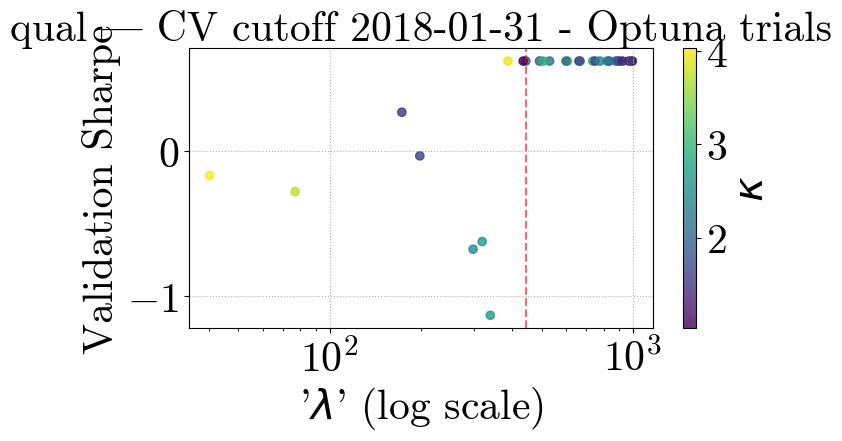

[I 2025-05-06 01:38:13,320] A new study created in memory with name: no-name-ba2e2536-4a1a-4063-929d-986feef2b698
[I 2025-05-06 01:38:17,805] Trial 0 finished with value: -0.11296290759556803 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.11296290759556803.
[I 2025-05-06 01:38:21,224] Trial 1 finished with value: -0.08769042383765721 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.08769042383765721.
[I 2025-05-06 01:38:30,605] Trial 2 finished with value: 0.0010250327481080021 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.0010250327481080021.
[I 2025-05-06 01:38:40,552] Trial 3 finished with value: 0.20501318664130816 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.20501318664130816.
[I 2025-05-06 01:38:44,154] Trial 4 finished with value: -0.112962907595

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.2050


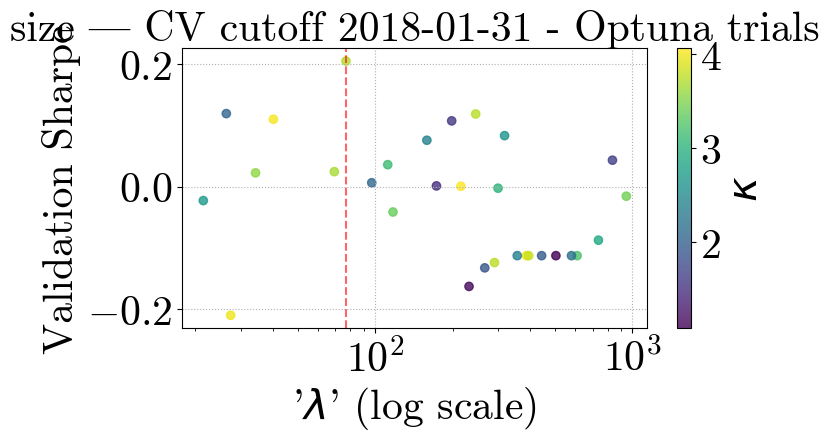

[I 2025-05-06 01:42:00,069] A new study created in memory with name: no-name-575e13c8-a67f-4ea8-a629-5c312fc44b52
[I 2025-05-06 01:42:03,921] Trial 0 finished with value: -0.7989343128251738 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7989343128251738.
[I 2025-05-06 01:42:09,339] Trial 1 finished with value: 0.06773370281114129 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.06773370281114129.
[I 2025-05-06 01:42:15,635] Trial 2 finished with value: -0.5847655006604014 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.06773370281114129.
[I 2025-05-06 01:42:29,639] Trial 3 finished with value: -0.17449296354786153 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.06773370281114129.
[I 2025-05-06 01:42:35,650] Trial 4 finished with value: 0.06773370281114129 an

Optuna best λ=787.9570, κ=2.1855441481340363, Sharpe=0.0677


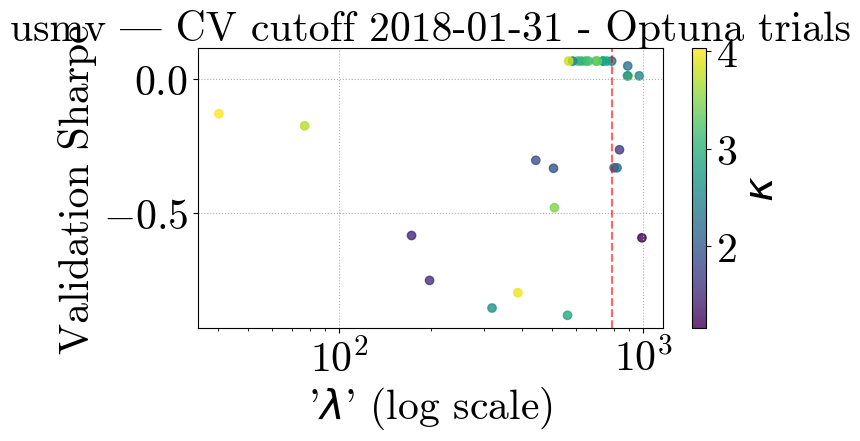

[I 2025-05-06 01:45:11,586] A new study created in memory with name: no-name-5276a0ce-f128-43ad-b267-fb484950fdea
[I 2025-05-06 01:45:17,602] Trial 0 finished with value: 0.07888144639076189 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.07888144639076189.
[I 2025-05-06 01:45:22,535] Trial 1 finished with value: 0.36173255883357125 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.36173255883357125.
[I 2025-05-06 01:45:30,070] Trial 2 finished with value: 0.5047795405625374 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5047795405625374.
[I 2025-05-06 01:45:37,131] Trial 3 finished with value: 0.07032328078029154 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5047795405625374.
[I 2025-05-06 01:45:41,484] Trial 4 finished with value: 0.3577506849736792 and par

Optuna best λ=96.8931, κ=1.008160136605864, Sharpe=0.5429


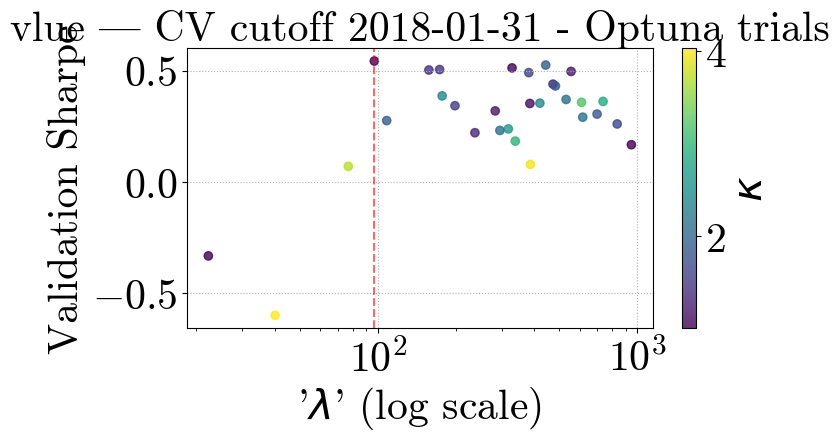

[I 2025-05-06 01:47:45,982] A new study created in memory with name: no-name-a38d0a7b-017e-4d71-b5f4-d86047c21b41
[I 2025-05-06 01:47:52,985] Trial 0 finished with value: -0.598378454366019 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.598378454366019.
[I 2025-05-06 01:47:58,198] Trial 1 finished with value: -0.598378454366019 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.598378454366019.
[I 2025-05-06 01:48:07,335] Trial 2 finished with value: 0.07100455806344036 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.07100455806344036.
[I 2025-05-06 01:48:19,450] Trial 3 finished with value: 0.5483007525300315 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5483007525300315.
[I 2025-05-06 01:48:24,485] Trial 4 finished with value: -0.598378454366019 and parame

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.5592


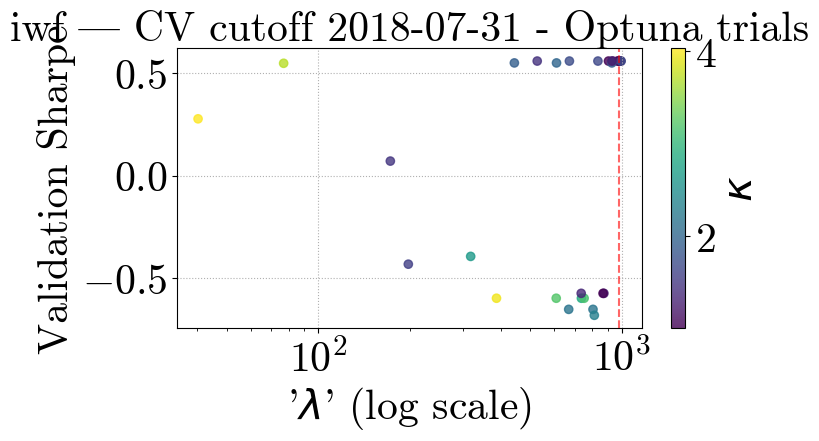

[I 2025-05-06 01:50:38,315] A new study created in memory with name: no-name-0410d338-0074-4575-b6bc-0138df400064
[I 2025-05-06 01:50:42,779] Trial 0 finished with value: 1.0180931323966187 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0180931323966187.
[I 2025-05-06 01:50:46,832] Trial 1 finished with value: 1.0180931323966187 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 1.0180931323966187.
[I 2025-05-06 01:50:55,801] Trial 2 finished with value: 1.0515639442674727 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.0515639442674727.
[I 2025-05-06 01:51:05,214] Trial 3 finished with value: 1.1944734943091517 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1944734943091517.
[I 2025-05-06 01:51:10,697] Trial 4 finished with value: 1.0180931323966187 and paramete

Optuna best λ=86.4639, κ=2.941859250399054, Sharpe=1.2300


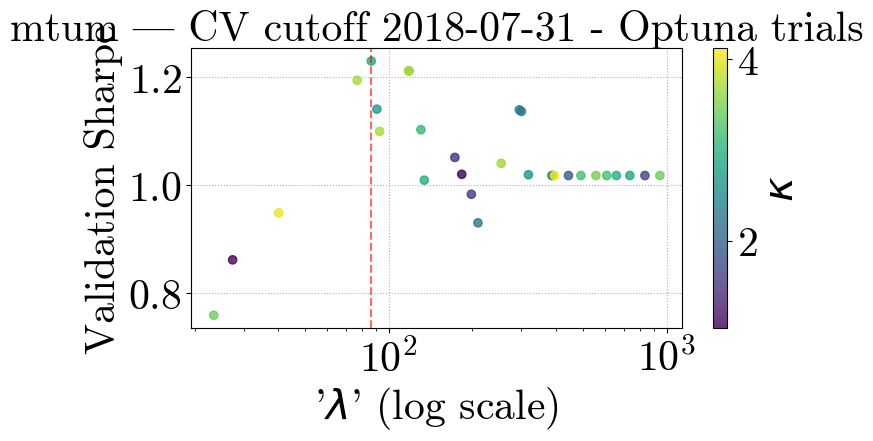

[I 2025-05-06 01:54:10,752] A new study created in memory with name: no-name-9f937ed4-47bf-49c9-af18-227cdcda338b
[I 2025-05-06 01:54:15,380] Trial 0 finished with value: 0.22976706542930175 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.22976706542930175.
[I 2025-05-06 01:54:19,345] Trial 1 finished with value: 0.22976706542930175 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.22976706542930175.
[I 2025-05-06 01:54:27,716] Trial 2 finished with value: 0.35546041892049074 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.35546041892049074.
[I 2025-05-06 01:54:41,497] Trial 3 finished with value: -0.32215901865285823 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.35546041892049074.
[I 2025-05-06 01:54:45,315] Trial 4 finished with value: 0.22976706542930175 an

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.7254


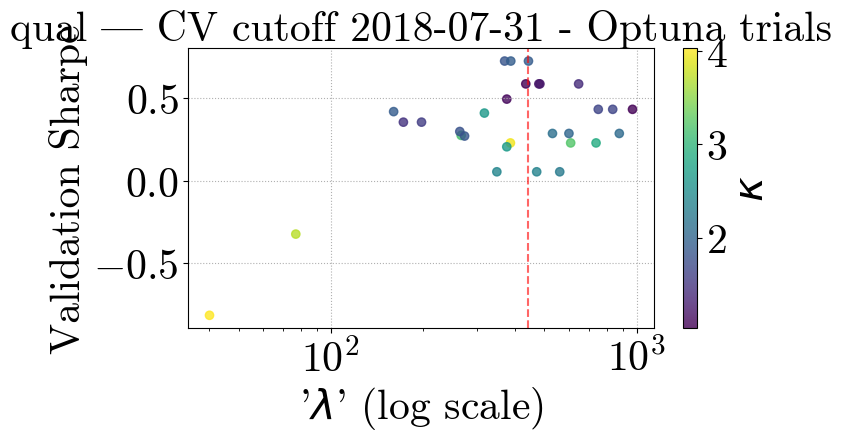

[I 2025-05-06 01:58:04,654] A new study created in memory with name: no-name-08ab114f-6733-460d-a2f5-142696988881
[I 2025-05-06 01:58:09,098] Trial 0 finished with value: -0.39833469591747844 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.39833469591747844.
[I 2025-05-06 01:58:13,928] Trial 1 finished with value: -0.39833469591747844 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.39833469591747844.
[I 2025-05-06 01:58:20,982] Trial 2 finished with value: -0.0661230690228059 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.0661230690228059.
[I 2025-05-06 01:58:33,097] Trial 3 finished with value: 0.016254342583111567 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.016254342583111567.
[I 2025-05-06 01:58:36,597] Trial 4 finished with value: -0.39833469591747

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.2821


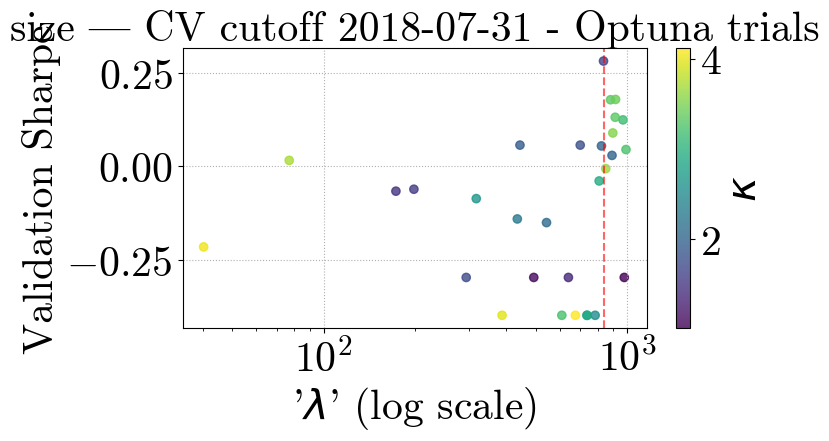

[I 2025-05-06 02:00:11,731] A new study created in memory with name: no-name-ae8fbcc3-e7d1-4619-9260-a1fe5deb94cd
[I 2025-05-06 02:00:17,695] Trial 0 finished with value: -0.8808024869581054 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8808024869581054.
[I 2025-05-06 02:00:23,891] Trial 1 finished with value: -0.14118565437291042 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.14118565437291042.
[I 2025-05-06 02:00:31,201] Trial 2 finished with value: -0.4128714831460206 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.14118565437291042.
[I 2025-05-06 02:00:43,143] Trial 3 finished with value: -0.9104473946131343 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.14118565437291042.
[I 2025-05-06 02:00:49,425] Trial 4 finished with value: -0.1411856543729104

Optuna best λ=879.9806, κ=1.8744413899888643, Sharpe=-0.0849


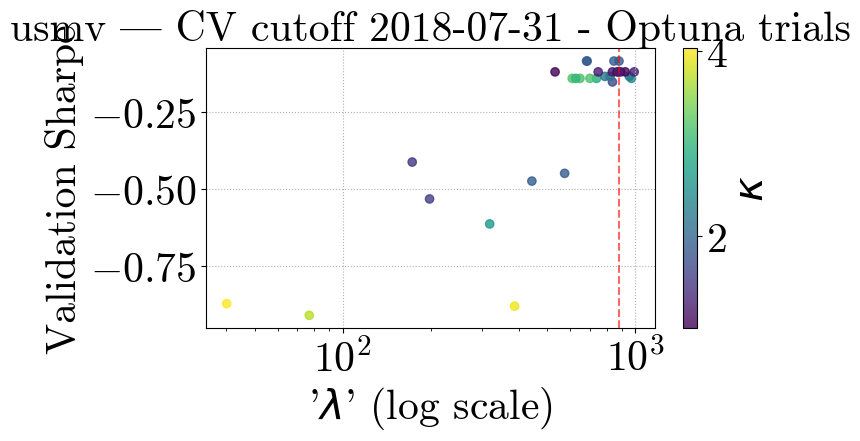

[I 2025-05-06 02:02:49,809] A new study created in memory with name: no-name-55b7c102-6611-40b9-8d3b-c420f9339427
[I 2025-05-06 02:02:56,461] Trial 0 finished with value: 0.3673853984143152 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3673853984143152.
[I 2025-05-06 02:03:00,289] Trial 1 finished with value: 0.569253721466086 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.569253721466086.
[I 2025-05-06 02:03:07,611] Trial 2 finished with value: 0.6336553442718813 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.6336553442718813.
[I 2025-05-06 02:03:14,725] Trial 3 finished with value: 0.09981772850861377 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.6336553442718813.
[I 2025-05-06 02:03:18,443] Trial 4 finished with value: 0.6737465108222533 and parameter

Optuna best λ=473.0977, κ=3.3456787036687925, Sharpe=0.8232


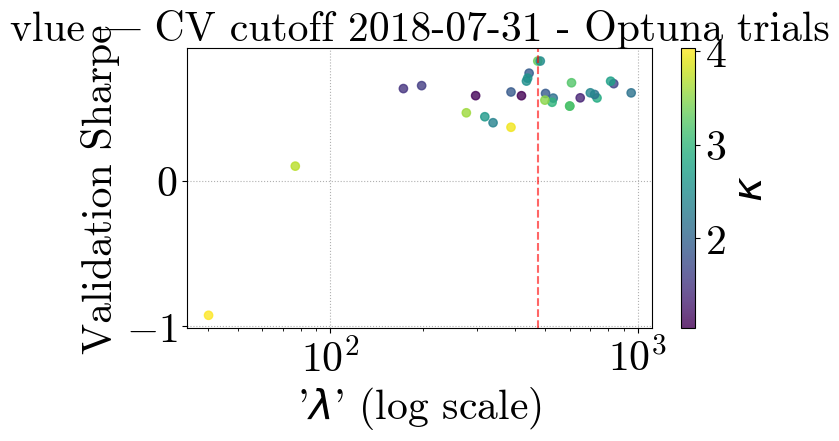

[I 2025-05-06 02:05:29,258] A new study created in memory with name: no-name-5938d8f7-eaed-4447-8cad-18b7ee5f11bd
[I 2025-05-06 02:05:33,694] Trial 0 finished with value: 0.2154808097703509 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2154808097703509.
[I 2025-05-06 02:05:37,104] Trial 1 finished with value: -0.1708704314737196 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.2154808097703509.
[I 2025-05-06 02:05:45,092] Trial 2 finished with value: 0.3653036257619536 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.3653036257619536.
[I 2025-05-06 02:05:54,857] Trial 3 finished with value: 0.5966355502816462 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5966355502816462.
[I 2025-05-06 02:05:59,555] Trial 4 finished with value: -0.19949002047928127 and param

Optuna best λ=69.3054, κ=3.671017647863116, Sharpe=0.7098


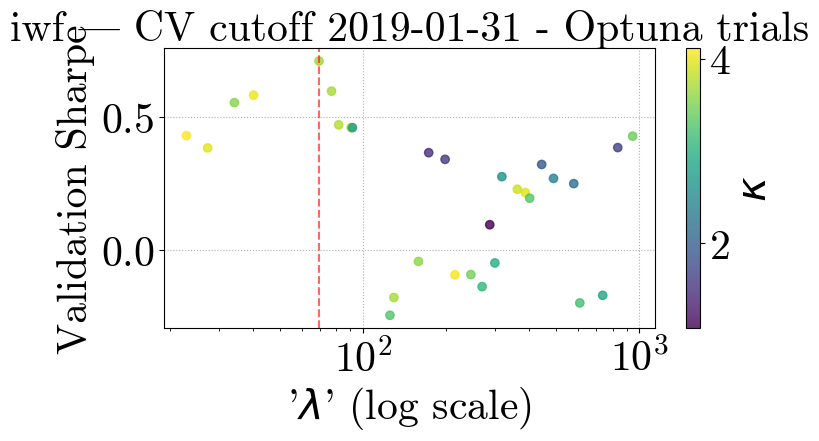

[I 2025-05-06 02:09:34,104] A new study created in memory with name: no-name-ba0bedd3-eee0-4f64-a791-24ed0a733349
[I 2025-05-06 02:09:38,391] Trial 0 finished with value: 0.550203301091921 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.550203301091921.
[I 2025-05-06 02:09:41,974] Trial 1 finished with value: 0.8421132645207239 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.8421132645207239.
[I 2025-05-06 02:09:48,072] Trial 2 finished with value: 0.8599066603287844 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.8599066603287844.
[I 2025-05-06 02:10:01,508] Trial 3 finished with value: 0.995413557094865 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.995413557094865.
[I 2025-05-06 02:10:05,139] Trial 4 finished with value: 0.8611061894937999 and parameters: 

Optuna best λ=81.6520, κ=3.7522741465781455, Sharpe=1.0108


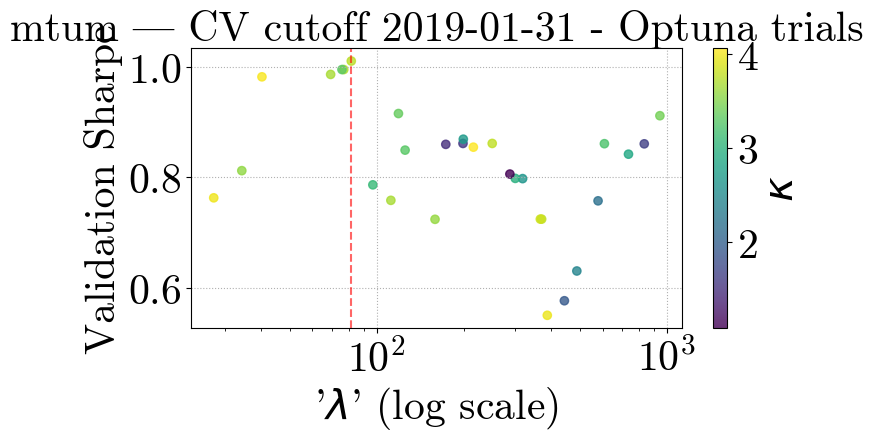

[I 2025-05-06 02:13:20,354] A new study created in memory with name: no-name-0d32be7c-586b-4988-99ab-9f2ccaad6354
[I 2025-05-06 02:13:24,873] Trial 0 finished with value: -0.18208344444713725 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.18208344444713725.
[I 2025-05-06 02:13:29,826] Trial 1 finished with value: -0.21511903322883721 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.18208344444713725.
[I 2025-05-06 02:13:40,222] Trial 2 finished with value: -0.27256337786557233 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.18208344444713725.
[I 2025-05-06 02:13:47,505] Trial 3 finished with value: -0.31087695927217474 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.18208344444713725.
[I 2025-05-06 02:13:51,586] Trial 4 finished with value: -0.189943014458

Optuna best λ=333.3205, κ=1.053853654677886, Sharpe=0.0631


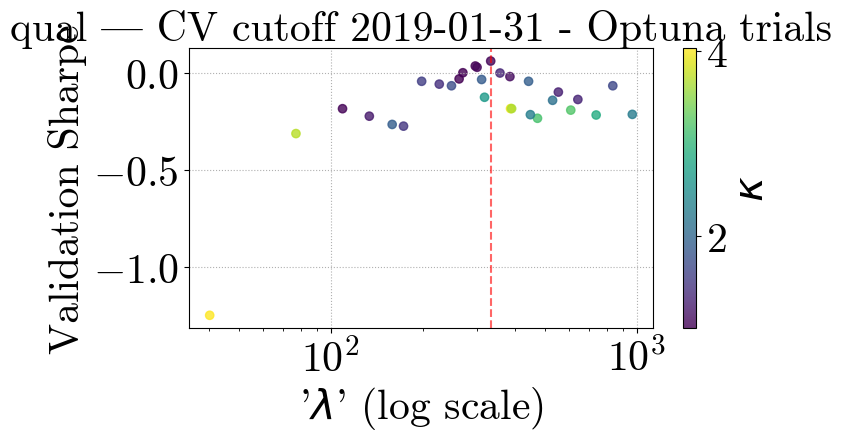

[I 2025-05-06 02:16:58,060] A new study created in memory with name: no-name-b3775084-ad83-40d0-ac94-1d8bc8a73420
[I 2025-05-06 02:17:02,001] Trial 0 finished with value: 0.008235996532747019 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.008235996532747019.
[I 2025-05-06 02:17:05,400] Trial 1 finished with value: 0.008235996532747019 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.008235996532747019.
[I 2025-05-06 02:17:14,892] Trial 2 finished with value: -0.33879014640609145 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.008235996532747019.
[I 2025-05-06 02:17:27,820] Trial 3 finished with value: -0.013410520507244563 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.008235996532747019.
[I 2025-05-06 02:17:31,452] Trial 4 finished with value: 0.008235996532

Optuna best λ=643.9620, κ=2.3787578876612008, Sharpe=0.0543


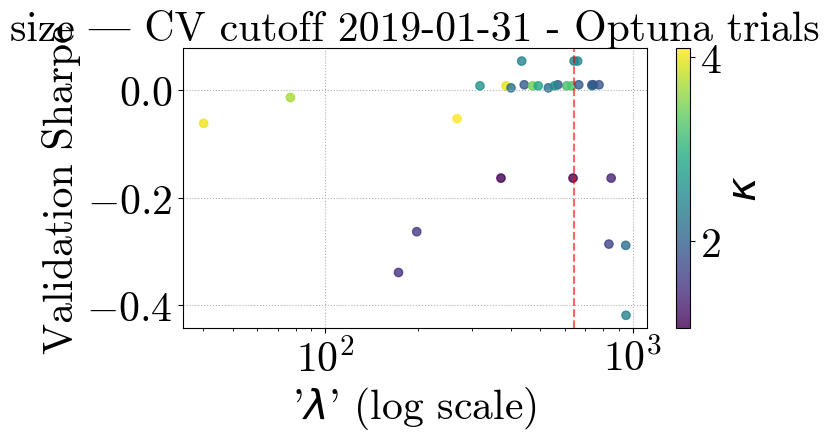

[I 2025-05-06 02:19:33,434] A new study created in memory with name: no-name-c02eac24-4c52-44cd-ad2f-3ec1637ea0d2
[I 2025-05-06 02:19:37,837] Trial 0 finished with value: -0.7363898500629984 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7363898500629984.
[I 2025-05-06 02:19:42,433] Trial 1 finished with value: -0.06768240605917339 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.06768240605917339.
[I 2025-05-06 02:19:49,019] Trial 2 finished with value: -0.5109035982479582 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.06768240605917339.
[I 2025-05-06 02:20:05,722] Trial 3 finished with value: -0.8339144291321666 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.06768240605917339.
[I 2025-05-06 02:20:11,003] Trial 4 finished with value: -0.0676824060591733

Optuna best λ=643.9620, κ=1.88209113158397, Sharpe=-0.0091


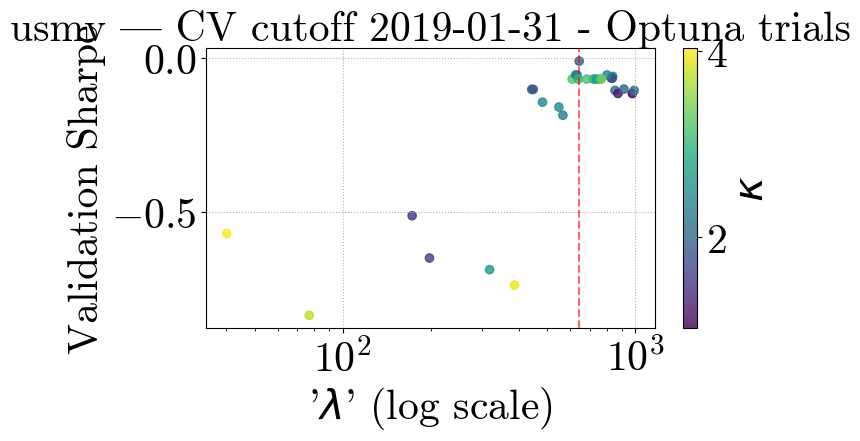

[I 2025-05-06 02:22:19,090] A new study created in memory with name: no-name-468ac787-ef3a-4a46-a880-fd21ab6f1c49
[I 2025-05-06 02:22:27,382] Trial 0 finished with value: 0.20324840711981063 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.20324840711981063.
[I 2025-05-06 02:22:31,663] Trial 1 finished with value: -0.1471339009537869 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.20324840711981063.
[I 2025-05-06 02:22:39,264] Trial 2 finished with value: 0.4114057206344459 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.4114057206344459.
[I 2025-05-06 02:22:48,182] Trial 3 finished with value: 0.2599547034790495 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.4114057206344459.
[I 2025-05-06 02:22:54,712] Trial 4 finished with value: -0.042313737547054114 and p

Optuna best λ=946.2338, κ=1.018729835827171, Sharpe=0.4571


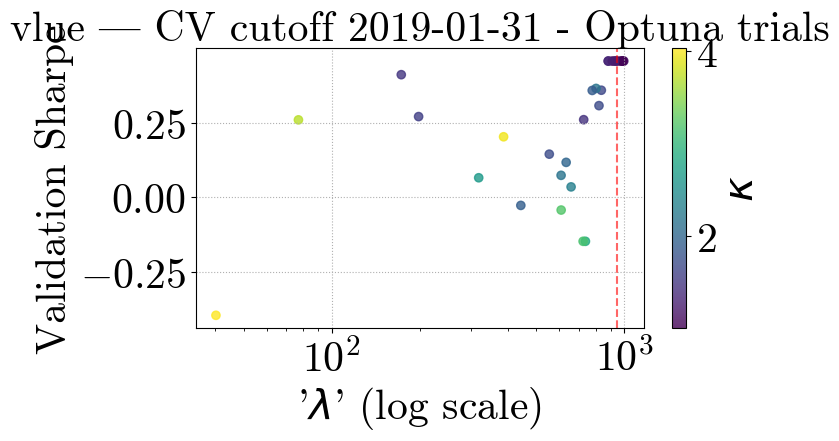

[I 2025-05-06 02:24:23,497] A new study created in memory with name: no-name-21e2aa79-39c4-4cf3-94c5-ec01fb3152aa
[I 2025-05-06 02:24:29,547] Trial 0 finished with value: 0.5559540276348766 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5559540276348766.
[I 2025-05-06 02:24:34,662] Trial 1 finished with value: 0.3012764524702501 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5559540276348766.
[I 2025-05-06 02:24:45,183] Trial 2 finished with value: 0.7114055666657245 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7114055666657245.
[I 2025-05-06 02:24:56,366] Trial 3 finished with value: 0.9226342078970148 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.9226342078970148.
[I 2025-05-06 02:25:03,030] Trial 4 finished with value: 0.12782911806787778 and paramet

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.9226


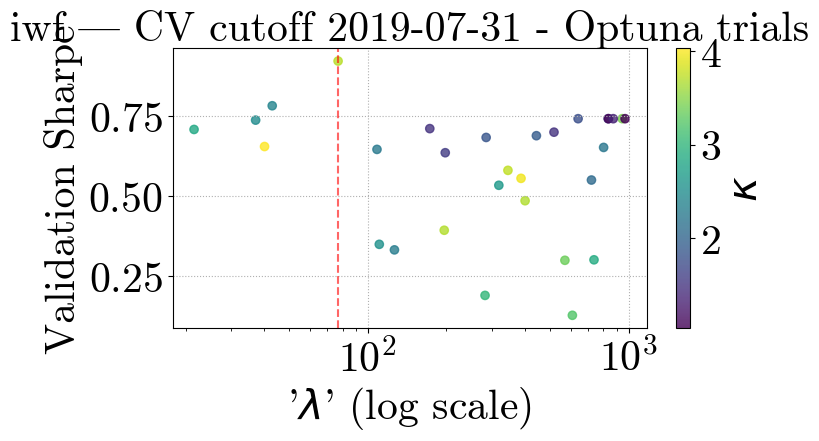

[I 2025-05-06 02:28:56,138] A new study created in memory with name: no-name-1e913ba1-9fea-4fce-908f-9e4735a0ba1c
[I 2025-05-06 02:29:01,198] Trial 0 finished with value: 0.7562980573325399 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.7562980573325399.
[I 2025-05-06 02:29:05,429] Trial 1 finished with value: 1.0925286542125874 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0925286542125874.
[I 2025-05-06 02:29:12,428] Trial 2 finished with value: 1.0551851638310765 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0925286542125874.
[I 2025-05-06 02:29:24,060] Trial 3 finished with value: 1.1231337145586935 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.1231337145586935.
[I 2025-05-06 02:29:27,815] Trial 4 finished with value: 1.054036982932544 and parameter

Optuna best λ=924.3913, κ=2.8611673105897544, Sharpe=1.2404


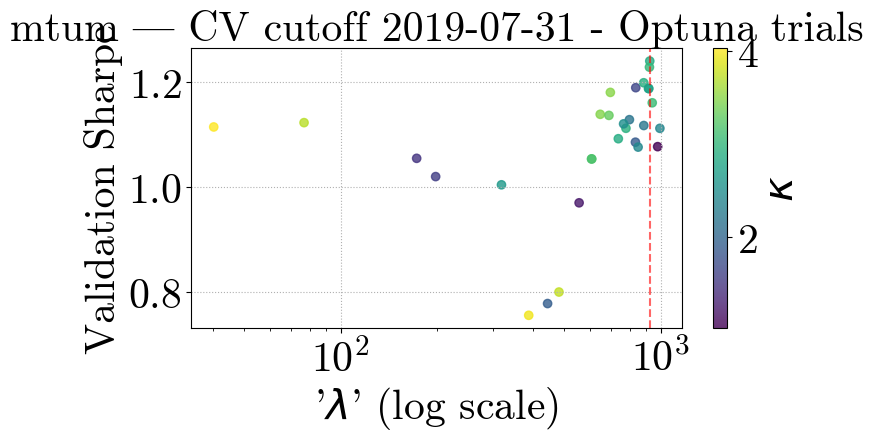

[I 2025-05-06 02:31:19,322] A new study created in memory with name: no-name-3f062d99-3bda-4b5f-b8bf-d6741a6de7d9
[I 2025-05-06 02:31:26,412] Trial 0 finished with value: 0.4883335739008769 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4883335739008769.
[I 2025-05-06 02:31:31,677] Trial 1 finished with value: 0.5138688245068728 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5138688245068728.
[I 2025-05-06 02:31:39,897] Trial 2 finished with value: 0.37225333928945953 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5138688245068728.
[I 2025-05-06 02:31:53,514] Trial 3 finished with value: -0.7493529514760818 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5138688245068728.
[I 2025-05-06 02:31:59,496] Trial 4 finished with value: 0.2960723626927322 and parame

Optuna best λ=708.9928, κ=1.0823503127445395, Sharpe=0.5386


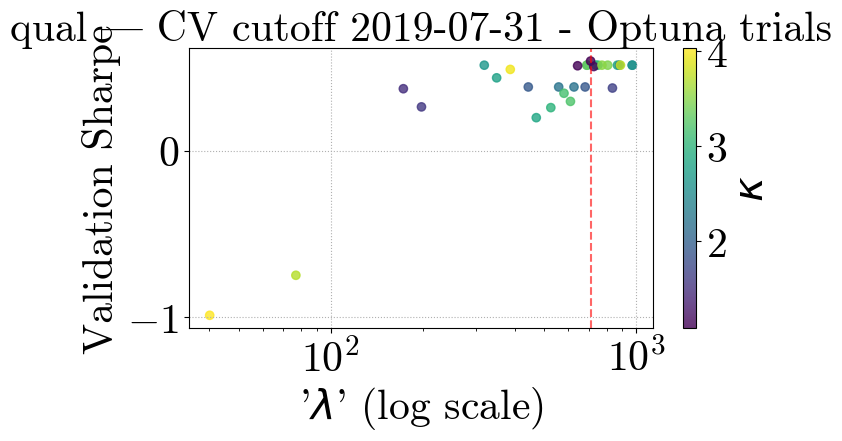

[I 2025-05-06 02:35:01,174] A new study created in memory with name: no-name-0dc50b36-df73-4ede-9bcc-5983ffbf5ff2
[I 2025-05-06 02:35:07,242] Trial 0 finished with value: 0.34769010121502203 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.34769010121502203.
[I 2025-05-06 02:35:11,791] Trial 1 finished with value: -0.2855063249473827 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.34769010121502203.
[I 2025-05-06 02:35:17,957] Trial 2 finished with value: -0.3754626222876542 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.34769010121502203.
[I 2025-05-06 02:35:33,746] Trial 3 finished with value: -0.3890408463675952 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.34769010121502203.
[I 2025-05-06 02:35:38,143] Trial 4 finished with value: 0.34769010121502203 and

Optuna best λ=680.1324, κ=2.81703364487058, Sharpe=0.3477


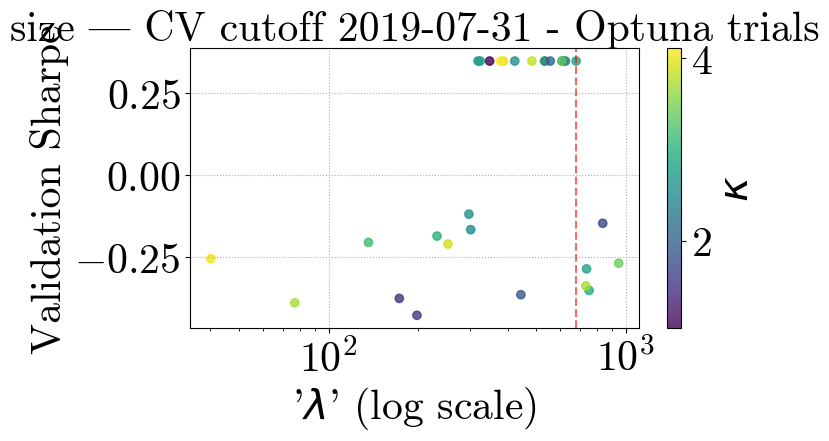

[I 2025-05-06 02:38:03,642] A new study created in memory with name: no-name-129a0079-49c3-42ea-a9c9-e164e7ca2951
[I 2025-05-06 02:38:08,593] Trial 0 finished with value: -0.8285272527456105 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.8285272527456105.
[I 2025-05-06 02:38:12,177] Trial 1 finished with value: -0.06934218022155603 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.06934218022155603.
[I 2025-05-06 02:38:18,174] Trial 2 finished with value: -0.5447091559942637 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.06934218022155603.
[I 2025-05-06 02:38:30,390] Trial 3 finished with value: -0.9682748816906409 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.06934218022155603.
[I 2025-05-06 02:38:35,543] Trial 4 finished with value: -0.6315915160827398

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1787


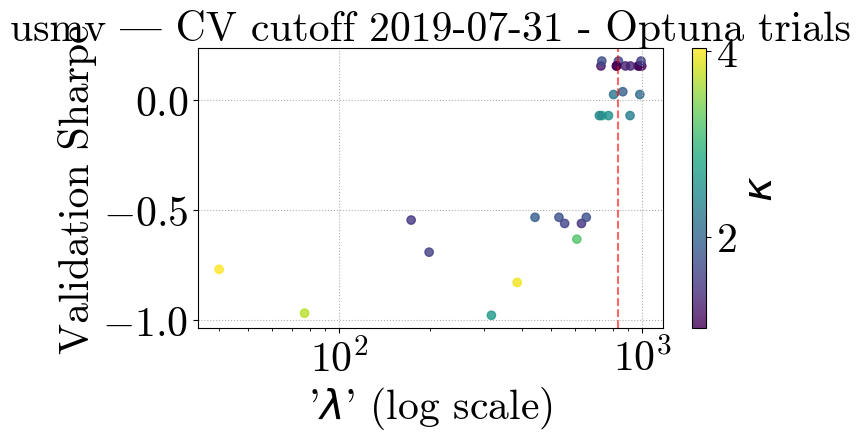

[I 2025-05-06 02:40:21,940] A new study created in memory with name: no-name-ec206f45-71f6-46d8-88f9-b27b2b62fa12
[I 2025-05-06 02:40:29,789] Trial 0 finished with value: 0.24676736239780214 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.24676736239780214.
[I 2025-05-06 02:40:33,825] Trial 1 finished with value: 0.2763080404439151 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2763080404439151.
[I 2025-05-06 02:40:41,007] Trial 2 finished with value: 0.5776866678618099 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.5776866678618099.
[I 2025-05-06 02:40:49,323] Trial 3 finished with value: 0.352584663284972 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.5776866678618099.
[I 2025-05-06 02:40:54,755] Trial 4 finished with value: 0.5442706664166672 and paramet

Optuna best λ=231.4047, κ=1.7980101744817147, Sharpe=0.6859


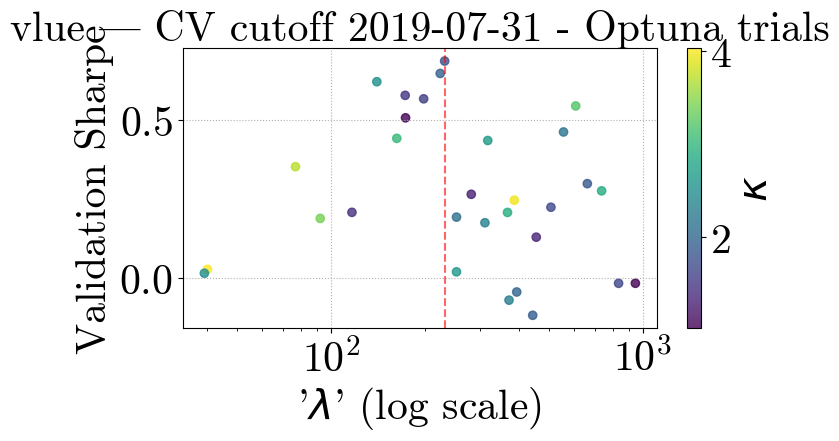

[I 2025-05-06 02:43:38,388] A new study created in memory with name: no-name-58260943-ea3e-4f3a-8535-6e06a54366e8
[I 2025-05-06 02:43:42,691] Trial 0 finished with value: 0.6000488512904031 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6000488512904031.
[I 2025-05-06 02:43:45,770] Trial 1 finished with value: 0.2316773451247978 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6000488512904031.
[I 2025-05-06 02:43:55,320] Trial 2 finished with value: 0.5790875391623913 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6000488512904031.
[I 2025-05-06 02:44:08,022] Trial 3 finished with value: 1.0856864278580602 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.0856864278580602.
[I 2025-05-06 02:44:11,506] Trial 4 finished with value: 0.26533371631342745 and paramet

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.1704


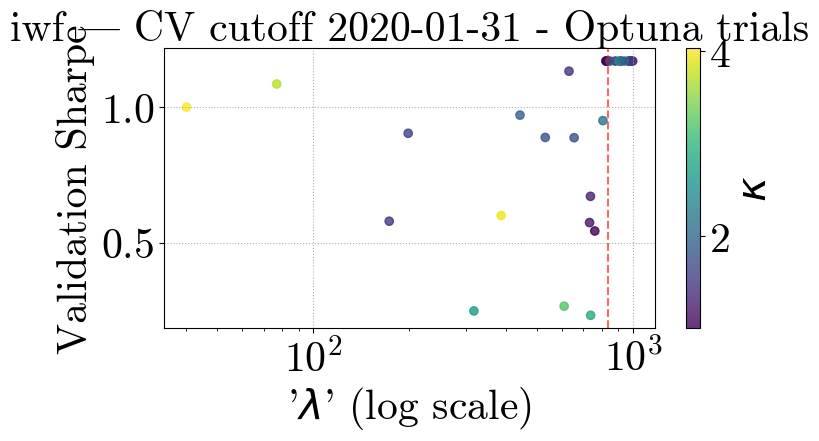

[I 2025-05-06 02:45:59,773] A new study created in memory with name: no-name-5ee985b9-4e83-4802-bb63-05595ae2a7a5
[I 2025-05-06 02:46:07,436] Trial 0 finished with value: 1.0215537816270062 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 1.0215537816270062.
[I 2025-05-06 02:46:11,596] Trial 1 finished with value: 1.3779292682173905 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.3779292682173905.
[I 2025-05-06 02:46:20,418] Trial 2 finished with value: 1.3872912415103766 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 1.3872912415103766.
[I 2025-05-06 02:46:32,638] Trial 3 finished with value: 1.1985390179173399 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 1.3872912415103766.
[I 2025-05-06 02:46:37,284] Trial 4 finished with value: 1.3342370706995657 and paramete

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=1.4806


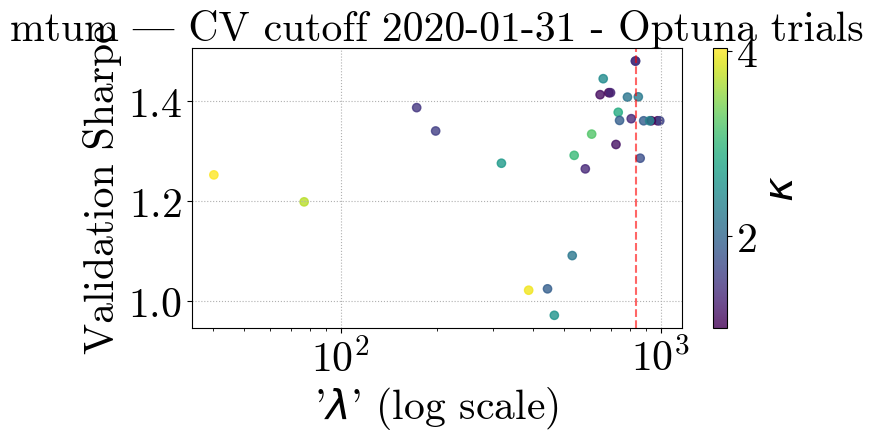

[I 2025-05-06 02:48:50,769] A new study created in memory with name: no-name-e618abd9-7804-468b-a27b-9a78f2ce8bff
[I 2025-05-06 02:48:56,890] Trial 0 finished with value: 0.6762832517029712 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6762832517029712.
[I 2025-05-06 02:49:02,685] Trial 1 finished with value: 1.0271741035277786 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0271741035277786.
[I 2025-05-06 02:49:09,302] Trial 2 finished with value: 0.06763710553877544 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0271741035277786.
[I 2025-05-06 02:49:24,254] Trial 3 finished with value: -0.8603111107832693 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0271741035277786.
[I 2025-05-06 02:49:29,450] Trial 4 finished with value: 0.49074618397224967 and param

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=1.0272


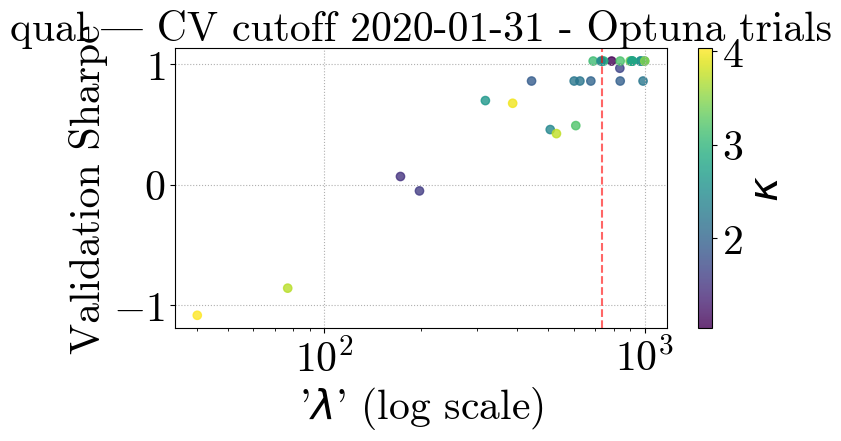

[I 2025-05-06 02:52:54,404] A new study created in memory with name: no-name-d4ab6301-4625-4a71-93c9-0d5bcfc74374
[I 2025-05-06 02:52:58,382] Trial 0 finished with value: 0.34357540296479405 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.34357540296479405.
[I 2025-05-06 02:53:03,133] Trial 1 finished with value: 0.34357540296479405 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.34357540296479405.
[I 2025-05-06 02:53:10,103] Trial 2 finished with value: -0.35376289550548284 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.34357540296479405.
[I 2025-05-06 02:53:25,985] Trial 3 finished with value: -0.29407342621560406 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.34357540296479405.
[I 2025-05-06 02:53:30,160] Trial 4 finished with value: 0.34357540296479405 a

Optuna best λ=251.1931, κ=3.132907707315758, Sharpe=0.4338


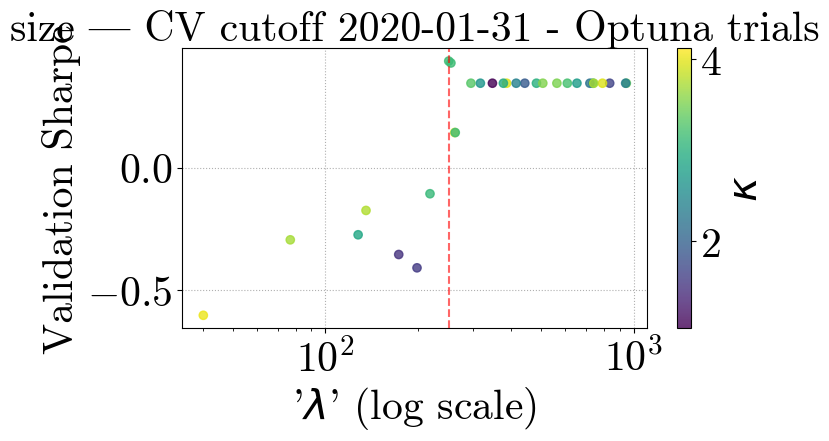

[I 2025-05-06 02:56:10,733] A new study created in memory with name: no-name-b67523c1-9c2b-4ce1-a15c-4bbb0addc4d6
[I 2025-05-06 02:56:15,415] Trial 0 finished with value: -1.1773566211045434 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1773566211045434.
[I 2025-05-06 02:56:19,697] Trial 1 finished with value: 0.5193376231962296 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5193376231962296.
[I 2025-05-06 02:56:25,264] Trial 2 finished with value: -0.08953179621319807 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5193376231962296.
[I 2025-05-06 02:56:36,216] Trial 3 finished with value: -0.594332239615723 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5193376231962296.
[I 2025-05-06 02:56:39,700] Trial 4 finished with value: 0.5193376231962296 and para

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.5193


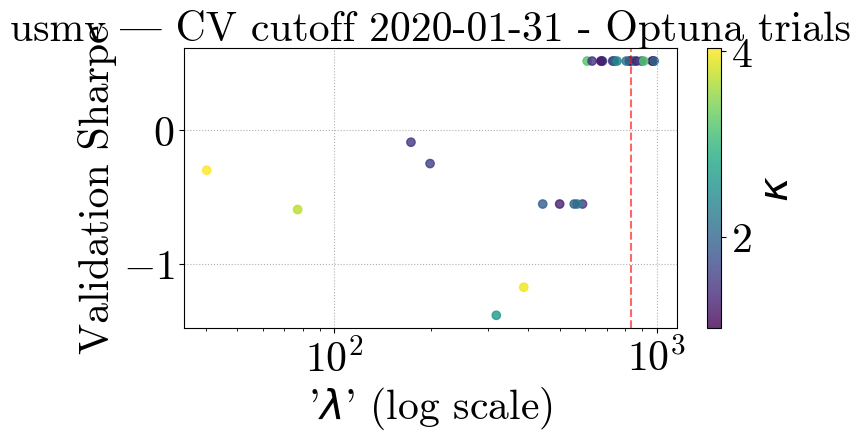

[I 2025-05-06 02:58:54,811] A new study created in memory with name: no-name-2bd71d89-f25d-43e8-8b03-ea85274c9b2a
[I 2025-05-06 02:59:02,512] Trial 0 finished with value: -0.589392438300368 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.589392438300368.
[I 2025-05-06 02:59:07,281] Trial 1 finished with value: -0.36231461359879485 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.36231461359879485.
[I 2025-05-06 02:59:14,946] Trial 2 finished with value: -0.04227342137551718 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.04227342137551718.
[I 2025-05-06 02:59:22,911] Trial 3 finished with value: -1.094433173803178 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.04227342137551718.
[I 2025-05-06 02:59:28,515] Trial 4 finished with value: -0.9461662355303189 a

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=-0.0423


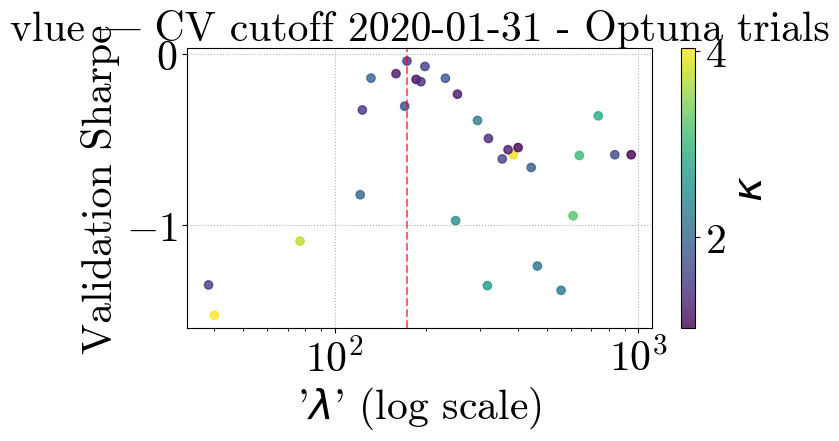

[I 2025-05-06 03:01:48,649] A new study created in memory with name: no-name-974f70db-b63c-4a16-8f04-dc764e29e913
[I 2025-05-06 03:01:55,313] Trial 0 finished with value: 0.6950944262489815 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6950944262489815.
[I 2025-05-06 03:02:00,461] Trial 1 finished with value: 0.8984308721606364 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.8984308721606364.
[I 2025-05-06 03:02:13,970] Trial 2 finished with value: 0.7939608027141677 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.8984308721606364.
[I 2025-05-06 03:02:26,165] Trial 3 finished with value: 1.0528700876390091 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 1.0528700876390091.
[I 2025-05-06 03:02:31,128] Trial 4 finished with value: 1.0662993486776111 and paramete

Optuna best λ=673.1652, κ=1.708368092215901, Sharpe=1.3834


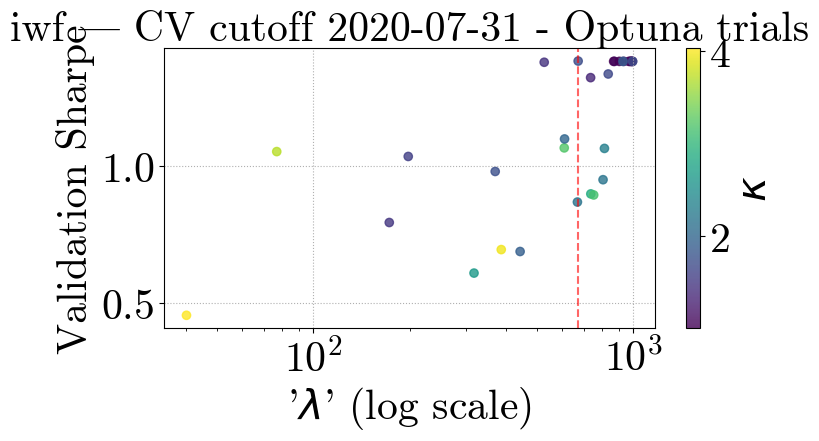

[I 2025-05-06 03:04:23,464] A new study created in memory with name: no-name-b138aa4b-ddfd-4873-a739-18b6f08d5c2d
[I 2025-05-06 03:04:28,465] Trial 0 finished with value: 0.4969815514073137 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4969815514073137.
[I 2025-05-06 03:04:32,566] Trial 1 finished with value: 1.0382113041840841 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 1.0382113041840841.
[I 2025-05-06 03:04:44,081] Trial 2 finished with value: 0.5537641149416179 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 1.0382113041840841.
[I 2025-05-06 03:05:02,693] Trial 3 finished with value: 0.587179686280441 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 1.0382113041840841.
[I 2025-05-06 03:05:06,725] Trial 4 finished with value: 1.0173519390325239 and parameter

Optuna best λ=658.4141, κ=1.032158511026232, Sharpe=1.1167


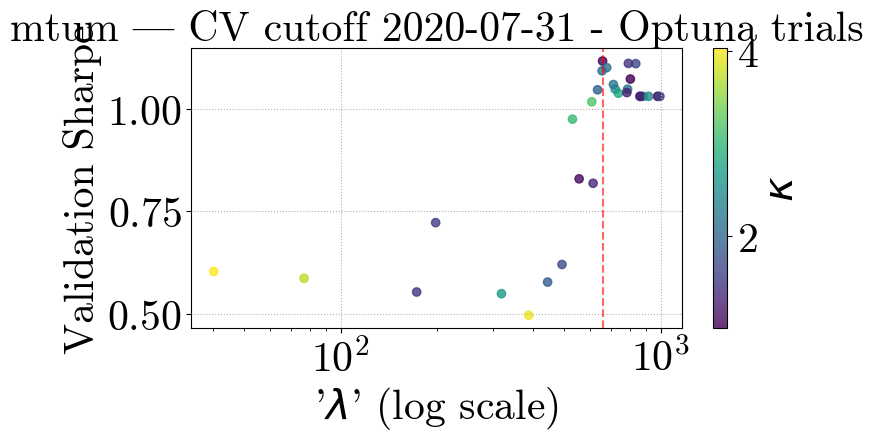

[I 2025-05-06 03:07:07,608] A new study created in memory with name: no-name-76e5f2a9-deb3-435c-9100-2c4484b5da11
[I 2025-05-06 03:07:15,529] Trial 0 finished with value: -0.2633520565777672 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2633520565777672.
[I 2025-05-06 03:07:21,909] Trial 1 finished with value: 0.664178789384786 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.664178789384786.
[I 2025-05-06 03:07:29,326] Trial 2 finished with value: -0.28311102263620413 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.664178789384786.
[I 2025-05-06 03:07:43,845] Trial 3 finished with value: -0.27885632324049664 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.664178789384786.
[I 2025-05-06 03:07:51,625] Trial 4 finished with value: 0.2537242443836671 and parame

Optuna best λ=970.8952, κ=2.2663308165415326, Sharpe=0.6642


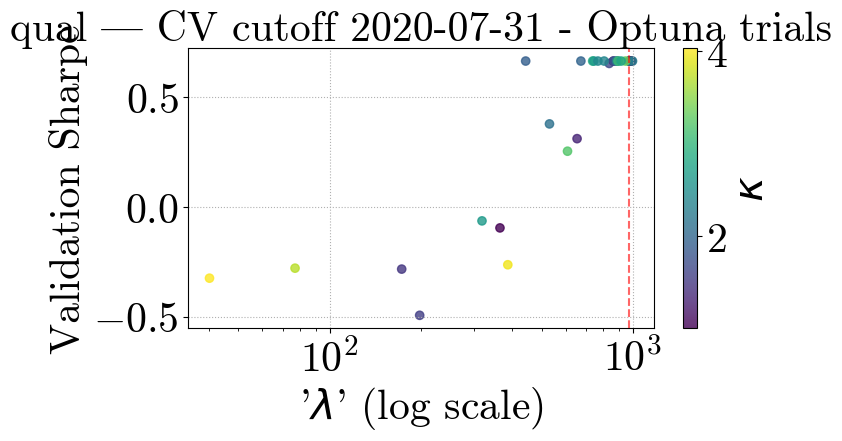

[I 2025-05-06 03:10:43,740] A new study created in memory with name: no-name-5f707b44-6d04-462d-b6a3-5b234fa764bb
[I 2025-05-06 03:10:51,209] Trial 0 finished with value: 0.22629472983173993 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.22629472983173993.
[I 2025-05-06 03:10:56,642] Trial 1 finished with value: 0.15016254380801666 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.22629472983173993.
[I 2025-05-06 03:11:06,040] Trial 2 finished with value: -0.29136867561066176 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.22629472983173993.
[I 2025-05-06 03:11:16,892] Trial 3 finished with value: -0.39801678642827715 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.22629472983173993.
[I 2025-05-06 03:11:22,609] Trial 4 finished with value: 0.3219370469590847 an

Optuna best λ=948.0226, κ=2.1745901556389544, Sharpe=0.6607


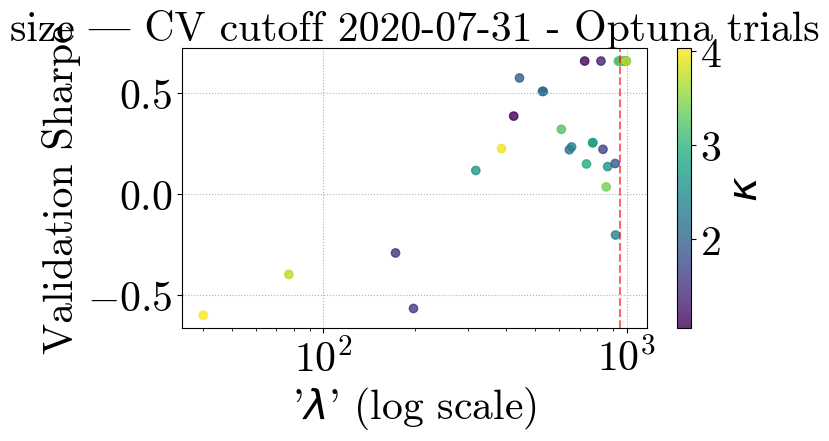

[I 2025-05-06 03:13:09,190] A new study created in memory with name: no-name-0f169e1c-975d-4d80-9bb6-8d645d150876
[I 2025-05-06 03:13:13,571] Trial 0 finished with value: -1.3790185324033426 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.3790185324033426.
[I 2025-05-06 03:13:17,693] Trial 1 finished with value: 0.0028739276558973842 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.0028739276558973842.
[I 2025-05-06 03:13:24,692] Trial 2 finished with value: -0.777191114816359 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.0028739276558973842.
[I 2025-05-06 03:13:36,405] Trial 3 finished with value: -1.2872430333995737 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.0028739276558973842.
[I 2025-05-06 03:13:40,792] Trial 4 finished with value: 0.00287392765589

Optuna best λ=491.6627, κ=1.3027345563563058, Sharpe=0.0029


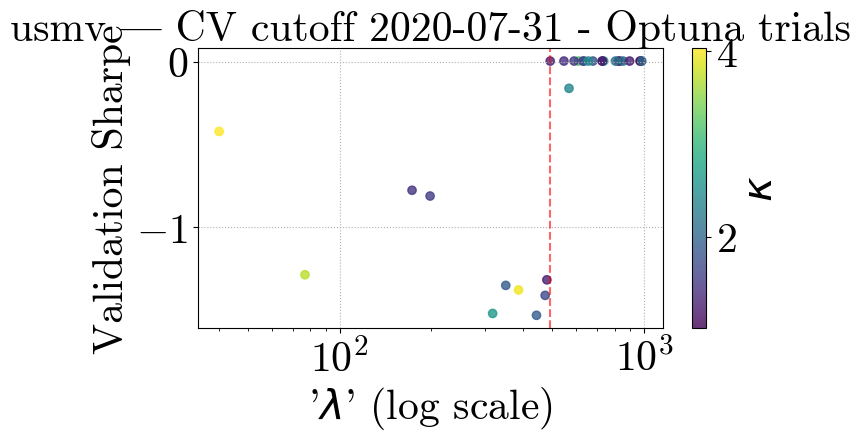

[I 2025-05-06 03:15:40,636] A new study created in memory with name: no-name-44419c59-c9fb-4fb6-a7fe-d005ca4f8109
[I 2025-05-06 03:15:47,253] Trial 0 finished with value: -0.15847857952823471 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.15847857952823471.
[I 2025-05-06 03:15:52,022] Trial 1 finished with value: -0.6158792266551714 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.15847857952823471.
[I 2025-05-06 03:15:59,353] Trial 2 finished with value: -0.5332943181997805 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.15847857952823471.
[I 2025-05-06 03:16:06,871] Trial 3 finished with value: -0.9982101692189586 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.15847857952823471.
[I 2025-05-06 03:16:12,540] Trial 4 finished with value: -1.282922233638332

Optuna best λ=137.4059, κ=3.397377071789711, Sharpe=0.1688


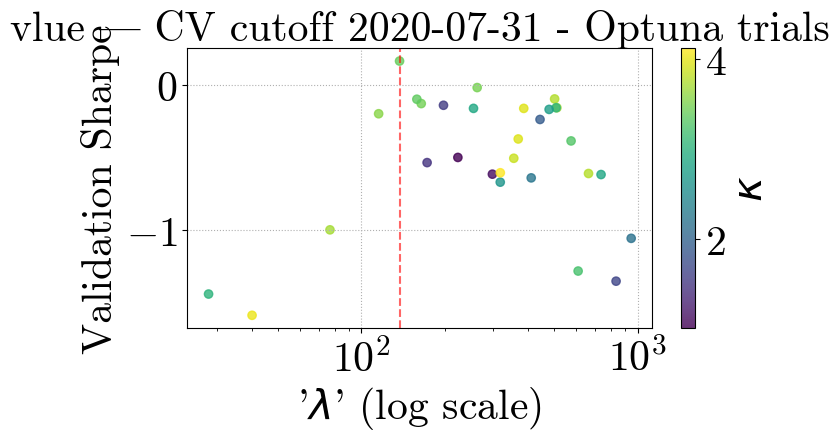

[I 2025-05-06 03:18:56,189] A new study created in memory with name: no-name-0689fede-43cc-4109-9ebe-5b7d7ba711a2
[I 2025-05-06 03:19:01,408] Trial 0 finished with value: 0.8161166534242702 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8161166534242702.
[I 2025-05-06 03:19:05,608] Trial 1 finished with value: 0.8245133265537156 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.8245133265537156.
[I 2025-05-06 03:19:12,206] Trial 2 finished with value: 0.6238001514320839 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.8245133265537156.
[I 2025-05-06 03:19:25,807] Trial 3 finished with value: 0.3615754726678288 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.8245133265537156.
[I 2025-05-06 03:19:30,268] Trial 4 finished with value: 0.9122129028675895 and paramete

Optuna best λ=568.1037, κ=3.3773605056457723, Sharpe=0.9768


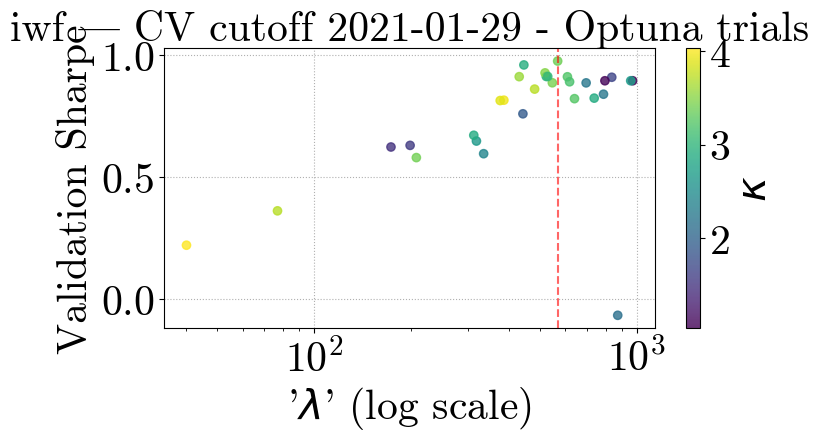

[I 2025-05-06 03:21:44,334] A new study created in memory with name: no-name-3f19ed61-6f9e-4060-87b1-b03e5de9d89e
[I 2025-05-06 03:21:48,887] Trial 0 finished with value: 0.20404250799402576 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.20404250799402576.
[I 2025-05-06 03:21:53,418] Trial 1 finished with value: 0.4417783656234517 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.4417783656234517.
[I 2025-05-06 03:22:00,737] Trial 2 finished with value: 0.10438102566641552 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.4417783656234517.
[I 2025-05-06 03:22:17,585] Trial 3 finished with value: 0.25173422738435264 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.4417783656234517.
[I 2025-05-06 03:22:21,900] Trial 4 finished with value: 0.44340808282375627 and par

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.6427


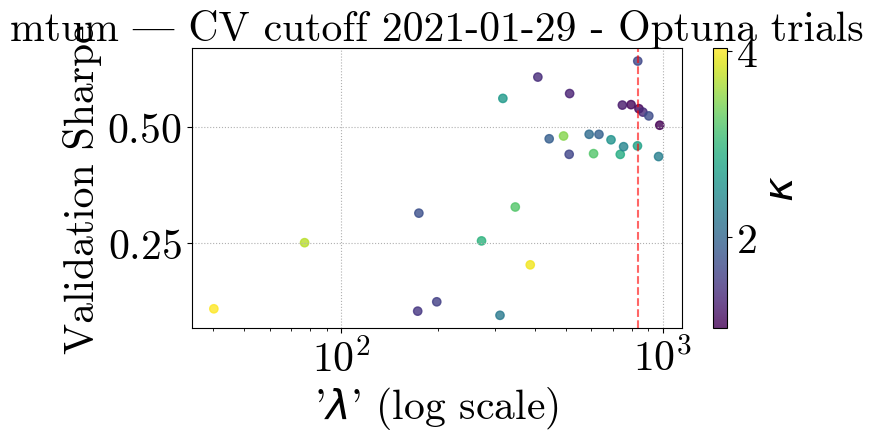

[I 2025-05-06 03:24:44,491] A new study created in memory with name: no-name-55cf3a75-3b2f-45e2-a071-6f3397e6e070
[I 2025-05-06 03:24:51,334] Trial 0 finished with value: -0.3489596103918129 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.3489596103918129.
[I 2025-05-06 03:24:56,467] Trial 1 finished with value: 0.06580357785580067 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.06580357785580067.
[I 2025-05-06 03:25:03,586] Trial 2 finished with value: 0.023885903525747425 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.06580357785580067.
[I 2025-05-06 03:25:17,173] Trial 3 finished with value: -0.10879361352315557 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.06580357785580067.
[I 2025-05-06 03:25:23,152] Trial 4 finished with value: -0.020279075851514432

Optuna best λ=663.5696, κ=1.3716114148355192, Sharpe=0.4266


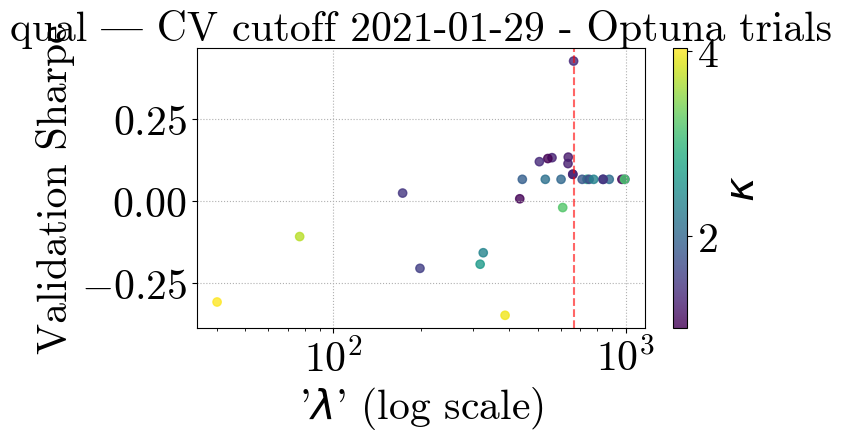

[I 2025-05-06 03:28:06,397] A new study created in memory with name: no-name-75f41e35-3e03-4c23-8336-2f2e16577931
[I 2025-05-06 03:28:11,584] Trial 0 finished with value: 0.447322069013351 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.447322069013351.
[I 2025-05-06 03:28:17,229] Trial 1 finished with value: 0.4290717076157326 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.447322069013351.
[I 2025-05-06 03:28:25,112] Trial 2 finished with value: 0.27813686020843176 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.447322069013351.
[I 2025-05-06 03:28:37,485] Trial 3 finished with value: -0.30328796354104837 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.447322069013351.
[I 2025-05-06 03:28:42,261] Trial 4 finished with value: 0.5055845428818992 and parameters

Optuna best λ=443.3061, κ=1.9095393660962992, Sharpe=0.6086


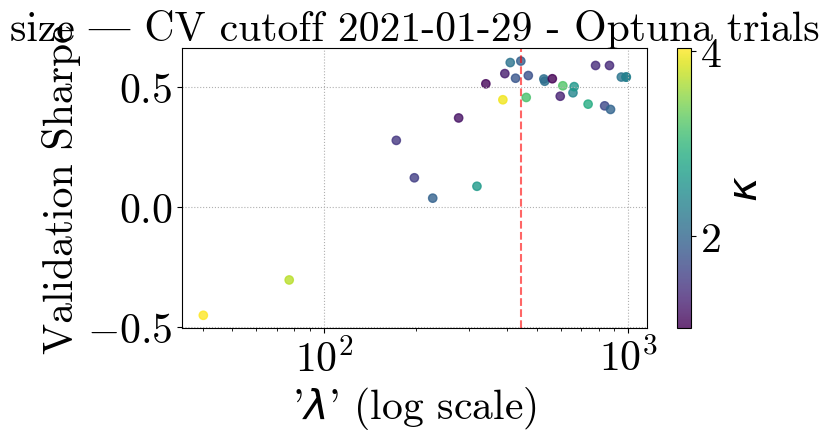

[I 2025-05-06 03:30:57,599] A new study created in memory with name: no-name-4495c1e4-b7ad-4942-a569-e1e9115a6ff6
[I 2025-05-06 03:31:02,116] Trial 0 finished with value: -1.875664493199212 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.875664493199212.
[I 2025-05-06 03:31:06,116] Trial 1 finished with value: 0.008697578517697804 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.008697578517697804.
[I 2025-05-06 03:31:11,214] Trial 2 finished with value: -1.0625058365961149 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.008697578517697804.
[I 2025-05-06 03:31:28,100] Trial 3 finished with value: -0.863001962625632 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.008697578517697804.
[I 2025-05-06 03:31:32,045] Trial 4 finished with value: -1.4386752242993928 an

Optuna best λ=987.3911, κ=2.2256718351156524, Sharpe=0.0386


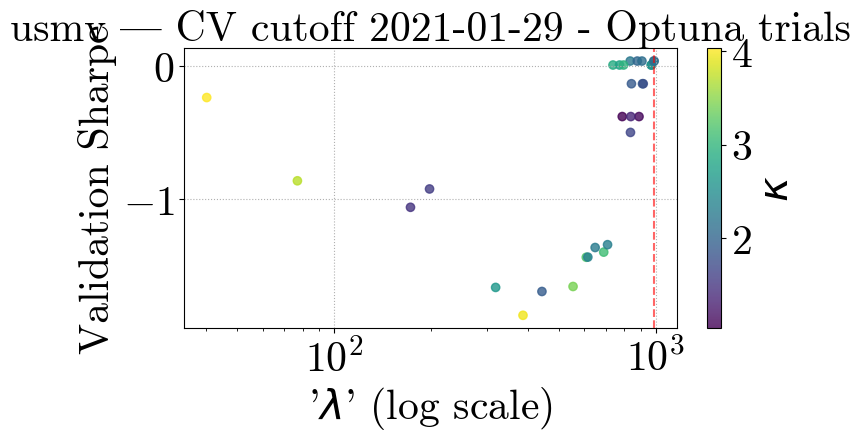

[I 2025-05-06 03:33:31,313] A new study created in memory with name: no-name-4e5ea7ba-5758-4623-ba69-a0853a1cf8c7
[I 2025-05-06 03:33:41,646] Trial 0 finished with value: -0.140287527352171 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.140287527352171.
[I 2025-05-06 03:33:45,384] Trial 1 finished with value: -0.8365935812845293 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.140287527352171.
[I 2025-05-06 03:33:55,581] Trial 2 finished with value: -0.1946088389463626 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.140287527352171.
[I 2025-05-06 03:34:04,714] Trial 3 finished with value: -0.708447129686173 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.140287527352171.
[I 2025-05-06 03:34:09,579] Trial 4 finished with value: -1.4806193906753073 and param

Optuna best λ=130.0925, κ=3.017077883301691, Sharpe=0.0101


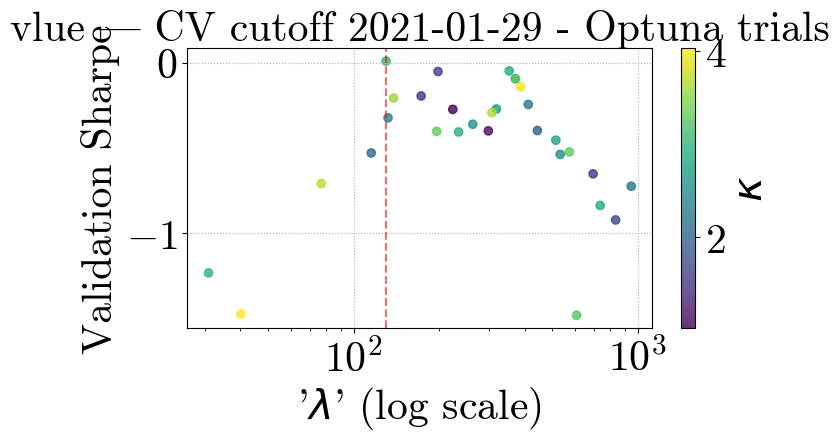

[I 2025-05-06 03:37:23,177] A new study created in memory with name: no-name-eac38d13-00c7-4c7e-bdd8-3e721fb960eb
[I 2025-05-06 03:37:29,259] Trial 0 finished with value: 0.6598616455416842 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.6598616455416842.
[I 2025-05-06 03:37:34,013] Trial 1 finished with value: 0.6286259916134099 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.6598616455416842.
[I 2025-05-06 03:37:41,728] Trial 2 finished with value: 0.6085184579744839 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.6598616455416842.
[I 2025-05-06 03:37:54,229] Trial 3 finished with value: 0.30206922852934964 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.6598616455416842.
[I 2025-05-06 03:37:59,347] Trial 4 finished with value: 0.6669470685642817 and paramet

Optuna best λ=597.0792, κ=2.339247115980923, Sharpe=0.7647


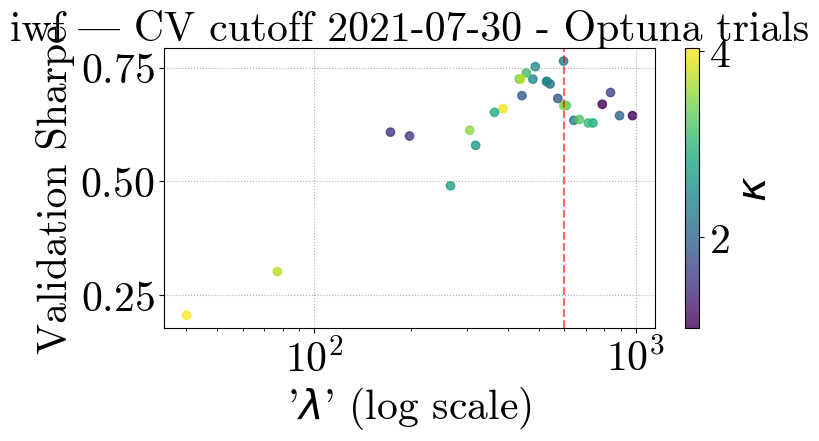

[I 2025-05-06 03:40:29,229] A new study created in memory with name: no-name-a4f4024c-a358-4c88-9bd6-a155c5b7f5c5
[I 2025-05-06 03:40:36,794] Trial 0 finished with value: 0.07155856834459955 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.07155856834459955.
[I 2025-05-06 03:40:41,059] Trial 1 finished with value: 0.2751806428093953 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.2751806428093953.
[I 2025-05-06 03:40:49,925] Trial 2 finished with value: 0.06826212627548736 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.2751806428093953.
[I 2025-05-06 03:41:08,509] Trial 3 finished with value: -0.4936522363679677 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.2751806428093953.
[I 2025-05-06 03:41:12,546] Trial 4 finished with value: 0.2751806428093953 and para

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.2752


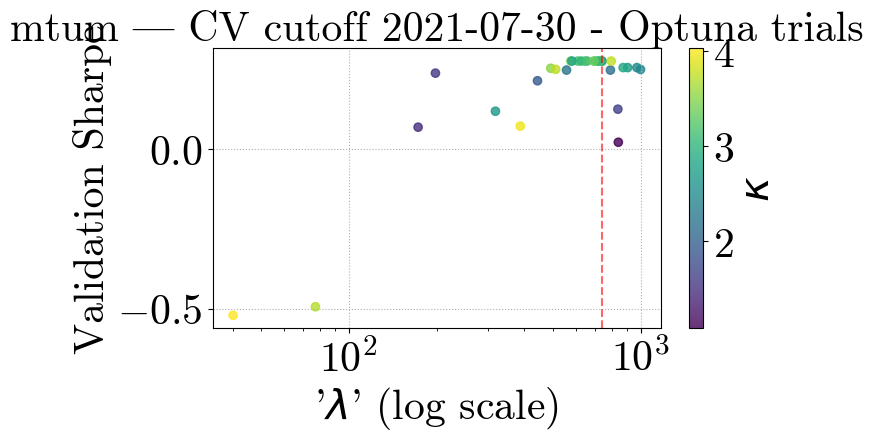

[I 2025-05-06 03:43:26,622] A new study created in memory with name: no-name-2db23ba0-dd04-482b-98e1-62d30209c060
[I 2025-05-06 03:43:34,291] Trial 0 finished with value: -0.10482483597867973 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10482483597867973.
[I 2025-05-06 03:43:40,626] Trial 1 finished with value: 0.4974332793219698 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.4974332793219698.
[I 2025-05-06 03:43:47,875] Trial 2 finished with value: -0.17198593522343328 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.4974332793219698.
[I 2025-05-06 03:44:00,293] Trial 3 finished with value: 0.2686288214010084 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.4974332793219698.
[I 2025-05-06 03:44:06,644] Trial 4 finished with value: 0.2667531769472619 and pa

Optuna best λ=748.1244, κ=1.0211760601328268, Sharpe=0.7206


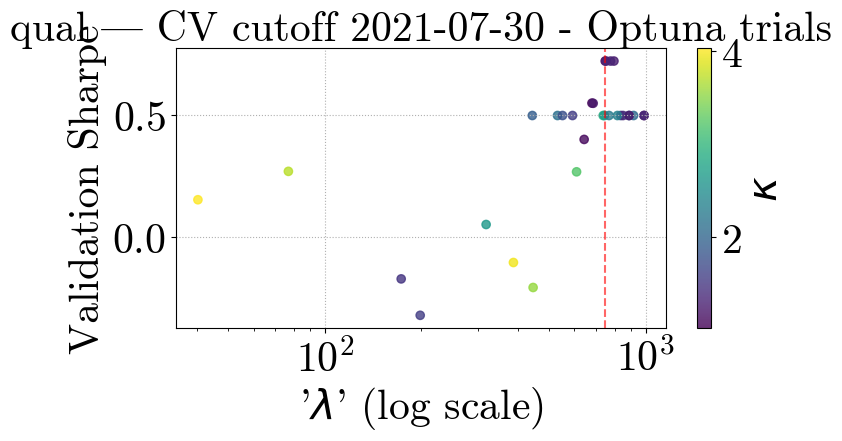

[I 2025-05-06 03:46:36,375] A new study created in memory with name: no-name-c5e36267-ac6b-4aef-a86c-3489e62fb919
[I 2025-05-06 03:46:43,007] Trial 0 finished with value: 0.4980852526736102 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4980852526736102.
[I 2025-05-06 03:46:47,421] Trial 1 finished with value: 0.4887519814040209 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4980852526736102.
[I 2025-05-06 03:46:57,320] Trial 2 finished with value: 0.2045292145373105 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4980852526736102.
[I 2025-05-06 03:47:10,040] Trial 3 finished with value: -0.4424174966894754 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4980852526736102.
[I 2025-05-06 03:47:15,920] Trial 4 finished with value: 0.541426220763501 and paramete

Optuna best λ=600.7803, κ=3.2506760653696363, Sharpe=0.5881


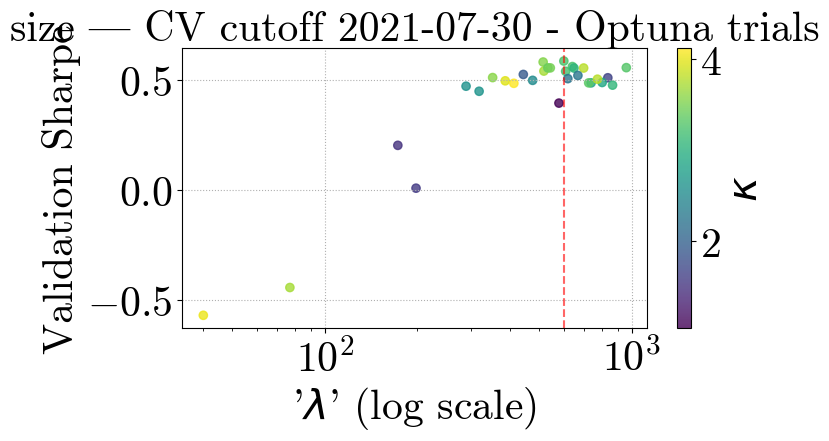

[I 2025-05-06 03:49:33,341] A new study created in memory with name: no-name-c04972f4-2cc7-4f82-8493-78fa6fb55ab1
[I 2025-05-06 03:49:40,124] Trial 0 finished with value: -1.473687429021295 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.473687429021295.
[I 2025-05-06 03:49:44,189] Trial 1 finished with value: -0.5534140613775173 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.5534140613775173.
[I 2025-05-06 03:49:49,836] Trial 2 finished with value: -1.0693358884426527 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.5534140613775173.
[I 2025-05-06 03:49:59,337] Trial 3 finished with value: -0.7185608987703421 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.5534140613775173.
[I 2025-05-06 03:50:03,885] Trial 4 finished with value: -0.9238890689270022 and p

Optuna best λ=822.7978, κ=2.077924366834204, Sharpe=0.3245


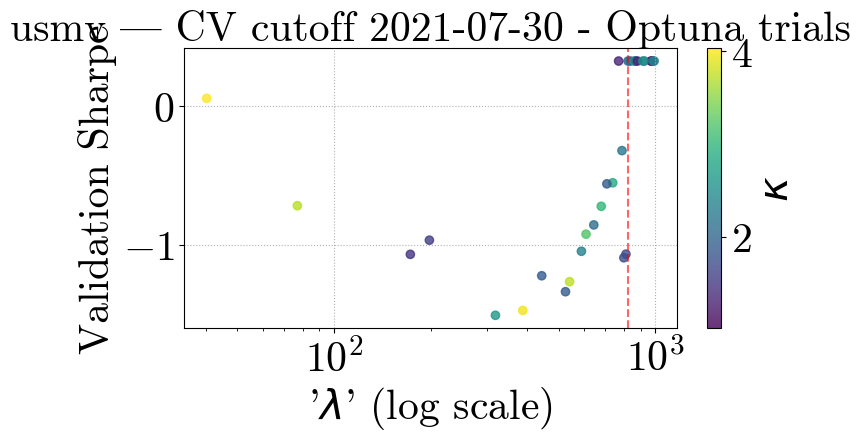

[I 2025-05-06 03:52:03,557] A new study created in memory with name: no-name-2d5a17c6-7c11-4dfd-8a63-127fcdad3a4f
[I 2025-05-06 03:52:11,819] Trial 0 finished with value: 0.0809218470478571 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.0809218470478571.
[I 2025-05-06 03:52:15,667] Trial 1 finished with value: -0.9052891327500242 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.0809218470478571.
[I 2025-05-06 03:52:26,733] Trial 2 finished with value: 0.10033662292227441 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.10033662292227441.
[I 2025-05-06 03:52:38,703] Trial 3 finished with value: -0.5254437037562459 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.10033662292227441.
[I 2025-05-06 03:52:43,219] Trial 4 finished with value: -0.7808524171857905 and pa

Optuna best λ=137.4059, κ=2.8775964286945435, Sharpe=0.3690


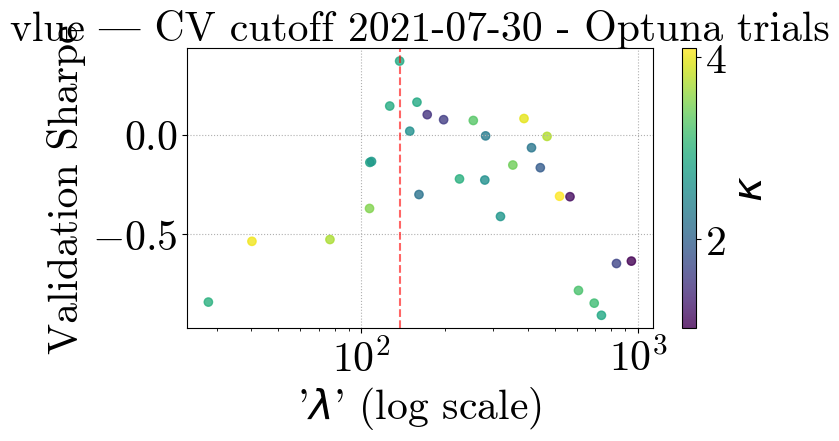

[I 2025-05-06 03:56:05,167] A new study created in memory with name: no-name-c49b9fb2-81a1-4b7f-b7c8-605d510e8756
[I 2025-05-06 03:56:10,488] Trial 0 finished with value: 0.5971129142166762 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5971129142166762.
[I 2025-05-06 03:56:15,151] Trial 1 finished with value: 0.5764364928369677 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5971129142166762.
[I 2025-05-06 03:56:21,917] Trial 2 finished with value: 0.5587758141088724 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5971129142166762.
[I 2025-05-06 03:56:30,919] Trial 3 finished with value: 0.10680779342539978 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5971129142166762.
[I 2025-05-06 03:56:36,452] Trial 4 finished with value: 0.5764364928369677 and paramet

Optuna best λ=574.2538, κ=2.268842850975212, Sharpe=0.6482


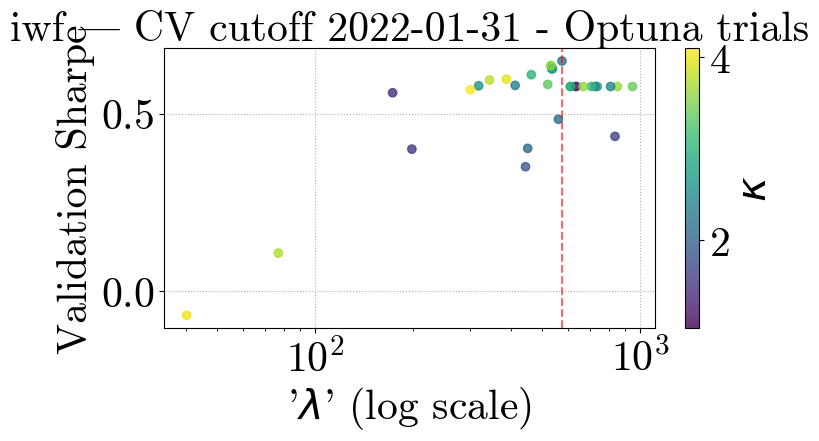

[I 2025-05-06 03:59:06,586] A new study created in memory with name: no-name-e4719035-0827-48ec-8602-3d46e96a067c
[I 2025-05-06 03:59:12,917] Trial 0 finished with value: -0.17991005174125976 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.17991005174125976.
[I 2025-05-06 03:59:17,131] Trial 1 finished with value: 0.09502870921621996 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.09502870921621996.
[I 2025-05-06 03:59:22,548] Trial 2 finished with value: -0.2554354627024017 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.09502870921621996.
[I 2025-05-06 03:59:35,999] Trial 3 finished with value: -0.2704167642188871 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.09502870921621996.
[I 2025-05-06 03:59:41,381] Trial 4 finished with value: 0.09502870921621996 a

Optuna best λ=727.5946, κ=1.0041336066094295, Sharpe=0.9987


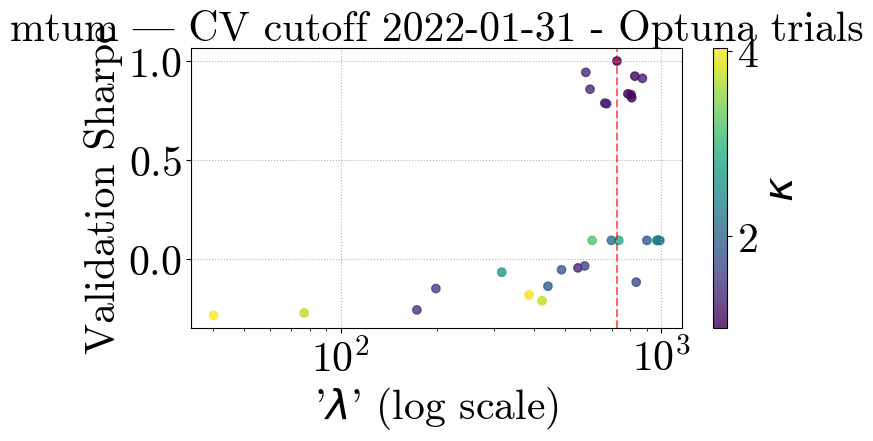

[I 2025-05-06 04:01:46,335] A new study created in memory with name: no-name-f67eb8fd-45a1-400c-8657-9821f6fc8821
[I 2025-05-06 04:01:54,931] Trial 0 finished with value: -0.29865529651723693 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.29865529651723693.
[I 2025-05-06 04:01:58,847] Trial 1 finished with value: 0.18907815133940437 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.18907815133940437.
[I 2025-05-06 04:02:07,051] Trial 2 finished with value: -0.49013134486647425 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.18907815133940437.
[I 2025-05-06 04:02:16,448] Trial 3 finished with value: 0.3646683774729185 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.3646683774729185.
[I 2025-05-06 04:02:22,535] Trial 4 finished with value: 0.18907815133940423 an

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.3647


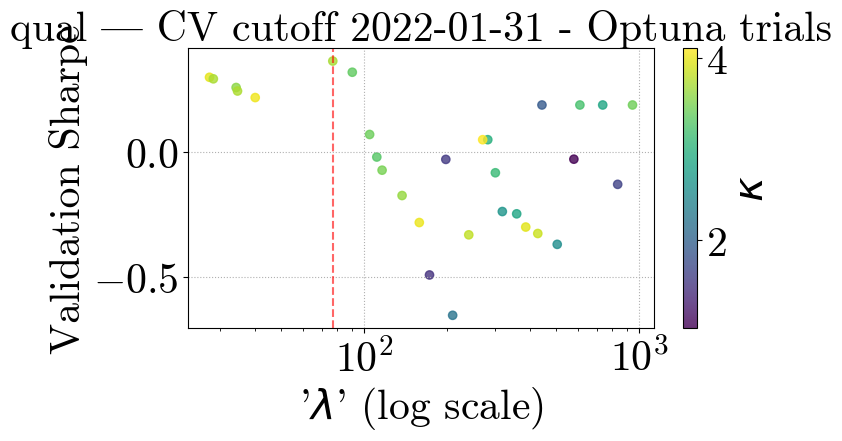

[I 2025-05-06 04:06:19,283] A new study created in memory with name: no-name-06b2d63c-822a-42de-88f6-8bd6b4118473
[I 2025-05-06 04:06:24,480] Trial 0 finished with value: 0.611452236078958 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.611452236078958.
[I 2025-05-06 04:06:28,882] Trial 1 finished with value: 0.6390105880258856 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6390105880258856.
[I 2025-05-06 04:06:35,280] Trial 2 finished with value: -0.033081769492844214 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6390105880258856.
[I 2025-05-06 04:06:46,228] Trial 3 finished with value: -0.2515478074838544 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6390105880258856.
[I 2025-05-06 04:06:52,349] Trial 4 finished with value: 0.6761799784273442 and parame

Optuna best λ=934.3147, κ=1.0589408618198615, Sharpe=0.6930


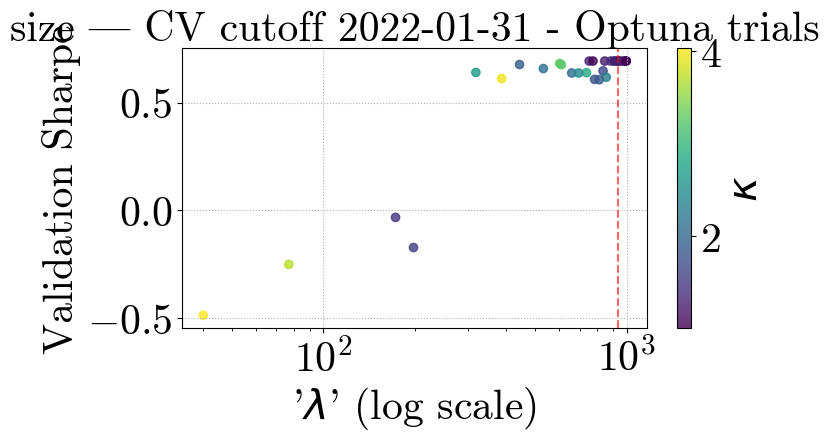

[I 2025-05-06 04:08:32,325] A new study created in memory with name: no-name-b6dbe569-d980-4a55-bdc8-8a593506ac43
[I 2025-05-06 04:08:37,192] Trial 0 finished with value: -1.1531825015841874 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -1.1531825015841874.
[I 2025-05-06 04:08:40,867] Trial 1 finished with value: -0.650329104496261 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.650329104496261.
[I 2025-05-06 04:08:49,276] Trial 2 finished with value: -1.0097696071761302 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.650329104496261.
[I 2025-05-06 04:09:05,795] Trial 3 finished with value: -0.8989800674792661 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.650329104496261.
[I 2025-05-06 04:09:10,215] Trial 4 finished with value: -0.8857108520357974 and par

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=-0.1048


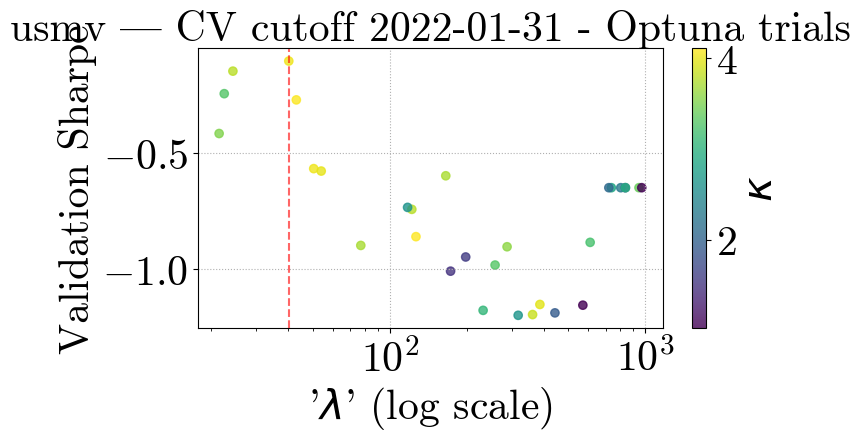

[I 2025-05-06 04:12:48,142] A new study created in memory with name: no-name-0a4b9d5d-28b4-4e34-a089-723b28699eb5
[I 2025-05-06 04:12:57,093] Trial 0 finished with value: 0.09660016224196796 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.09660016224196796.
[I 2025-05-06 04:13:02,495] Trial 1 finished with value: -0.1485999370630721 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.09660016224196796.
[I 2025-05-06 04:13:11,439] Trial 2 finished with value: 0.0202261072237515 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.09660016224196796.
[I 2025-05-06 04:13:20,944] Trial 3 finished with value: -0.2415020798577864 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.09660016224196796.
[I 2025-05-06 04:13:27,575] Trial 4 finished with value: -0.2048474666851817 and 

Optuna best λ=302.6155, κ=2.640561910157082, Sharpe=0.5362


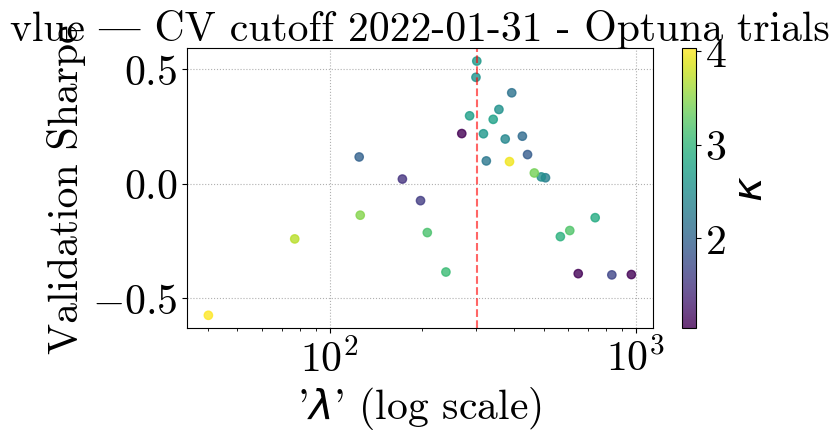

[I 2025-05-06 04:16:14,723] A new study created in memory with name: no-name-69f3c619-32b2-4761-8f18-76e6aea303af
[I 2025-05-06 04:16:20,076] Trial 0 finished with value: 0.09041588734000666 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.09041588734000666.
[I 2025-05-06 04:16:23,226] Trial 1 finished with value: 0.03561220808412219 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.09041588734000666.
[I 2025-05-06 04:16:31,375] Trial 2 finished with value: -0.056885154910242486 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.09041588734000666.
[I 2025-05-06 04:16:44,357] Trial 3 finished with value: -0.037677708832305784 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.09041588734000666.
[I 2025-05-06 04:16:47,537] Trial 4 finished with value: -0.0725645821744674

Optuna best λ=970.1464, κ=3.470555295160849, Sharpe=0.2830


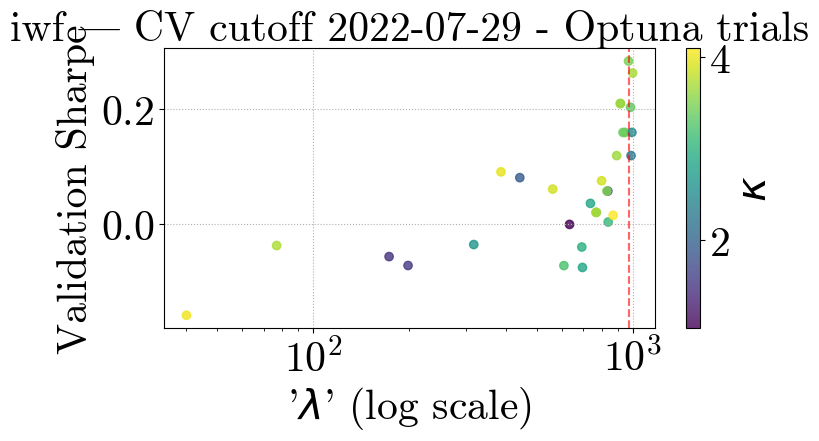

[I 2025-05-06 04:18:26,606] A new study created in memory with name: no-name-ef005863-f41f-402b-a81e-7001c0c21927
[I 2025-05-06 04:18:31,388] Trial 0 finished with value: -0.12223948341323322 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.12223948341323322.
[I 2025-05-06 04:18:35,755] Trial 1 finished with value: -0.12279687189142614 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.12223948341323322.
[I 2025-05-06 04:18:44,725] Trial 2 finished with value: -0.23854337008087134 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.12223948341323322.
[I 2025-05-06 04:19:03,339] Trial 3 finished with value: -0.42297198177606676 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.12223948341323322.
[I 2025-05-06 04:19:08,526] Trial 4 finished with value: -0.120984420333

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.1861


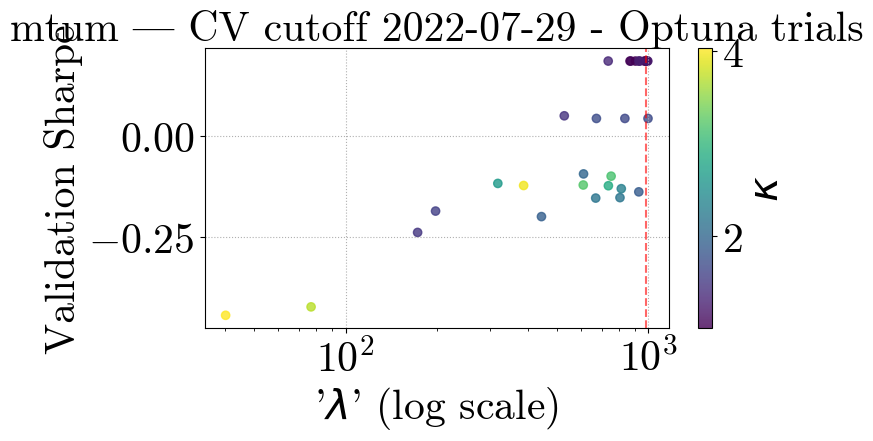

[I 2025-05-06 04:21:04,660] A new study created in memory with name: no-name-7eef6353-003a-4951-979d-6f1cfc6cb1ba
[I 2025-05-06 04:21:13,820] Trial 0 finished with value: -0.32763354527006644 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.32763354527006644.
[I 2025-05-06 04:21:18,150] Trial 1 finished with value: -0.2492499500455148 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.2492499500455148.
[I 2025-05-06 04:21:26,872] Trial 2 finished with value: -0.21946523539500967 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.21946523539500967.
[I 2025-05-06 04:21:39,319] Trial 3 finished with value: 0.11514601301816456 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.11514601301816456.
[I 2025-05-06 04:21:44,688] Trial 4 finished with value: -0.1164560788758934

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.1706


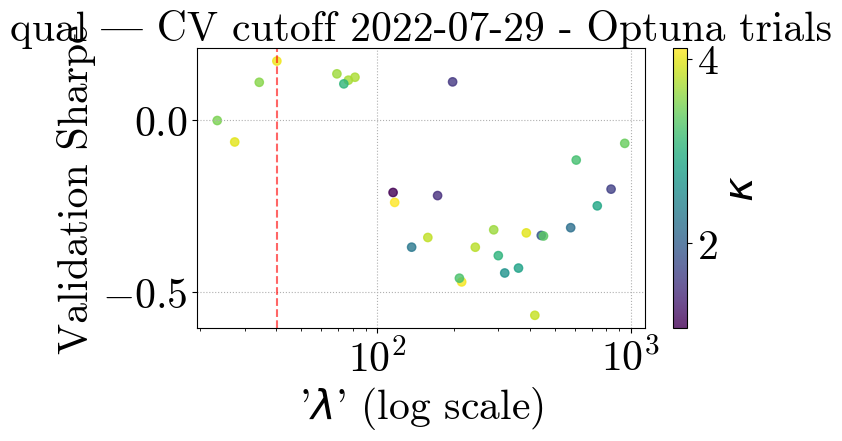

[I 2025-05-06 04:25:38,653] A new study created in memory with name: no-name-95790ce6-be39-4e27-bab6-ac12b84b435e
[I 2025-05-06 04:25:44,870] Trial 0 finished with value: 0.5845371551192098 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5845371551192098.
[I 2025-05-06 04:25:50,823] Trial 1 finished with value: 0.5940861339750582 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.5940861339750582.
[I 2025-05-06 04:25:59,752] Trial 2 finished with value: 0.29451845553933437 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.5940861339750582.
[I 2025-05-06 04:26:15,703] Trial 3 finished with value: 0.14678014472121903 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.5940861339750582.
[I 2025-05-06 04:26:21,540] Trial 4 finished with value: 0.5956447770207709 and parame

Optuna best λ=817.2711, κ=3.392580189667147, Sharpe=0.5961


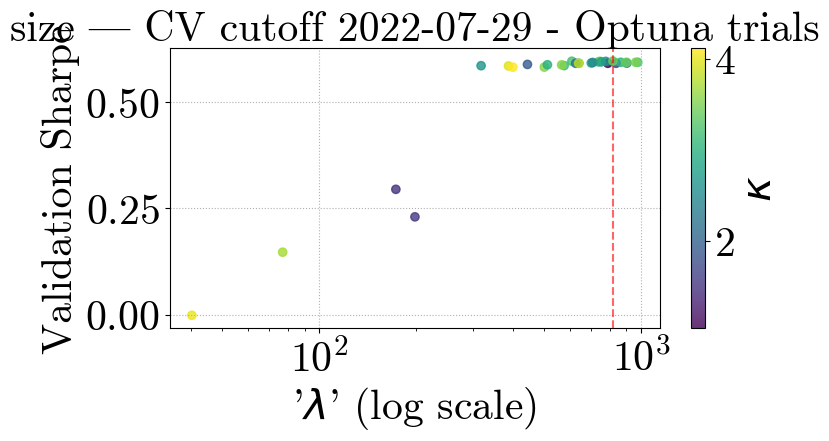

[I 2025-05-06 04:29:05,901] A new study created in memory with name: no-name-e61520ac-c4db-4088-8e06-3ef2bb76bc9b
[I 2025-05-06 04:29:10,102] Trial 0 finished with value: -0.7726316939932351 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7726316939932351.
[I 2025-05-06 04:29:14,067] Trial 1 finished with value: -0.7185350215922682 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.7185350215922682.
[I 2025-05-06 04:29:20,715] Trial 2 finished with value: -0.3626308325745257 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.3626308325745257.
[I 2025-05-06 04:29:31,532] Trial 3 finished with value: -0.2858740660774003 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: -0.2858740660774003.
[I 2025-05-06 04:29:35,637] Trial 4 finished with value: -0.900807251981963 and 

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.0272


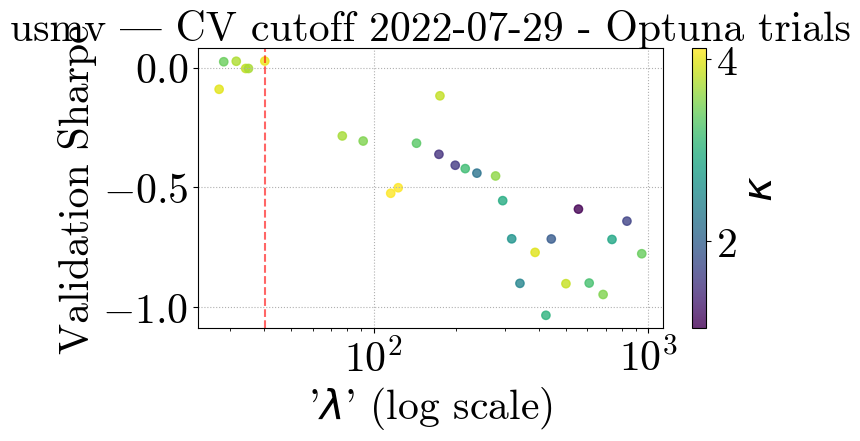

[I 2025-05-06 04:33:14,733] A new study created in memory with name: no-name-85cfcfc1-7e8c-4721-a7e3-9adcf9b2d967
[I 2025-05-06 04:33:21,496] Trial 0 finished with value: -0.2624328680804027 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2624328680804027.
[I 2025-05-06 04:33:26,800] Trial 1 finished with value: 0.13976744322257229 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.13976744322257229.
[I 2025-05-06 04:33:35,284] Trial 2 finished with value: -0.22555063780605558 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.13976744322257229.
[I 2025-05-06 04:33:45,580] Trial 3 finished with value: 0.1510592541568876 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1510592541568876.
[I 2025-05-06 04:33:51,152] Trial 4 finished with value: -0.03299359751489124 and

Optuna best λ=709.4665, κ=3.001315520322696, Sharpe=0.3259


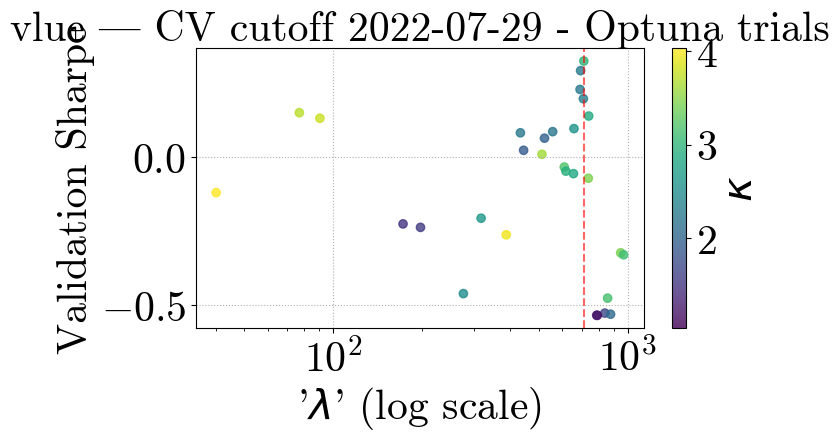

[I 2025-05-06 04:36:39,616] A new study created in memory with name: no-name-3ad8215a-e436-4983-bac5-8d8f01d42a5b
[I 2025-05-06 04:36:44,384] Trial 0 finished with value: -0.09795910495571171 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.09795910495571171.
[I 2025-05-06 04:36:46,846] Trial 1 finished with value: -0.2679822223484188 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.09795910495571171.
[I 2025-05-06 04:36:57,844] Trial 2 finished with value: -0.10753918291240555 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.09795910495571171.
[I 2025-05-06 04:37:10,712] Trial 3 finished with value: -0.18877834092031878 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.09795910495571171.
[I 2025-05-06 04:37:14,327] Trial 4 finished with value: -0.2005819120764

Optuna best λ=948.0226, κ=1.392115193311568, Sharpe=0.1084


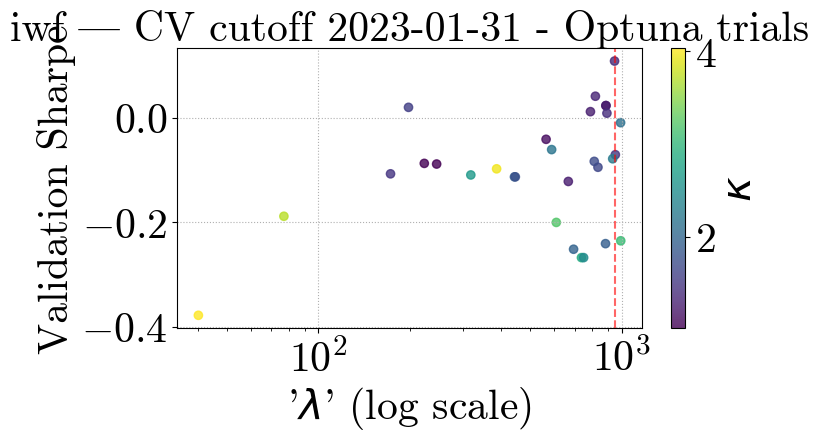

[I 2025-05-06 04:38:56,470] A new study created in memory with name: no-name-e3ba7d47-f1d8-4698-a316-ba4af923a06e
[I 2025-05-06 04:39:07,378] Trial 0 finished with value: -0.14290732294759967 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.14290732294759967.
[I 2025-05-06 04:39:15,149] Trial 1 finished with value: -0.21998456194262728 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.14290732294759967.
[I 2025-05-06 04:39:24,045] Trial 2 finished with value: -0.5711176547968242 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.14290732294759967.
[I 2025-05-06 04:39:39,610] Trial 3 finished with value: -0.6416670496468412 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.14290732294759967.
[I 2025-05-06 04:39:47,897] Trial 4 finished with value: -0.15614206790116

Optuna best λ=978.4362, κ=1.018729835827171, Sharpe=0.6421


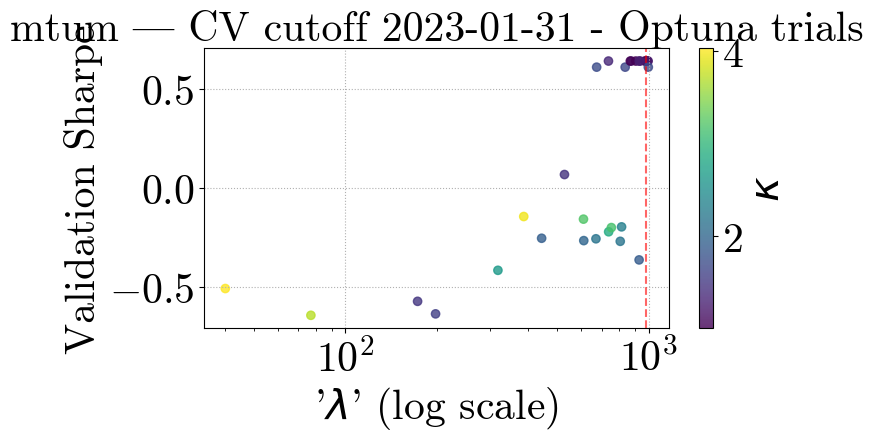

[I 2025-05-06 04:42:06,363] A new study created in memory with name: no-name-9a4fc34e-5aa6-418b-b98c-e9fbe481a7ba
[I 2025-05-06 04:42:15,379] Trial 0 finished with value: -0.10386500105686877 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10386500105686877.
[I 2025-05-06 04:42:26,061] Trial 1 finished with value: -0.10386500105686877 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.10386500105686877.
[I 2025-05-06 04:42:51,181] Trial 2 finished with value: 0.2517577931626941 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.2517577931626941.
[I 2025-05-06 04:43:05,430] Trial 3 finished with value: 0.15264050899913578 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.2517577931626941.
[I 2025-05-06 04:43:14,257] Trial 4 finished with value: -0.10386500105686877 a

Optuna best λ=23.7554, κ=1.2411073883144055, Sharpe=0.3140


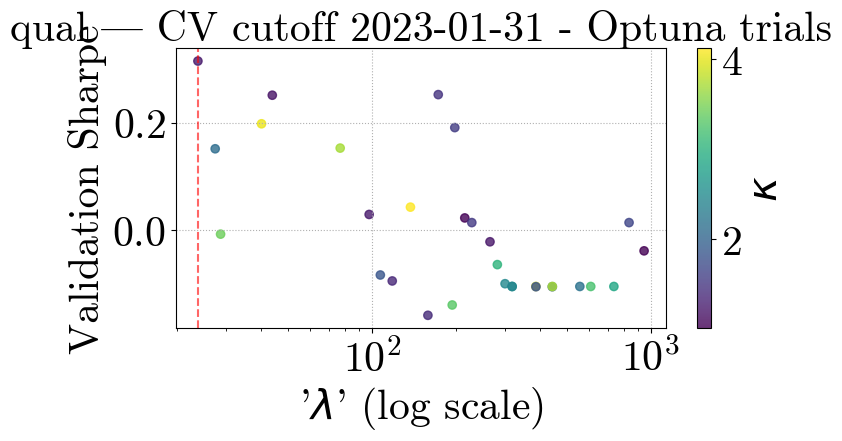

[I 2025-05-06 04:47:08,745] A new study created in memory with name: no-name-85796d57-6adf-422e-85fc-19a337a8a5a3
[I 2025-05-06 04:47:15,145] Trial 0 finished with value: 0.38942851240026255 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.38942851240026255.
[I 2025-05-06 04:47:20,091] Trial 1 finished with value: 0.3858376646257267 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.38942851240026255.
[I 2025-05-06 04:47:28,306] Trial 2 finished with value: 0.11811821207136637 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.38942851240026255.
[I 2025-05-06 04:47:40,278] Trial 3 finished with value: 0.09682033772400529 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.38942851240026255.
[I 2025-05-06 04:47:45,706] Trial 4 finished with value: 0.3850032877618947 and p

Optuna best λ=969.0185, κ=1.9225907453927633, Sharpe=0.4073


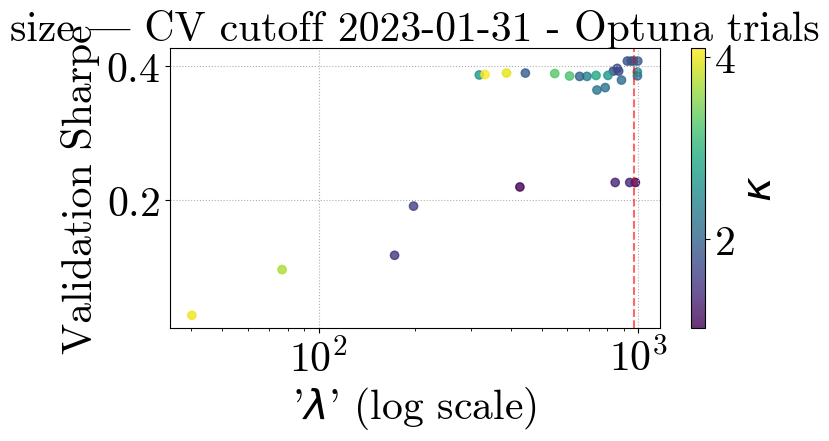

[I 2025-05-06 04:50:10,473] A new study created in memory with name: no-name-7497e701-382a-47df-a63c-d86491887254
[I 2025-05-06 04:50:15,606] Trial 0 finished with value: -0.2362879793228405 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2362879793228405.
[I 2025-05-06 04:50:19,343] Trial 1 finished with value: -0.6385796512279868 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2362879793228405.
[I 2025-05-06 04:50:27,174] Trial 2 finished with value: -0.4686829862943152 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.2362879793228405.
[I 2025-05-06 04:50:38,289] Trial 3 finished with value: -0.36286869864220944 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.2362879793228405.
[I 2025-05-06 04:50:41,756] Trial 4 finished with value: -0.6049727871852238 an

Optuna best λ=28.3342, κ=3.1772915080384827, Sharpe=-0.0194


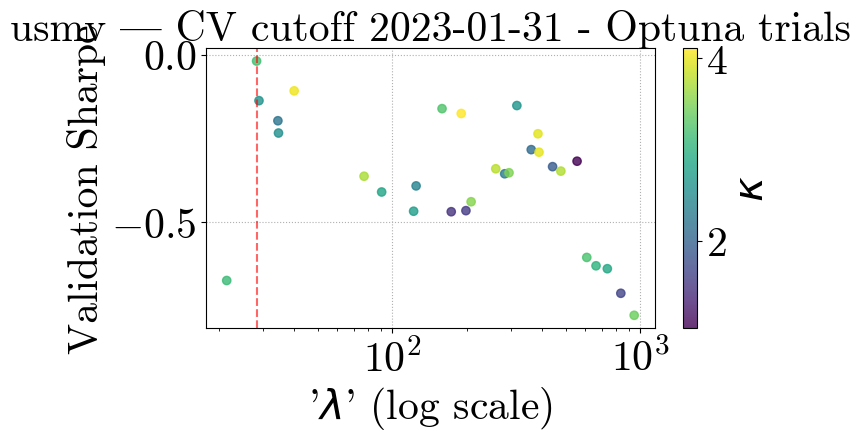

[I 2025-05-06 04:54:07,240] A new study created in memory with name: no-name-e8cf7f17-3e3b-4a31-a36e-67d2ad58fb2f
[I 2025-05-06 04:54:18,953] Trial 0 finished with value: 0.573076676822883 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.573076676822883.
[I 2025-05-06 04:54:24,791] Trial 1 finished with value: -0.03652046420861021 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.573076676822883.
[I 2025-05-06 04:54:32,237] Trial 2 finished with value: 0.01133410995768732 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.573076676822883.
[I 2025-05-06 04:54:42,271] Trial 3 finished with value: 0.18560293502494596 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.573076676822883.
[I 2025-05-06 04:54:49,041] Trial 4 finished with value: -0.050636939182431194 and parame

Optuna best λ=362.7862, κ=3.1137742847580365, Sharpe=0.7864


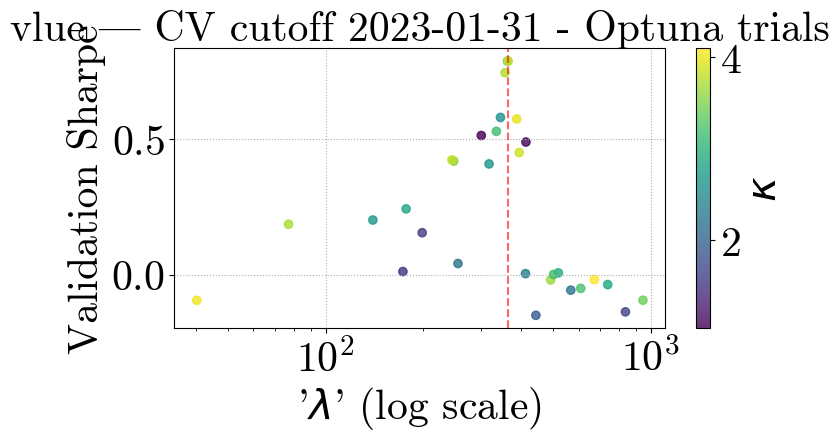

[I 2025-05-06 04:58:27,567] A new study created in memory with name: no-name-64ff170e-e7ed-4469-bd6d-49c78b876ce3
[I 2025-05-06 04:58:33,201] Trial 0 finished with value: -0.06393160002072376 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.06393160002072376.
[I 2025-05-06 04:58:39,918] Trial 1 finished with value: -0.06852407922898915 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.06393160002072376.
[I 2025-05-06 04:58:44,739] Trial 2 finished with value: -0.30027415909433985 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.06393160002072376.
[I 2025-05-06 04:59:03,107] Trial 3 finished with value: -0.11799621182728669 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: -0.06393160002072376.
[I 2025-05-06 04:59:09,724] Trial 4 finished with value: -0.106787132372

Optuna best λ=666.7470, κ=2.4258331254949925, Sharpe=-0.0410


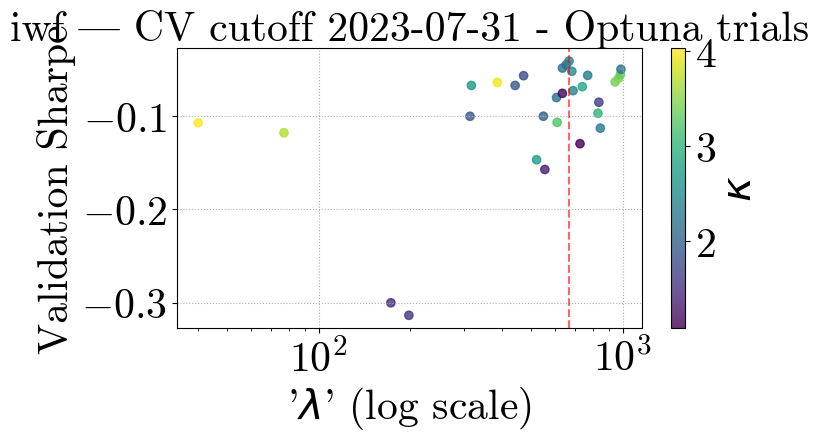

[I 2025-05-06 05:02:02,603] A new study created in memory with name: no-name-202adfff-d5d3-4a59-b977-969ae357376d
[I 2025-05-06 05:02:06,466] Trial 0 finished with value: -0.7232148311334249 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7232148311334249.
[I 2025-05-06 05:02:09,349] Trial 1 finished with value: -0.057571022721100845 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.057571022721100845.
[I 2025-05-06 05:02:16,020] Trial 2 finished with value: -0.7073429652178392 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.057571022721100845.
[I 2025-05-06 05:02:44,984] Trial 3 finished with value: -0.8975168321087778 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.057571022721100845.
[I 2025-05-06 05:02:48,004] Trial 4 finished with value: -0.091254864599

Optuna best λ=886.5855, κ=1.0823503127445395, Sharpe=0.6284


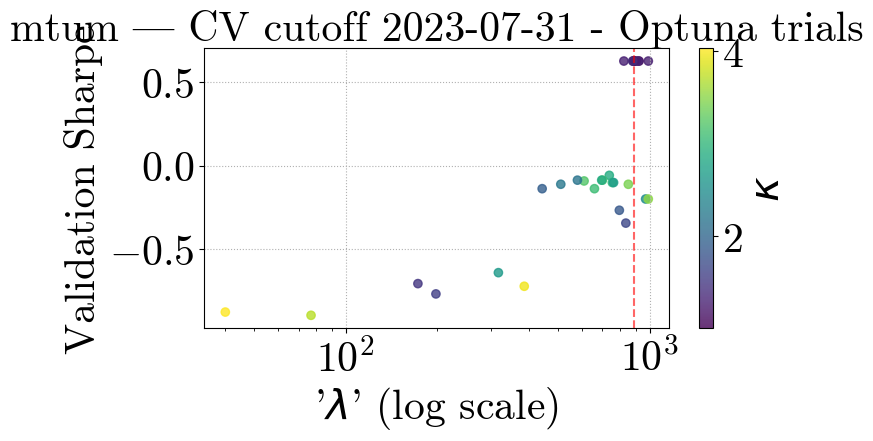

[I 2025-05-06 05:04:38,116] A new study created in memory with name: no-name-5772be94-ac26-4941-8583-abbeb6c93dfa
[I 2025-05-06 05:04:51,966] Trial 0 finished with value: 0.3562941882590458 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3562941882590458.
[I 2025-05-06 05:04:59,902] Trial 1 finished with value: 0.35629418825904574 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3562941882590458.
[I 2025-05-06 05:05:08,814] Trial 2 finished with value: 0.33876208514516637 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3562941882590458.
[I 2025-05-06 05:05:26,767] Trial 3 finished with value: 0.06838367203857057 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3562941882590458.
[I 2025-05-06 05:05:34,865] Trial 4 finished with value: 0.35629418825904574 and para

Optuna best λ=198.1885, κ=1.5727916564869089, Sharpe=0.4145


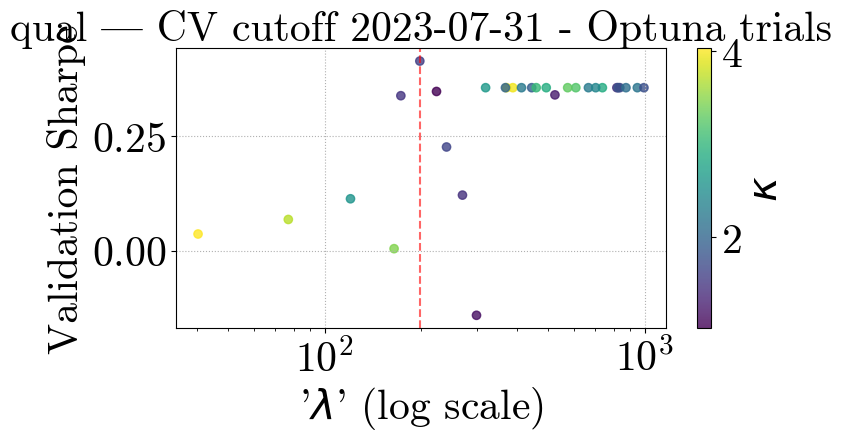

[I 2025-05-06 05:09:20,612] A new study created in memory with name: no-name-5870d0a2-400d-41ec-aaed-71b83325ad68
[I 2025-05-06 05:09:31,413] Trial 0 finished with value: 0.340535363550713 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.340535363550713.
[I 2025-05-06 05:09:35,081] Trial 1 finished with value: 0.3688687690255205 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.3688687690255205.
[I 2025-05-06 05:09:44,248] Trial 2 finished with value: 0.35900666827148275 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.3688687690255205.
[I 2025-05-06 05:09:54,317] Trial 3 finished with value: 0.1003484820645176 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.3688687690255205.
[I 2025-05-06 05:09:58,233] Trial 4 finished with value: 0.3688687690255205 and parameter

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.3689


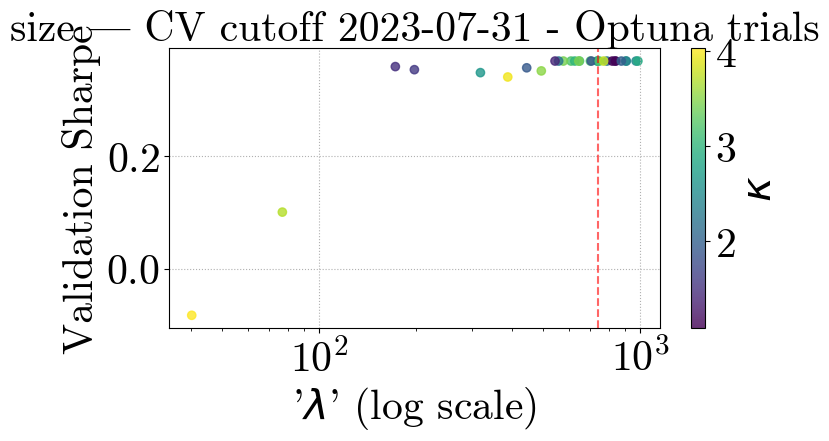

[I 2025-05-06 05:12:24,931] A new study created in memory with name: no-name-3853d5ce-d9eb-4d27-a5f2-c5aa866f30d8
[I 2025-05-06 05:12:31,093] Trial 0 finished with value: -0.0074111746027815326 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.0074111746027815326.
[I 2025-05-06 05:12:34,815] Trial 1 finished with value: -0.03984793419105226 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.0074111746027815326.
[I 2025-05-06 05:12:44,115] Trial 2 finished with value: -0.8868976241937215 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.0074111746027815326.
[I 2025-05-06 05:12:53,948] Trial 3 finished with value: 0.40246893956083635 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.40246893956083635.
[I 2025-05-06 05:12:58,427] Trial 4 finished with value: 0.18757505

Optuna best λ=137.4059, κ=3.688564088320328, Sharpe=0.6677


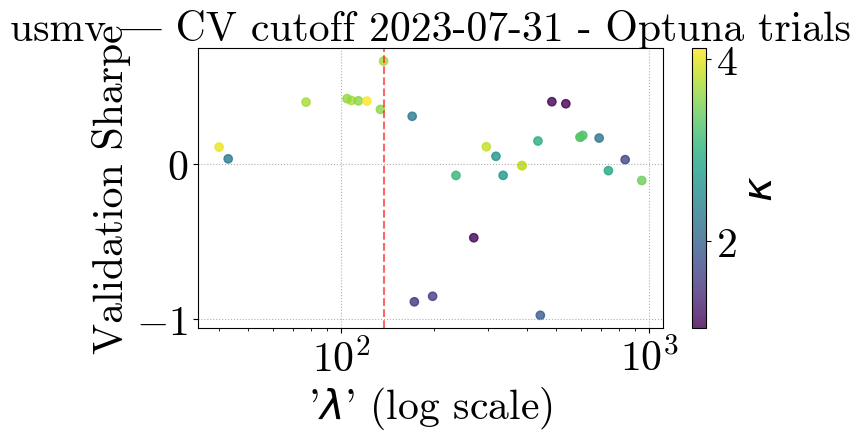

[I 2025-05-06 05:16:35,063] A new study created in memory with name: no-name-5ba8c3b2-9ac1-49ea-a55f-440cacd7d6ff
[I 2025-05-06 05:16:41,992] Trial 0 finished with value: -0.10647912757789034 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10647912757789034.
[I 2025-05-06 05:16:45,110] Trial 1 finished with value: -0.4908472638821727 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.10647912757789034.
[I 2025-05-06 05:16:56,413] Trial 2 finished with value: 0.12683735468641855 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.12683735468641855.
[I 2025-05-06 05:17:14,897] Trial 3 finished with value: 0.5227091507769904 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.5227091507769904.
[I 2025-05-06 05:17:18,259] Trial 4 finished with value: -0.8406429575827485 an

Optuna best λ=76.9219, κ=3.705159593645523, Sharpe=0.5227


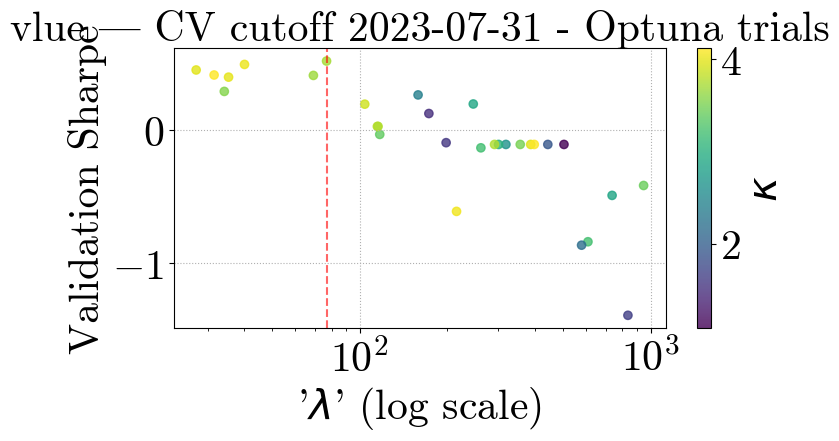

[I 2025-05-06 05:21:38,283] A new study created in memory with name: no-name-8b83040a-4542-4ce5-800f-8b719a2079b8
[I 2025-05-06 05:21:45,822] Trial 0 finished with value: -0.2534839343606315 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2534839343606315.
[I 2025-05-06 05:21:50,573] Trial 1 finished with value: -0.31248822039702645 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2534839343606315.
[I 2025-05-06 05:21:55,723] Trial 2 finished with value: -0.3676625973963806 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.2534839343606315.
[I 2025-05-06 05:22:08,808] Trial 3 finished with value: 0.1785344737919952 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.1785344737919952.
[I 2025-05-06 05:22:14,006] Trial 4 finished with value: -0.2746992464116336 and 

Optuna best λ=80.6479, κ=3.979848793475017, Sharpe=0.1787


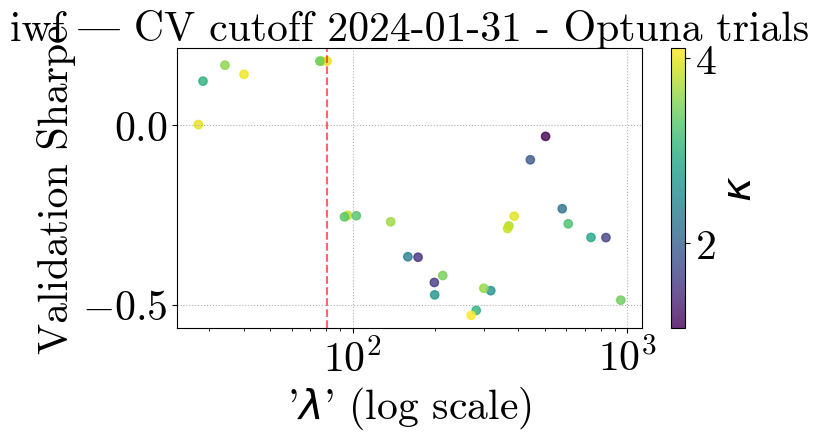

[I 2025-05-06 05:26:13,888] A new study created in memory with name: no-name-f9c57a1b-e7a9-463a-ac8a-344335bbe4f9
[I 2025-05-06 05:26:18,970] Trial 0 finished with value: -0.4852797159966473 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4852797159966473.
[I 2025-05-06 05:26:23,656] Trial 1 finished with value: -0.4737816531456846 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.4737816531456846.
[I 2025-05-06 05:26:29,604] Trial 2 finished with value: -0.32316993021609863 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.32316993021609863.
[I 2025-05-06 05:26:46,177] Trial 3 finished with value: -1.4096041975073292 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.32316993021609863.
[I 2025-05-06 05:26:51,972] Trial 4 finished with value: -0.47449756963506146

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=-0.2577


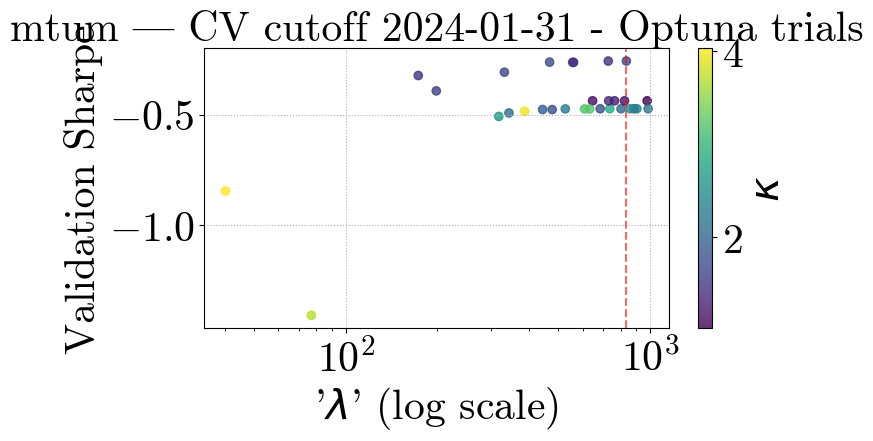

[I 2025-05-06 05:28:59,474] A new study created in memory with name: no-name-5a3c2f06-25e7-4ebf-87bb-5193a0ed3260
[I 2025-05-06 05:29:03,568] Trial 0 finished with value: -0.2706529977007041 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.2706529977007041.
[I 2025-05-06 05:29:07,990] Trial 1 finished with value: -0.2706529977007041 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.2706529977007041.
[I 2025-05-06 05:29:14,534] Trial 2 finished with value: 0.871425057156644 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.871425057156644.
[I 2025-05-06 05:29:27,151] Trial 3 finished with value: -0.24225748381338413 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.871425057156644.
[I 2025-05-06 05:29:31,269] Trial 4 finished with value: -0.2706529977007041 and para

Optuna best λ=172.8983, κ=1.487187364027523, Sharpe=0.8714


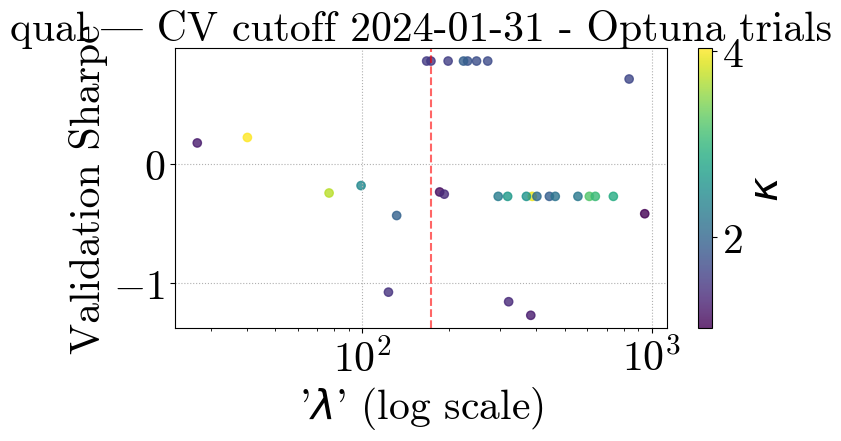

[I 2025-05-06 05:32:35,032] A new study created in memory with name: no-name-e991f3a4-93bd-4c50-91c3-fac0407bdf4e
[I 2025-05-06 05:32:39,650] Trial 0 finished with value: 0.3948203239398672 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3948203239398672.
[I 2025-05-06 05:32:40,514] Trial 1 finished with value: 0.42257479336218917 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.42257479336218917.
[I 2025-05-06 05:32:50,903] Trial 2 finished with value: 0.1658196255723174 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.42257479336218917.
[I 2025-05-06 05:33:01,283] Trial 3 finished with value: 0.0998273795620796 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.42257479336218917.
[I 2025-05-06 05:33:05,985] Trial 4 finished with value: 0.42257479336218917 and par

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=0.4226


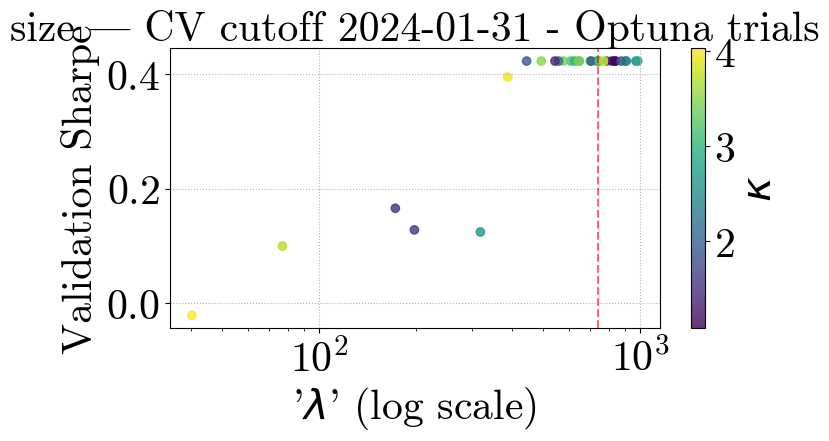

[I 2025-05-06 05:34:16,119] A new study created in memory with name: no-name-fd6a4334-8757-452e-b5f2-903b115d1459
[I 2025-05-06 05:34:22,366] Trial 0 finished with value: -0.6581000276641564 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.6581000276641564.
[I 2025-05-06 05:34:23,198] Trial 1 finished with value: -0.0346299411267019 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.0346299411267019.
[I 2025-05-06 05:34:32,283] Trial 2 finished with value: -0.4846370450659352 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.0346299411267019.
[I 2025-05-06 05:34:47,448] Trial 3 finished with value: -0.04451723610650069 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.0346299411267019.
[I 2025-05-06 05:34:53,665] Trial 4 finished with value: -0.25740777552061167 a

Optuna best λ=737.3541, κ=2.869673679819506, Sharpe=-0.0346


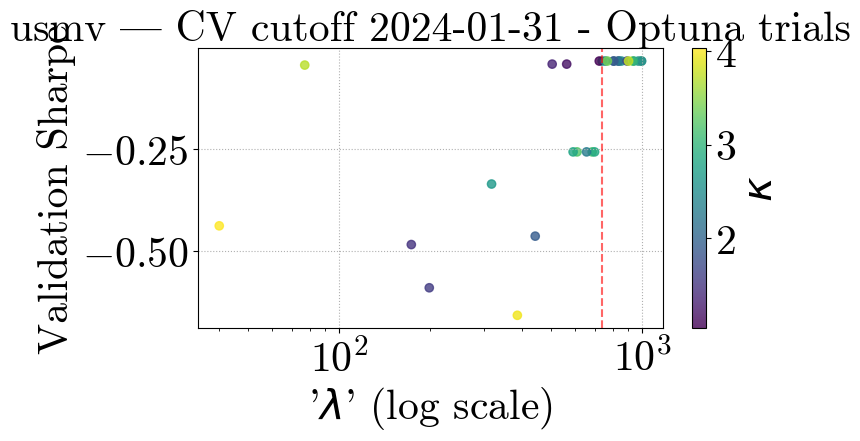

[I 2025-05-06 05:36:07,699] A new study created in memory with name: no-name-49d74666-0c40-4bb4-9098-b95b389477b4
[I 2025-05-06 05:36:15,617] Trial 0 finished with value: 0.15883043970578567 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.15883043970578567.
[I 2025-05-06 05:36:21,082] Trial 1 finished with value: 0.3318683334404875 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.3318683334404875.
[I 2025-05-06 05:36:31,385] Trial 2 finished with value: 0.15883043970578567 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.3318683334404875.
[I 2025-05-06 05:36:48,214] Trial 3 finished with value: 0.3361969699736203 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.3361969699736203.
[I 2025-05-06 05:36:52,815] Trial 4 finished with value: 0.3318683334404875 and param

Optuna best λ=54.1609, κ=4.11127017016935, Sharpe=0.6616


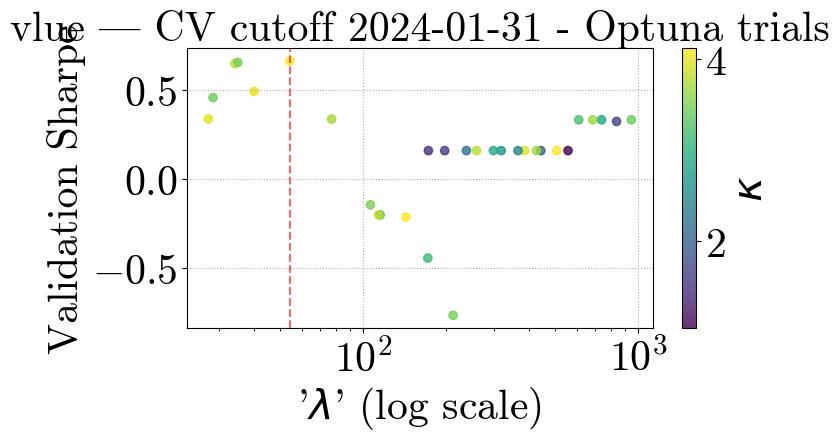

[I 2025-05-06 05:41:39,376] A new study created in memory with name: no-name-a2f61b02-d560-46e9-8231-25115627b7ce
[I 2025-05-06 05:41:43,766] Trial 0 finished with value: -0.024834989914253935 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.024834989914253935.
[I 2025-05-06 05:41:48,311] Trial 1 finished with value: 0.01466563555641056 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.01466563555641056.
[I 2025-05-06 05:41:54,816] Trial 2 finished with value: 0.19515330944486492 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.19515330944486492.
[I 2025-05-06 05:42:05,650] Trial 3 finished with value: 0.06290296836948088 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.19515330944486492.
[I 2025-05-06 05:42:09,294] Trial 4 finished with value: 0.00320513379411923

Optuna best λ=882.9144, κ=1.2867137722414546, Sharpe=0.2712


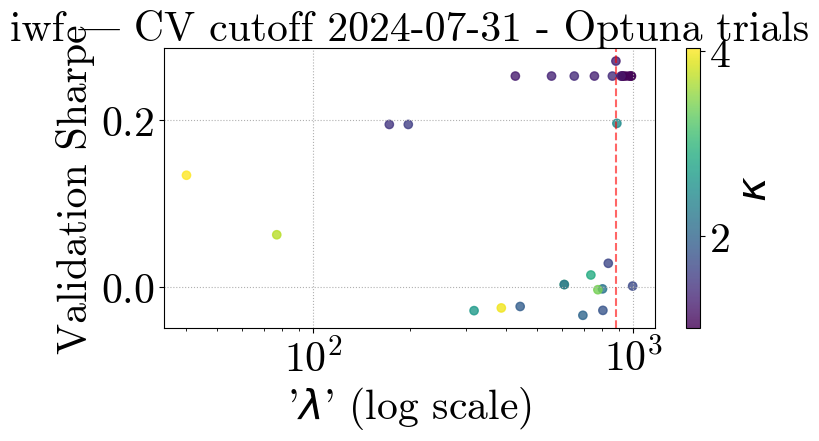

[I 2025-05-06 05:43:56,483] A new study created in memory with name: no-name-aedb116b-f750-4c48-8306-d623bbd95709
[I 2025-05-06 05:44:02,313] Trial 0 finished with value: 0.2028927135209371 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.2028927135209371.
[I 2025-05-06 05:44:07,099] Trial 1 finished with value: 0.37604506407860777 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.37604506407860777.
[I 2025-05-06 05:44:13,861] Trial 2 finished with value: 0.14675258060754534 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.37604506407860777.
[I 2025-05-06 05:44:24,365] Trial 3 finished with value: -0.21083025012983994 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.37604506407860777.
[I 2025-05-06 05:44:30,093] Trial 4 finished with value: 0.328039828998609 and pa

Optuna best λ=711.7297, κ=2.2256718351156524, Sharpe=0.5387


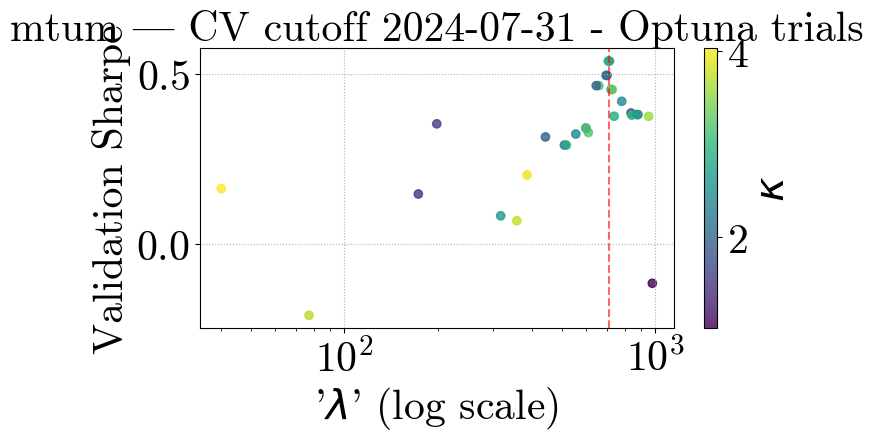

[I 2025-05-06 05:46:53,080] A new study created in memory with name: no-name-39720271-27fa-4f06-8e61-518fe089fe98
[I 2025-05-06 05:46:57,044] Trial 0 finished with value: -0.4385320414504024 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.4385320414504024.
[I 2025-05-06 05:47:01,864] Trial 1 finished with value: -0.19073770755762443 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.19073770755762443.
[I 2025-05-06 05:47:06,495] Trial 2 finished with value: 0.07358988421038583 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.07358988421038583.
[I 2025-05-06 05:47:20,361] Trial 3 finished with value: 0.13740710378451546 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.13740710378451546.
[I 2025-05-06 05:47:24,448] Trial 4 finished with value: -0.4060470280196337 a

Optuna best λ=902.0568, κ=2.989933208495346, Sharpe=0.5504


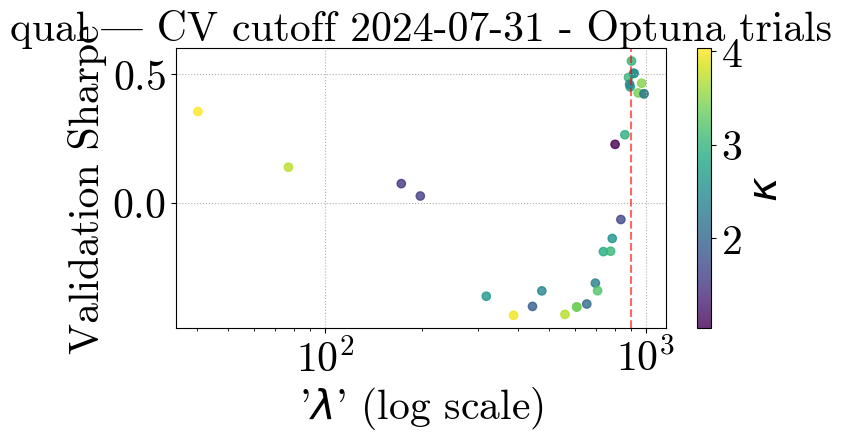

[I 2025-05-06 05:49:10,057] A new study created in memory with name: no-name-c8bedf22-ca41-4ce0-9d7a-618e33725224
[I 2025-05-06 05:49:18,114] Trial 0 finished with value: 0.49648744463829836 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.49648744463829836.
[I 2025-05-06 05:49:19,621] Trial 1 finished with value: 0.49648744463829836 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.49648744463829836.
[I 2025-05-06 05:49:30,263] Trial 2 finished with value: 0.4735870245358357 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.49648744463829836.
[I 2025-05-06 05:49:40,147] Trial 3 finished with value: 0.36535722512520674 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.49648744463829836.
[I 2025-05-06 05:49:41,425] Trial 4 finished with value: 0.49648744463829836 and 

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.4965


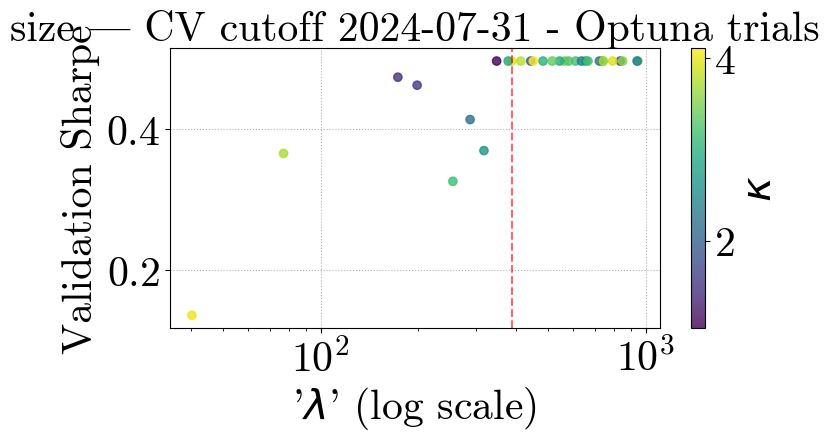

[I 2025-05-06 05:51:17,772] A new study created in memory with name: no-name-c85b1fda-b7e5-425d-8652-d09b7245794c
[I 2025-05-06 05:51:25,647] Trial 0 finished with value: -0.7841920901499514 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.7841920901499514.
[I 2025-05-06 05:51:30,429] Trial 1 finished with value: -1.1433632699241236 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.7841920901499514.
[I 2025-05-06 05:51:36,040] Trial 2 finished with value: -0.699400657644425 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.699400657644425.
[I 2025-05-06 05:51:51,789] Trial 3 finished with value: 0.10424997046019076 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.10424997046019076.
[I 2025-05-06 05:51:57,145] Trial 4 finished with value: -0.7376035943664807 and p

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.1462


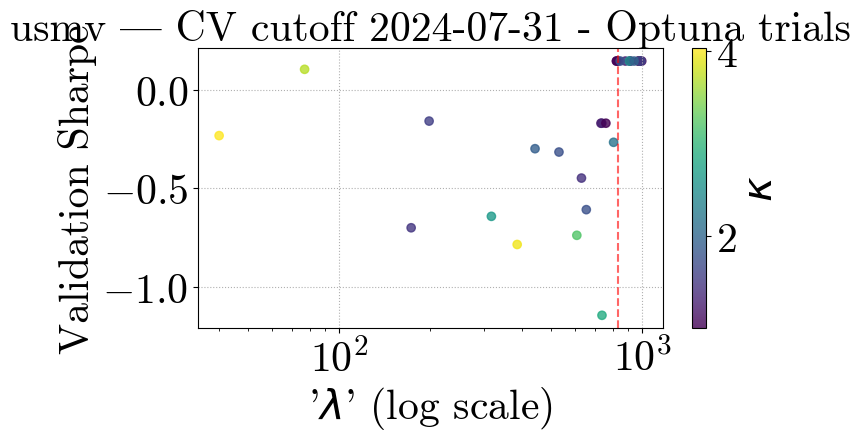

[I 2025-05-06 05:53:11,880] A new study created in memory with name: no-name-21ea1b1d-7d42-497c-bf2c-757007d025af
[I 2025-05-06 05:53:23,761] Trial 0 finished with value: 0.3620333462095204 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.3620333462095204.
[I 2025-05-06 05:53:28,823] Trial 1 finished with value: 0.3620333462095204 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.3620333462095204.
[I 2025-05-06 05:53:40,860] Trial 2 finished with value: 0.3620333462095204 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.3620333462095204.
[I 2025-05-06 05:53:53,727] Trial 3 finished with value: 0.11703982167002985 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.3620333462095204.
[I 2025-05-06 05:53:59,173] Trial 4 finished with value: 0.3620333462095204 and paramet

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.4923


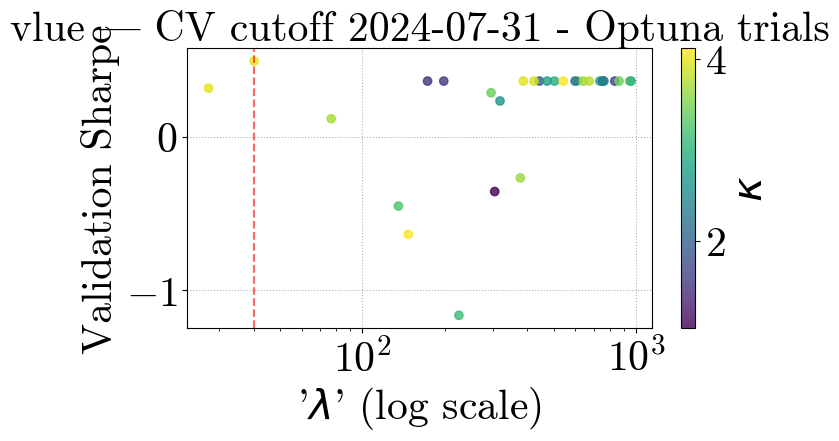

[I 2025-05-06 05:57:27,488] A new study created in memory with name: no-name-5b0ce3fa-1ae7-4839-8016-948e8deacf34
[I 2025-05-06 05:57:31,321] Trial 0 finished with value: 0.5947670172166197 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5947670172166197.
[I 2025-05-06 05:57:34,206] Trial 1 finished with value: 0.5881404460986535 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5947670172166197.
[I 2025-05-06 05:57:44,841] Trial 2 finished with value: 0.06360770817137171 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5947670172166197.
[I 2025-05-06 05:57:55,424] Trial 3 finished with value: 0.5081650042360292 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5947670172166197.
[I 2025-05-06 05:57:59,102] Trial 4 finished with value: 0.6088297150322457 and paramet

Optuna best λ=970.1464, κ=2.413930459242347, Sharpe=0.6393


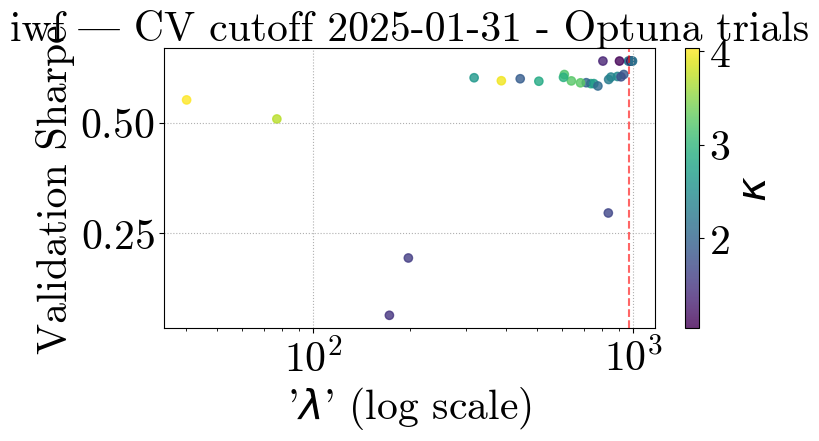

[I 2025-05-06 06:00:05,425] A new study created in memory with name: no-name-c6182bdf-a27f-4ce7-888f-14afb97d4a32
[I 2025-05-06 06:00:10,936] Trial 0 finished with value: -0.1845461803422327 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1845461803422327.
[I 2025-05-06 06:00:17,790] Trial 1 finished with value: -0.0753445214975257 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: -0.0753445214975257.
[I 2025-05-06 06:00:25,905] Trial 2 finished with value: -0.8259690372980991 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: -0.0753445214975257.
[I 2025-05-06 06:00:38,669] Trial 3 finished with value: -0.3395454607505138 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: -0.0753445214975257.
[I 2025-05-06 06:00:43,335] Trial 4 finished with value: -0.02519245246920451 an

Optuna best λ=324.5298, κ=1.4194367062964883, Sharpe=0.6017


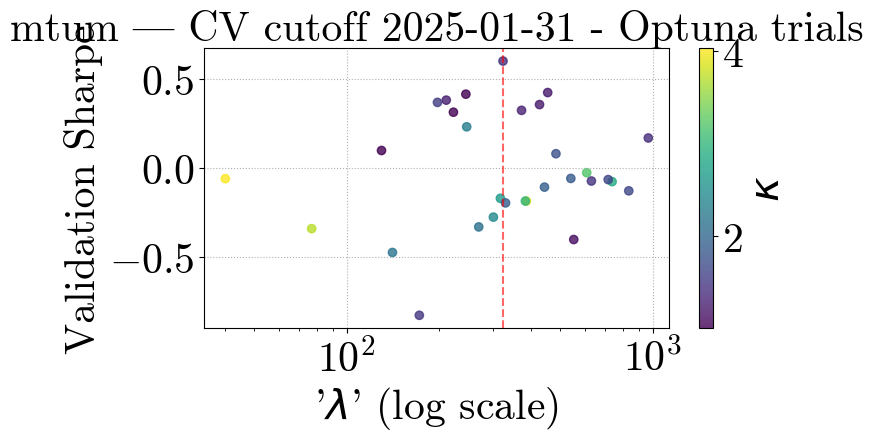

[I 2025-05-06 06:03:59,888] A new study created in memory with name: no-name-08927057-021f-4f3b-9a73-e22964b4a926
[I 2025-05-06 06:04:04,204] Trial 0 finished with value: -0.10864676477982241 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.10864676477982241.
[I 2025-05-06 06:04:08,483] Trial 1 finished with value: 0.48938139428209715 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.48938139428209715.
[I 2025-05-06 06:04:13,418] Trial 2 finished with value: -0.2775266047167879 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.48938139428209715.
[I 2025-05-06 06:04:29,736] Trial 3 finished with value: 0.13455289368268863 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.48938139428209715.
[I 2025-05-06 06:04:33,489] Trial 4 finished with value: -0.14386489309770495 

Optuna best λ=839.2048, κ=1.8130677088965907, Sharpe=0.7738


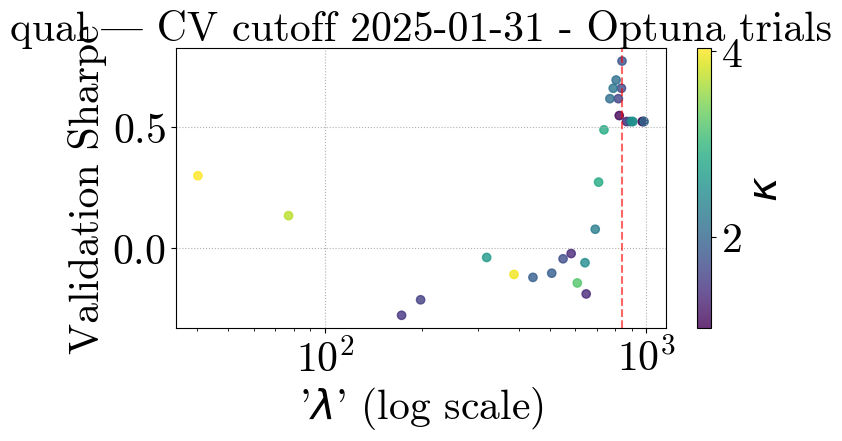

[I 2025-05-06 06:06:01,851] A new study created in memory with name: no-name-17ef3b9e-2b44-42c2-b754-a6c17f25f051
[I 2025-05-06 06:06:07,537] Trial 0 finished with value: 0.5759470638299501 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.5759470638299501.
[I 2025-05-06 06:06:09,105] Trial 1 finished with value: 0.5759470638299501 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.5759470638299501.
[I 2025-05-06 06:06:21,568] Trial 2 finished with value: 0.5045139796485952 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.5759470638299501.
[I 2025-05-06 06:06:34,003] Trial 3 finished with value: 0.3718868425768002 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.5759470638299501.
[I 2025-05-06 06:06:34,854] Trial 4 finished with value: 0.5759470638299501 and paramete

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.5759


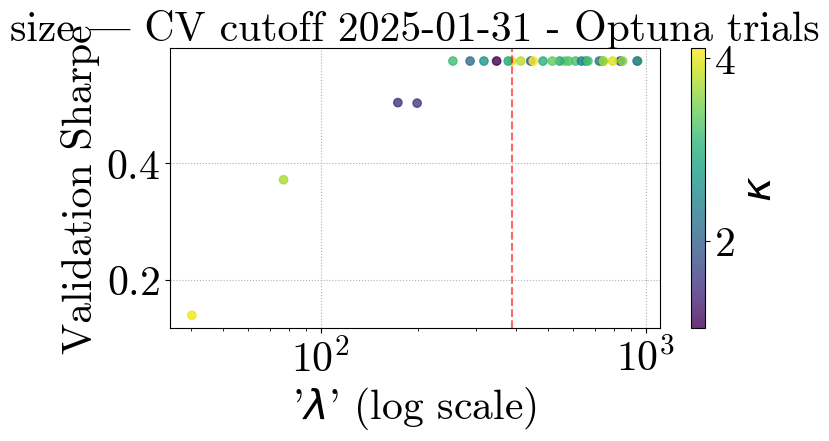

[I 2025-05-06 06:08:27,149] A new study created in memory with name: no-name-0a31f8e5-8dec-4538-b4d5-843b3603659f
[I 2025-05-06 06:08:32,580] Trial 0 finished with value: -0.025795602418650573 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.025795602418650573.
[I 2025-05-06 06:08:36,587] Trial 1 finished with value: 0.19614966825137362 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.19614966825137362.
[I 2025-05-06 06:08:41,566] Trial 2 finished with value: 0.7980679472718009 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: 0.7980679472718009.
[I 2025-05-06 06:08:56,282] Trial 3 finished with value: 0.4727345045574748 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: 0.7980679472718009.
[I 2025-05-06 06:09:00,065] Trial 4 finished with value: 0.25031983834267196 and

Optuna best λ=198.1885, κ=1.5727916564869089, Sharpe=1.0073


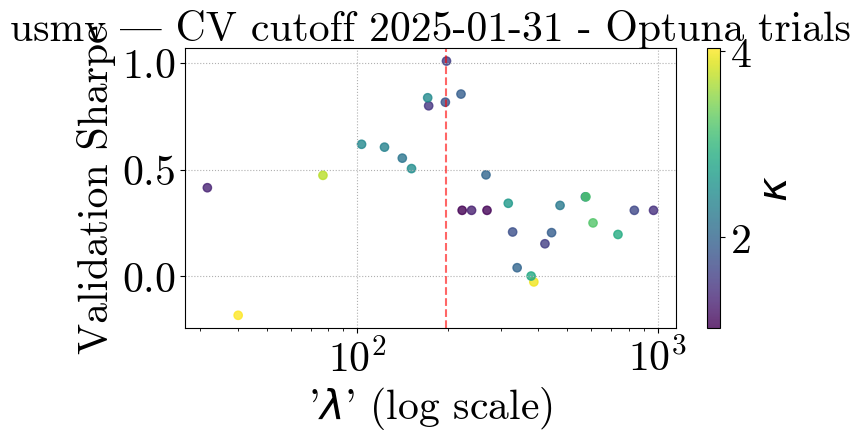

[I 2025-05-06 06:11:43,680] A new study created in memory with name: no-name-7024ea7e-05e8-4d01-ba70-5b4ca2656410
[I 2025-05-06 06:11:48,630] Trial 0 finished with value: 0.8601557582338649 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.8601557582338649.
[I 2025-05-06 06:11:53,535] Trial 1 finished with value: 0.8601557582338649 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.8601557582338649.
[I 2025-05-06 06:12:05,319] Trial 2 finished with value: 0.5047556342875771 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.8601557582338649.
[I 2025-05-06 06:12:22,628] Trial 3 finished with value: -0.6249422812141954 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.8601557582338649.
[I 2025-05-06 06:12:27,913] Trial 4 finished with value: 0.8601557582338649 and paramet

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.8602


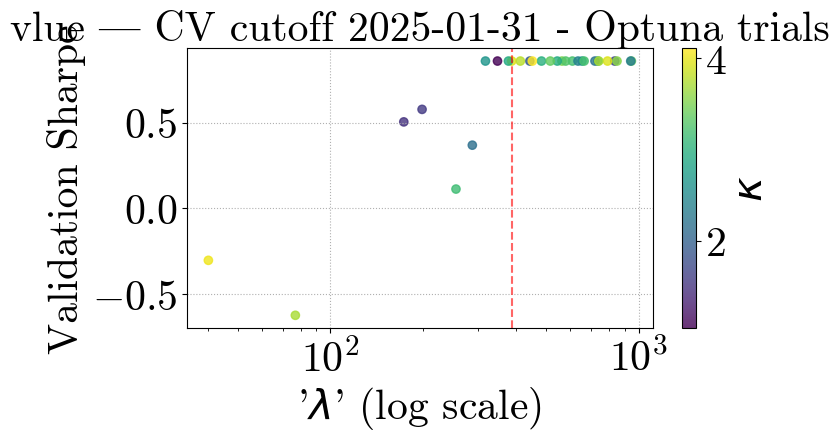

[I 2025-05-06 06:15:07,518] A new study created in memory with name: no-name-980e2835-6ba7-47df-a336-9f1a4496ca5c
[I 2025-05-06 06:15:11,982] Trial 0 finished with value: 0.4742212883848535 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.4742212883848535.
[I 2025-05-06 06:15:16,546] Trial 1 finished with value: 0.4742212883848535 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.4742212883848535.
[I 2025-05-06 06:15:22,813] Trial 2 finished with value: 0.4742212883848535 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.4742212883848535.
[I 2025-05-06 06:15:55,448] Trial 3 finished with value: 0.414388862466211 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.4742212883848535.
[I 2025-05-06 06:16:00,167] Trial 4 finished with value: 0.4742212883848535 and parameter

Optuna best λ=40.1728, κ=4.029130915629118, Sharpe=0.4877


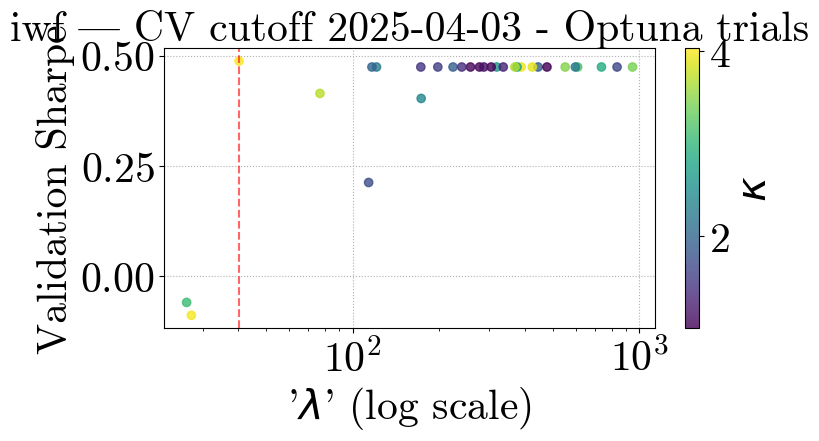

[I 2025-05-06 06:19:45,347] A new study created in memory with name: no-name-dc6cedc5-bc7f-4bd0-9517-8af77b3936c5
[I 2025-05-06 06:19:50,913] Trial 0 finished with value: -0.1303622050299615 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.1303622050299615.
[I 2025-05-06 06:19:55,423] Trial 1 finished with value: -0.3198383125255805 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.1303622050299615.
[I 2025-05-06 06:20:12,296] Trial 2 finished with value: -0.04969828508463983 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 2 with value: -0.04969828508463983.
[I 2025-05-06 06:20:29,263] Trial 3 finished with value: -0.46806920028498955 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 2 with value: -0.04969828508463983.
[I 2025-05-06 06:20:35,005] Trial 4 finished with value: -0.2454436410580941

Optuna best λ=968.1857, κ=1.030171214114906, Sharpe=0.1871


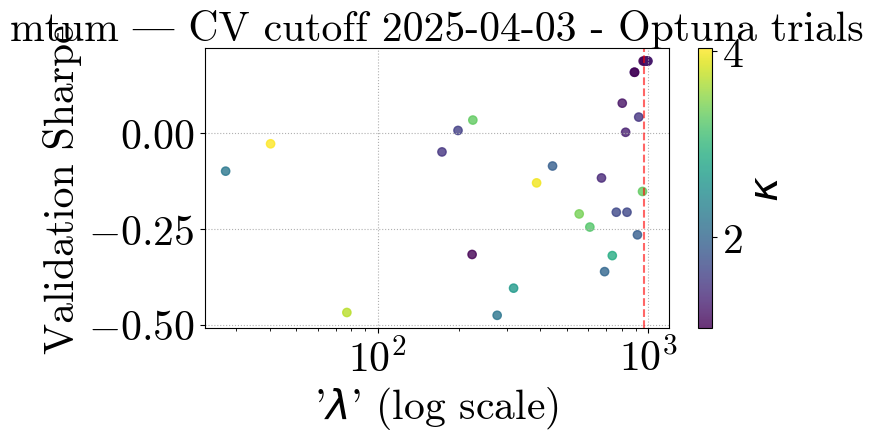

[I 2025-05-06 06:23:12,482] A new study created in memory with name: no-name-eac13b61-0b49-4ec1-9a8d-92f6dbb58c5b
[I 2025-05-06 06:23:19,076] Trial 0 finished with value: -0.14555387942905393 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.14555387942905393.
[I 2025-05-06 06:23:23,410] Trial 1 finished with value: 0.6958945601379956 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 1 with value: 0.6958945601379956.
[I 2025-05-06 06:23:32,160] Trial 2 finished with value: -0.45922930662376693 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 1 with value: 0.6958945601379956.
[I 2025-05-06 06:23:45,778] Trial 3 finished with value: -0.010017105226239817 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 1 with value: 0.6958945601379956.
[I 2025-05-06 06:23:50,607] Trial 4 finished with value: 0.7975951881193271 and

Optuna best λ=625.9848, κ=3.4069434472890148, Sharpe=0.8308


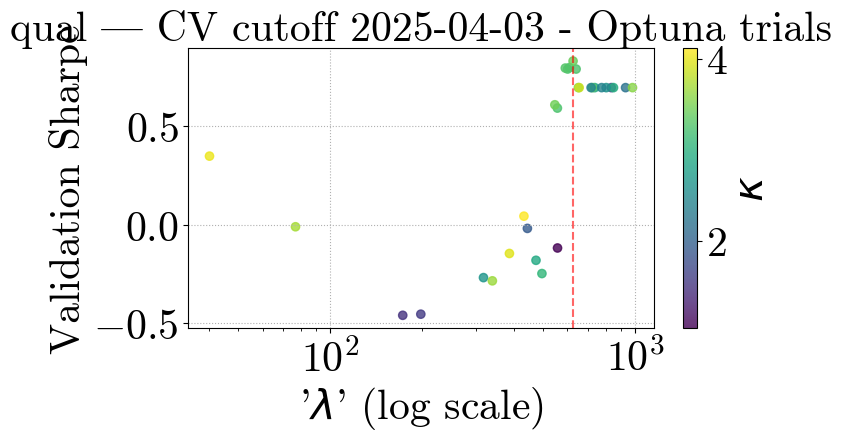

[I 2025-05-06 06:25:39,357] A new study created in memory with name: no-name-eff31d2a-ea0d-40e8-9acd-49ae20f62b92
[I 2025-05-06 06:25:45,559] Trial 0 finished with value: 0.19264847005805094 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.19264847005805094.
[I 2025-05-06 06:25:46,453] Trial 1 finished with value: 0.19264847005805094 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.19264847005805094.
[I 2025-05-06 06:25:58,126] Trial 2 finished with value: 0.1325061890294562 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.19264847005805094.
[I 2025-05-06 06:26:12,640] Trial 3 finished with value: 0.10819427056303385 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.19264847005805094.
[I 2025-05-06 06:26:14,423] Trial 4 finished with value: 0.19264847005805094 and 

Optuna best λ=387.0493, κ=3.9691811987040015, Sharpe=0.1926


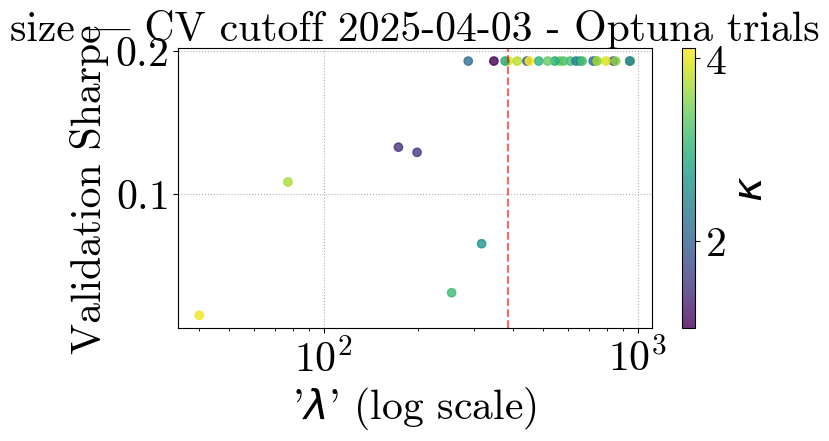

[I 2025-05-06 06:28:27,122] A new study created in memory with name: no-name-78cf4976-ab9f-429c-b787-78f2856eb7fd
[I 2025-05-06 06:28:32,893] Trial 0 finished with value: -0.04627055119308179 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: -0.04627055119308179.
[I 2025-05-06 06:28:34,106] Trial 1 finished with value: -0.04627055119308183 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: -0.04627055119308179.
[I 2025-05-06 06:28:41,237] Trial 2 finished with value: -0.1338490172577731 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: -0.04627055119308179.
[I 2025-05-06 06:28:50,172] Trial 3 finished with value: 0.01925193109232353 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 3 with value: 0.01925193109232353.
[I 2025-05-06 06:28:54,027] Trial 4 finished with value: -0.046270551193081

Optuna best λ=150.8384, κ=2.9819723710793995, Sharpe=0.5333


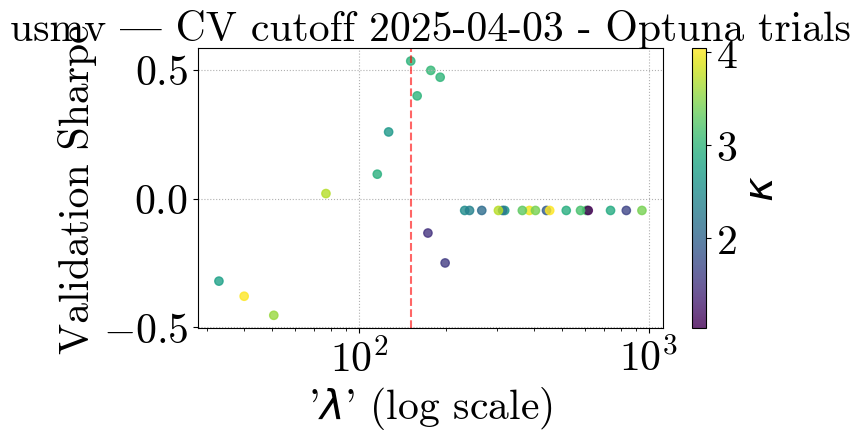

[I 2025-05-06 06:32:20,907] A new study created in memory with name: no-name-9e226545-f5af-402a-ac4d-07fb3918c8b5
[I 2025-05-06 06:32:26,752] Trial 0 finished with value: 0.46988148615538 and parameters: {'lambda': 387.04931647041525, 'kappa': 3.9691811987040015}. Best is trial 0 with value: 0.46988148615538.
[I 2025-05-06 06:32:30,333] Trial 1 finished with value: 0.46988148615538 and parameters: {'lambda': 737.354062975177, 'kappa': 2.869673679819506}. Best is trial 0 with value: 0.46988148615538.
[I 2025-05-06 06:32:40,074] Trial 2 finished with value: -0.0004942451892287768 and parameters: {'lambda': 172.89826763358778, 'kappa': 1.487187364027523}. Best is trial 0 with value: 0.46988148615538.
[I 2025-05-06 06:32:52,138] Trial 3 finished with value: -0.9252037585528243 and parameters: {'lambda': 76.92193992483547, 'kappa': 3.705159593645523}. Best is trial 0 with value: 0.46988148615538.
[I 2025-05-06 06:32:57,257] Trial 4 finished with value: 0.46988148615538 and parameters: {'lam

Optuna best λ=835.7938, κ=1.6631574710979753, Sharpe=0.4699


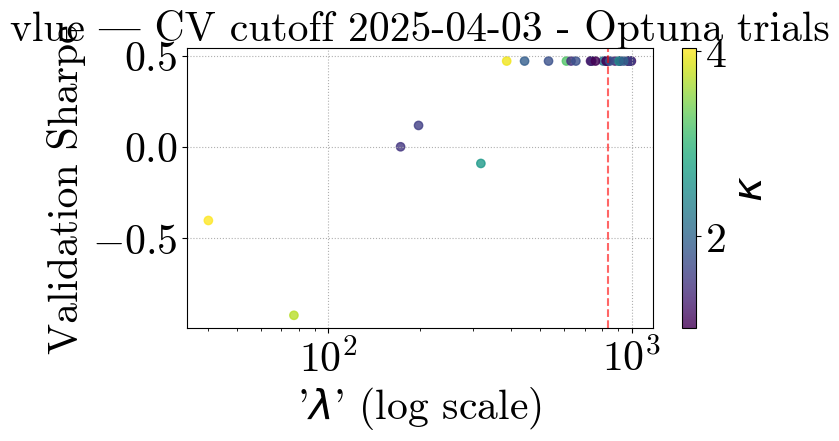

C:\Users\victo\AppData\Local\Temp\ipykernel_8804\327231587.py:123: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  plt.tight_layout()
d:\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8212 (\N{EM DASH}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


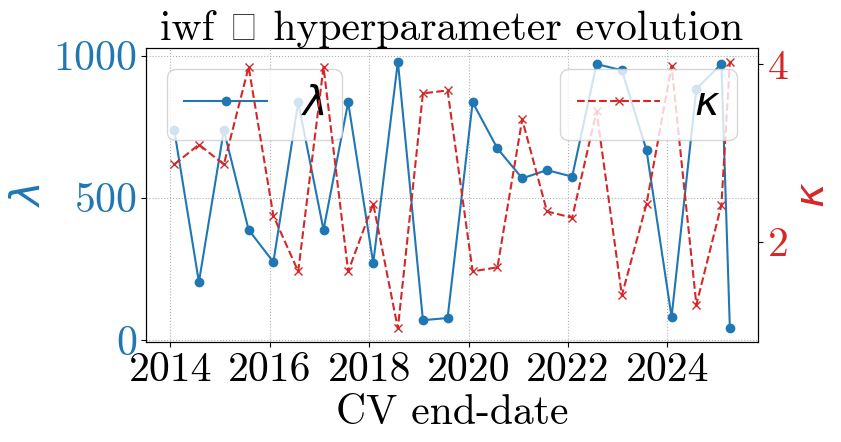

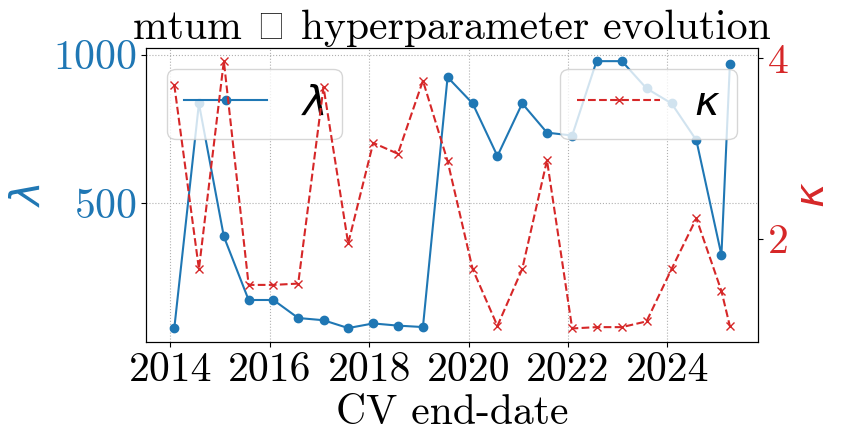

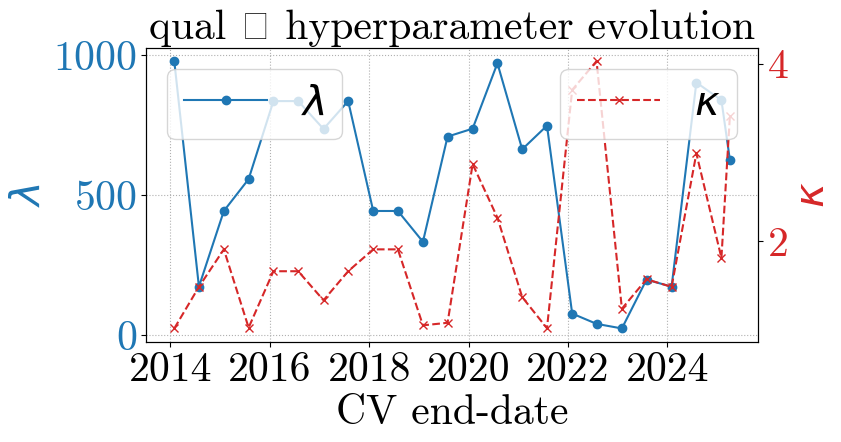

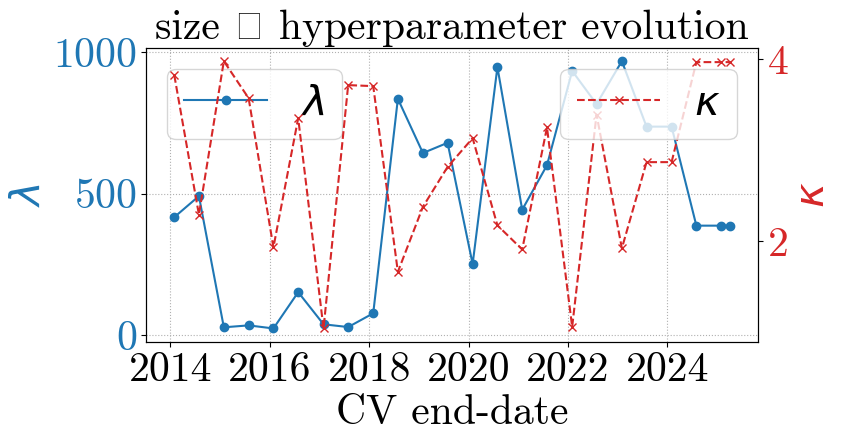

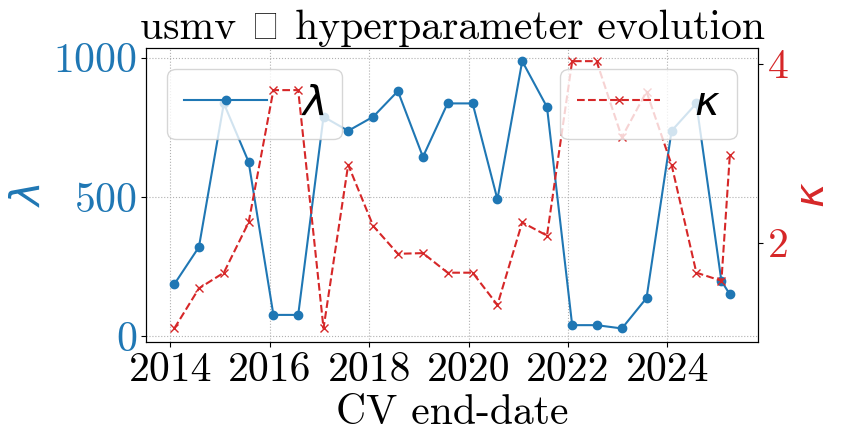

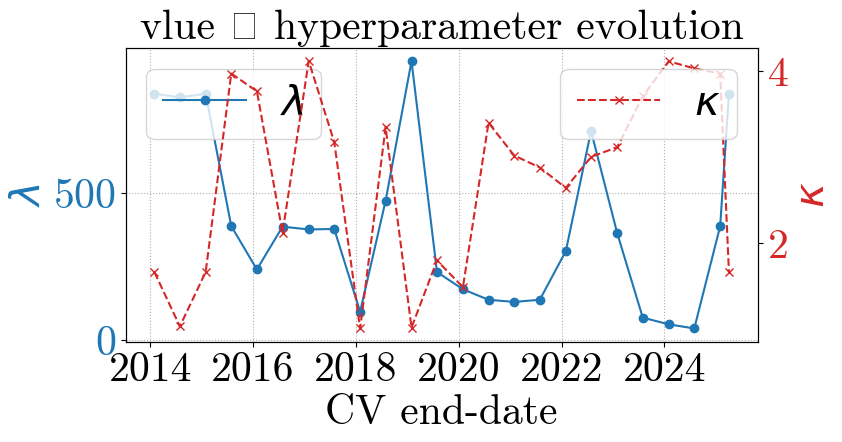

Saved tuned parameters to cv_params.parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   737.354063    2.869674
6  2014-07-31    iwf   203.369514    3.094032
12 2015-01-30    iwf   737.354063    2.869674
18 2015-07-31    iwf   387.049316    3.969181
24 2016-01-29    iwf   273.909458    2.289418


In [5]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

# lambda_values = np.linspace(30, 400, 5)
# # kappa grid can depend on feature count; a simple fixed grid is fine
# kappa_values  = np.array([2.0, 3.0, 4.0]) # kappa = trial.suggest_int("kappa", 1, np.sqrt(17))

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(
    factors,
    factor_data_dict,
    cv_dates=recross_val_boundaries,
    initial_train_start="2002-05-31"
)

print("Saved tuned parameters to cv_params.parquet")
print(cv_table.head())

In [ ]:
# # 1) Cast kappa to float
# cv_table["best_kappa"] = cv_table["best_kappa"].astype(float)

# # 2) (Optional) verify
# print(cv_table.dtypes)

# # 3) Save out
# cv_table.to_parquet("cv_params_bayes_v2.parquet", index=False) # v2 is the one searching from 0.1 to 1000


date           datetime64[ns]
factor                 object
best_lambda           float64
best_kappa            float64
dtype: object


In [5]:
with open("cell_output.txt", "w") as f:
    for r in records:  # or whatever your output list is
        f.write(str(r) + "\n")


NameError: name 'records' is not defined